In [1]:
import numpy as np
import matplotlib.pyplot as plt  # To visualize
import pandas as pd  # To read data
import matplotlib.dates as mdates
import matplotlib.ticker as mtick
from matplotlib import rc
import seaborn as sns
from datetime import date, timedelta
from datetime import datetime
import matplotlib.dates as mdates
from matplotlib.ticker import AutoMinorLocator, MultipleLocator, FuncFormatter
import copy

import sys
import geopandas as gpd
import matplotlib.colors as mcolors
import matplotlib.cm as cm

In [2]:
!git fetch upstream
!git merge --no-edit upstream/master

remote: Enumerating objects: 84, done.
remote: Counting objects: 100% (84/84), done.
remote: Compressing objects: 100% (49/49), done.
remote: Total 84 (delta 50), reused 68 (delta 35), pack-reused 0
Unpacking objects: 100% (84/84), 10.54 MiB | 665.00 KiB/s, done.
From https://github.com/italia/covid19-opendata-vaccini
   065873a1..f38adb60  master     -> upstream/master
Merge made by the 'ort' strategy.
 dati/anagrafica-vaccini-summary-latest.csv        |     20 +-
 dati/anagrafica-vaccini-summary-latest.json       |    192 +-
 dati/consegne-vaccini-latest.csv                  |      7 +-
 dati/consegne-vaccini-latest.json                 |  12379 +-
 dati/last-update-dataset.json                     |      2 +-
 dati/soggetti-guariti.csv                         |    378 +-
 dati/soggetti-guariti.json                        |    838 +-
 dati/somministrazioni-vaccini-latest.csv          |   6059 +-
 dati/somministrazioni-vaccini-latest.json         |      2 +-
 dati/somministrazioni-vac

In [3]:
anag       = pd.read_csv('../dati/anagrafica-vaccini-summary-latest.csv')  # load data set
somm1      = pd.read_csv('../dati/somministrazioni-vaccini-latest.csv')
cons       = pd.read_csv('../dati/consegne-vaccini-latest.csv')
somm2      = pd.read_csv('../dati/somministrazioni-vaccini-summary-latest.csv')
punti_somm = pd.read_csv('../dati/punti-somministrazione-latest.csv')
vaccini    = pd.read_csv('../dati/vaccini-summary-latest.csv')
platea     = pd.read_csv('../dati/platea.csv')

total = vaccini['dosi_consegnate'].sum()
somm2

,data,area,totale,m,f,d1,d2,dpi,db1,dbi,db2,N1,N2,ISTAT,reg
0,2021-04-11,CAM,17535,8613,8922,15068,2090,377,0,0,0,ITF,ITF3,15,Campania
1,2022-07-06,CAM,1461,724,737,38,46,7,539,265,566,ITF,ITF3,15,Campania
2,2021-02-13,FVG,580,182,398,570,8,2,0,0,0,ITH,ITH4,6,Friuli-Venezia Giulia
3,2021-02-18,LAZ,10223,5102,5121,9116,961,146,0,0,0,ITI,ITI4,12,Lazio
4,2021-08-17,EMR,22468,12353,10115,14488,6875,1105,0,0,0,ITH,ITH5,8,Emilia-Romagna
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11627,2021-09-20,UMB,2659,1414,1245,795,1718,46,100,0,0,ITI,ITI2,10,Umbria
11628,2021-03-05,TOS,16906,6695,10211,11926,4762,218,0,0,0,ITI,ITI1,9,Toscana
11629,2021-04-26,CAL,10211,5072,5139,7712,2446,53,0,0,0,ITF,ITF6,18,Calabria
11630,2021-06-15,CAM,18701,9106,9595,10929,7441,331,0,0,0,ITF,ITF3,15,Campania


In [4]:
from PIL import Image
import matplotlib.pyplot as plt
from matplotlib.offsetbox import ( OffsetImage,AnchoredOffsetbox)


def watermark2(ax=None):
    if ax is None:
        ax = plt.gca()
    img = Image.open('../coccarda.png')
    width, height = ax.figure.get_size_inches()*fig.dpi
    wm_width = int(width/20) # make the watermark 1/4 of the figure size
    scaling = (wm_width / float(img.size[0]))
    wm_height = int(float(img.size[1])*float(scaling))
    img = img.resize((wm_width, wm_height), Image.ANTIALIAS)

    imagebox = OffsetImage(img, zoom=1, alpha=0.2)
    imagebox.image.axes = ax

    ao = AnchoredOffsetbox(loc = 'upper right', pad=0.01, borderpad=0, child=imagebox)
    ao.patch.set_alpha(0)
    ax.add_artist(ao)

In [5]:
NomiRegioni = sorted(somm1.reg.unique())
PopoRegioni = [1312000,562869,1947000,5802000,4459000,1215000,5879000,1551000,10060000,1525000,305617,4356000,520891,538223,4029000,1640000,5000000,3730000,882015,125666,4906000]
DictRegioni = dict(zip(NomiRegioni, PopoRegioni))
PopoItalia  = 59550000

#create a data frame dictionary to store your data frames
somministrazioni       = {elem : pd.DataFrame for elem in NomiRegioni}
somministrazioni_l     = {elem : pd.DataFrame for elem in NomiRegioni}
consegne               = {elem : pd.DataFrame for elem in NomiRegioni}

today = datetime.today()#.strftime('%d/%m/%Y')
yesterday = (date.today() - timedelta(days=1))#.strftime('%d/%m/%Y')
idx = pd.date_range('27/12/2020', yesterday)

for key in somministrazioni.keys():
    somministrazioni[key]                          = somm1[:][somm1.reg == key]
    somministrazioni[key]['data'] = pd.to_datetime(somministrazioni[key]['data'], format='%Y-%m-%d', yearfirst=True)

for key in consegne.keys():
    consegne[key] = cons[:][cons.reg == key]
    consegne[key]['data_consegna'] = pd.to_datetime(consegne[key]['data_consegna'], format='%Y-%m-%d', yearfirst=True)

for key in somministrazioni_l.keys():
    somministrazioni_l[key]                          = somm2[:][somm2.reg == key]
    somministrazioni_l[key]['data'] = pd.to_datetime(somministrazioni_l[key]['data'], format='%Y-%m-%d', yearfirst=True)
    somministrazioni_l[key]['new_date']              = somministrazioni_l[key]['data'].dt.date
    somministrazioni_l[key]                          = somministrazioni_l[key].set_index('new_date')
    somministrazioni_l[key].index                    = pd.DatetimeIndex(somministrazioni_l[key].index)
    somministrazioni_l[key].sort_index(inplace=True)
    somministrazioni_l[key]                          = somministrazioni_l[key].reindex(idx)
    somministrazioni_l[key].index                    = somministrazioni_l[key].index.strftime('%d/%m/%Y')
    somministrazioni_l[key].area.fillna(method='ffill',inplace=True)
    somministrazioni_l[key].N1.fillna(method='ffill',inplace=True)
    somministrazioni_l[key].N2.fillna(method='ffill',inplace=True)
    somministrazioni_l[key].ISTAT.fillna(method='ffill',inplace=True)
    somministrazioni_l[key].reg.fillna(method='ffill',inplace=True)
    somministrazioni_l[key].fillna(0,inplace=True)

/home/aidin/anaconda3/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3397: UserWarning: Parsing '27/12/2020' in DD/MM/YYYY format. Provide format or specify infer_datetime_format=True for consistent parsing.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [6]:
italia = copy.deepcopy(somministrazioni_l['Emilia-Romagna'])

italia['totale'] = sum(somministrazioni_l[key]['totale'].fillna(0) for key in somministrazioni_l.keys())
italia[     'm'] = sum(somministrazioni_l[key][     'm'].fillna(0) for key in somministrazioni_l.keys())
italia[     'f'] = sum(somministrazioni_l[key][     'f'].fillna(0) for key in somministrazioni_l.keys())
italia[    'd1'] = sum(somministrazioni_l[key][    'd1'].fillna(0) for key in somministrazioni_l.keys())
italia[    'd2'] = sum(somministrazioni_l[key][    'd2'].fillna(0) for key in somministrazioni_l.keys())
italia[   'dpi'] = sum(somministrazioni_l[key][   'dpi'].fillna(0) for key in somministrazioni_l.keys())
italia[   'db1'] = sum(somministrazioni_l[key][   'db1'].fillna(0) for key in somministrazioni_l.keys())
italia[   'dbi'] = sum(somministrazioni_l[key][   'dbi'].fillna(0) for key in somministrazioni_l.keys())
italia[   'db2'] = sum(somministrazioni_l[key][   'db2'].fillna(0) for key in somministrazioni_l.keys())


italia.drop(columns=['N1','N2','ISTAT'], axis=1, inplace = True)
italia['area'] = 'ITA'
italia['reg'] = 'Italia'
italia

,data,area,totale,m,f,d1,d2,dpi,db1,dbi,db2,reg
27/12/2020,2020-12-27 00:00:00,ITA,7349.0,3498.0,3851.0,7332.0,0.0,17.0,0.0,0.0,0.0,Italia
28/12/2020,2020-12-28 00:00:00,ITA,1505.0,689.0,816.0,1503.0,0.0,2.0,0.0,0.0,0.0,Italia
29/12/2020,0,ITA,1099.0,487.0,612.0,1098.0,0.0,1.0,0.0,0.0,0.0,Italia
30/12/2020,2020-12-30 00:00:00,ITA,4887.0,1965.0,2922.0,4881.0,0.0,6.0,0.0,0.0,0.0,Italia
31/12/2020,2020-12-31 00:00:00,ITA,25952.0,10067.0,15885.0,25902.0,0.0,50.0,0.0,0.0,0.0,Italia
...,...,...,...,...,...,...,...,...,...,...,...,...
12/07/2022,2022-07-12 00:00:00,ITA,36070.0,17081.0,18989.0,452.0,512.0,118.0,8893.0,6347.0,19748.0,Italia
13/07/2022,2022-07-13 00:00:00,ITA,48812.0,23582.0,25230.0,524.0,490.0,119.0,9973.0,8854.0,28852.0,Italia
14/07/2022,2022-07-14 00:00:00,ITA,58664.0,29041.0,29623.0,492.0,499.0,105.0,9980.0,10265.0,37323.0,Italia
15/07/2022,2022-07-15 00:00:00,ITA,67675.0,33698.0,33977.0,473.0,469.0,136.0,10360.0,16715.0,39522.0,Italia


In [7]:
for key in somministrazioni_l.keys():
    somministrazioni_l[key][           'totale_per100'] = somministrazioni_l[key][           'totale'] / DictRegioni[key] * 100
    somministrazioni_l[key][               'd1_per100'] = somministrazioni_l[key][               'd1'] / DictRegioni[key] * 100
    somministrazioni_l[key][               'd2_per100'] = somministrazioni_l[key][               'd2'] / DictRegioni[key] * 100
    somministrazioni_l[key][              'dpi_per100'] = somministrazioni_l[key][              'dpi'] / DictRegioni[key] * 100
    somministrazioni_l[key][              'db1_per100'] = somministrazioni_l[key][              'db1'] / DictRegioni[key] * 100
    somministrazioni_l[key][              'dbi_per100'] = somministrazioni_l[key][              'dbi'] / DictRegioni[key] * 100
    somministrazioni_l[key][              'db2_per100'] = somministrazioni_l[key][              'db2'] / DictRegioni[key] * 100
    somministrazioni_l[key][            'media_totale'] = somministrazioni_l[key][           'totale'].rolling(window=7, min_periods=1).mean()
    somministrazioni_l[key][                'media_d1'] = somministrazioni_l[key][               'd1'].rolling(window=7, min_periods=1).mean()
    somministrazioni_l[key][                'media_d2'] = somministrazioni_l[key][               'd2'].rolling(window=7, min_periods=1).mean()
    somministrazioni_l[key][               'media_dpi'] = somministrazioni_l[key][              'dpi'].rolling(window=7, min_periods=1).mean()
    somministrazioni_l[key][               'media_db1'] = somministrazioni_l[key][              'db1'].rolling(window=7, min_periods=1).mean()
    somministrazioni_l[key][               'media_dbi'] = somministrazioni_l[key][              'dbi'].rolling(window=7, min_periods=1).mean()
    somministrazioni_l[key][               'media_db2'] = somministrazioni_l[key][              'db2'].rolling(window=7, min_periods=1).mean()
    somministrazioni_l[key][     'media_totale_per100'] = somministrazioni_l[key][     'media_totale'] / DictRegioni[key] * 100
    somministrazioni_l[key][         'media_d1_per100'] = somministrazioni_l[key][         'media_d1'] / DictRegioni[key] * 100
    somministrazioni_l[key][         'media_d2_per100'] = somministrazioni_l[key][         'media_d2'] / DictRegioni[key] * 100
    somministrazioni_l[key][        'media_dpi_per100'] = somministrazioni_l[key][        'media_dpi'] / DictRegioni[key] * 100
    somministrazioni_l[key][        'media_db1_per100'] = somministrazioni_l[key][        'media_db1'] / DictRegioni[key] * 100
    somministrazioni_l[key][        'media_dbi_per100'] = somministrazioni_l[key][        'media_dbi'] / DictRegioni[key] * 100
    somministrazioni_l[key][        'media_db2_per100'] = somministrazioni_l[key][        'media_db2'] / DictRegioni[key] * 100
    somministrazioni_l[key][       'cumulativa_totale'] = somministrazioni_l[key][           'totale'].cumsum()
    somministrazioni_l[key][           'cumulativa_d1'] = somministrazioni_l[key][               'd1'].cumsum()
    somministrazioni_l[key][           'cumulativa_d2'] = somministrazioni_l[key][               'd2'].cumsum()
    somministrazioni_l[key][          'cumulativa_dpi'] = somministrazioni_l[key][              'dpi'].cumsum()
    somministrazioni_l[key][          'cumulativa_db1'] = somministrazioni_l[key][              'db1'].cumsum()
    somministrazioni_l[key][          'cumulativa_dbi'] = somministrazioni_l[key][              'dbi'].cumsum()
    somministrazioni_l[key][          'cumulativa_db2'] = somministrazioni_l[key][              'db2'].cumsum()
    somministrazioni_l[key]['cumulativa_totale_per100'] = somministrazioni_l[key]['cumulativa_totale'] / DictRegioni[key] * 100
    somministrazioni_l[key][    'cumulativa_d1_per100'] = somministrazioni_l[key][    'cumulativa_d1'] / DictRegioni[key] * 100
    somministrazioni_l[key][    'cumulativa_d2_per100'] = somministrazioni_l[key][    'cumulativa_d2'] / DictRegioni[key] * 100
    somministrazioni_l[key][   'cumulativa_dpi_per100'] = somministrazioni_l[key][   'cumulativa_dpi'] / DictRegioni[key] * 100
    somministrazioni_l[key][   'cumulativa_db1_per100'] = somministrazioni_l[key][   'cumulativa_db1'] / DictRegioni[key] * 100
    somministrazioni_l[key][   'cumulativa_dbi_per100'] = somministrazioni_l[key][   'cumulativa_dbi'] / DictRegioni[key] * 100
    somministrazioni_l[key][   'cumulativa_db2_per100'] = somministrazioni_l[key][   'cumulativa_db2'] / DictRegioni[key] * 100

italia[    'totale_per100'] = italia['totale'] / PopoItalia * 100
italia[        'd1_per100'] = italia[    'd1'] / PopoItalia * 100
italia[        'd2_per100'] = italia[    'd2'] / PopoItalia * 100
italia[       'dpi_per100'] = italia[   'dpi'] / PopoItalia * 100
italia[       'db1_per100'] = italia[   'db1'] / PopoItalia * 100
italia[       'dbi_per100'] = italia[   'dbi'] / PopoItalia * 100
italia[       'db2_per100'] = italia[   'db2'] / PopoItalia * 100

italia[     'media_totale'] = italia['totale'].rolling(window=7, min_periods=1).mean()
italia[         'media_d1'] = italia[    'd1'].rolling(window=7, min_periods=1).mean()
italia[         'media_d2'] = italia[    'd2'].rolling(window=7, min_periods=1).mean()
italia[        'media_dpi'] = italia[   'dpi'].rolling(window=7, min_periods=1).mean()
italia[        'media_db1'] = italia[   'db1'].rolling(window=7, min_periods=1).mean()
italia[        'media_dbi'] = italia[   'dbi'].rolling(window=7, min_periods=1).mean()
italia[        'media_db2'] = italia[   'db2'].rolling(window=7, min_periods=1).mean()

italia['cumulativa_totale'] = italia['totale'].cumsum()
italia[    'cumulativa_d1'] = italia[    'd1'].cumsum()
italia[    'cumulativa_d2'] = italia[    'd2'].cumsum()
italia[   'cumulativa_dpi'] = italia[   'dpi'].cumsum()
italia[   'cumulativa_db1'] = italia[   'db1'].cumsum()
italia[   'cumulativa_dbi'] = italia[   'dbi'].cumsum()
italia[   'cumulativa_db2'] = italia[   'db2'].cumsum()

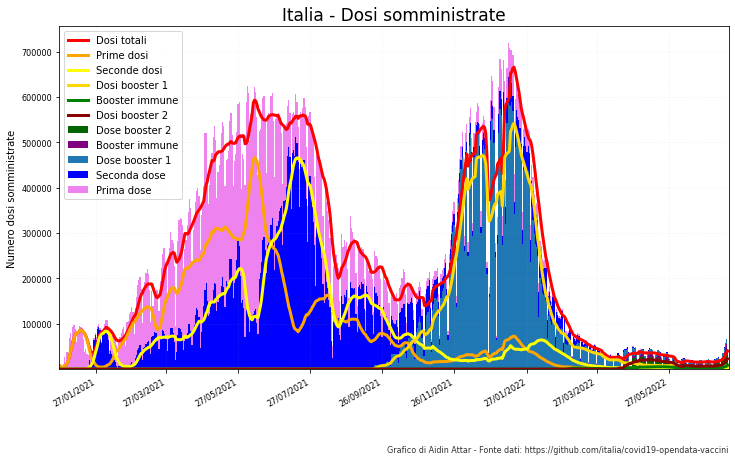

In [8]:
fig, ax = plt.subplots(figsize=(12,7))
label   = ['Dosi totali','Prime dosi','Seconde dosi','Dosi booster 1','Booster immune','Dosi booster 2','Dose booster 2','Booster immune','Dose booster 1', 'Seconda dose','Prima dose' ]
italia[['db2','dbi','db1','d2','d1']].plot.bar(ax = ax, stacked = True, color = ['darkgreen','purple','C0','blue','violet'], width = 1)
italia.plot(y='media_totale', kind = 'line', color =     'red', ax = ax, lw = 3)
italia.plot(y='media_d1',     kind = 'line', color =  'orange', ax = ax, lw = 3)
italia.plot(y='media_d2',     kind = 'line', color =  'yellow', ax = ax, lw = 3)
italia.plot(y='media_db1',    kind = 'line', color =    'gold', ax = ax, lw = 3)
italia.plot(y='media_dbi',    kind = 'line', color =   'green', ax = ax, lw = 3)
italia.plot(y='media_db2',    kind = 'line', color = 'darkred', ax = ax, lw = 3)

ax.legend(label,loc="upper left")
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=2))

ax.set_title('Italia - Dosi somministrate', fontsize=17)
plt.rcParams['font.size'] = '8'
ax.tick_params(axis='both', labelsize=8)
ax.grid(alpha = 0.2,linestyle='dotted')
ax.set_ylabel('Numero dosi somministrate')
ax.set_xlabel("")
fig.autofmt_xdate()

plt.text(0.9, 0.05, 'Grafico di Aidin Attar - Fonte dati: https://github.com/italia/covid19-opendata-vaccini',
         transform=plt.gcf().transFigure,
         fontsize=8, color='black', alpha=0.8,
         ha='right', va='top', rotation='0')

plt.show()

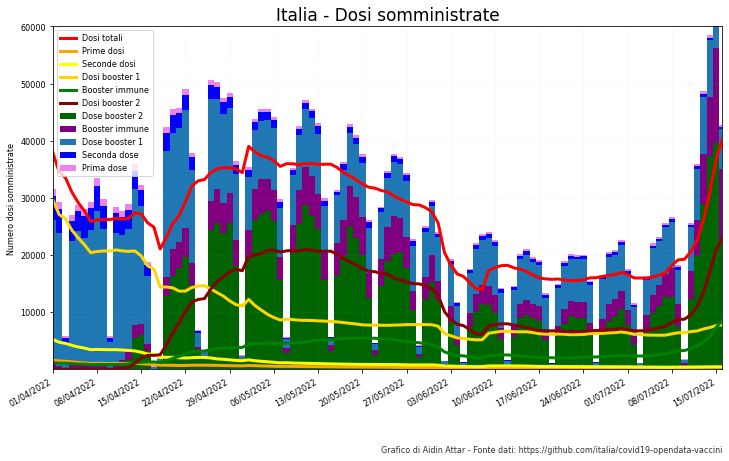

In [9]:
fig, ax = plt.subplots(figsize=(12,7))
label   = ['Dosi totali','Prime dosi','Seconde dosi','Dosi booster 1','Booster immune','Dosi booster 2','Dose booster 2','Booster immune','Dose booster 1', 'Seconda dose','Prima dose' ]
italia[['db2','dbi','db1','d2','d1']].plot.bar(ax = ax, stacked = True, color = ['darkgreen','purple','C0','blue','violet'], width = 1)
ax.plot(italia.index, italia.media_totale, color =     'red', lw = 3)
ax.plot(italia.index,     italia.media_d1, color =  'orange', lw = 3)
ax.plot(italia.index,     italia.media_d2, color =  'yellow', lw = 3)
ax.plot(italia.index,    italia.media_db1, color =    'gold', lw = 3)
ax.plot(italia.index,    italia.media_dbi, color =   'green', lw = 3)
ax.plot(italia.index,    italia.media_db2, color = 'darkred', lw = 3)

ax.set_xlim([date(2022, 4, 1).strftime('%d/%m/%Y'), yesterday.strftime('%d/%m/%Y')])
ax.set_ylim(top=6e4)

ax.legend(label,loc="upper left")
ax.xaxis.set_major_locator(mdates.WeekdayLocator(interval=1))

ax.set_title('Italia - Dosi somministrate', fontsize=17)
plt.rcParams['font.size'] = '8'
ax.tick_params(axis='both', labelsize=8)
ax.grid(alpha = 0.2,linestyle='dotted')
ax.set_ylabel('Numero dosi somministrate')
ax.set_xlabel("")
fig.autofmt_xdate()


plt.text(0.9, 0.05, 'Grafico di Aidin Attar - Fonte dati: https://github.com/italia/covid19-opendata-vaccini',
         transform=plt.gcf().transFigure,
         fontsize=8, color='black', alpha=0.8,
         ha='right', va='top', rotation='0')

plt.show()

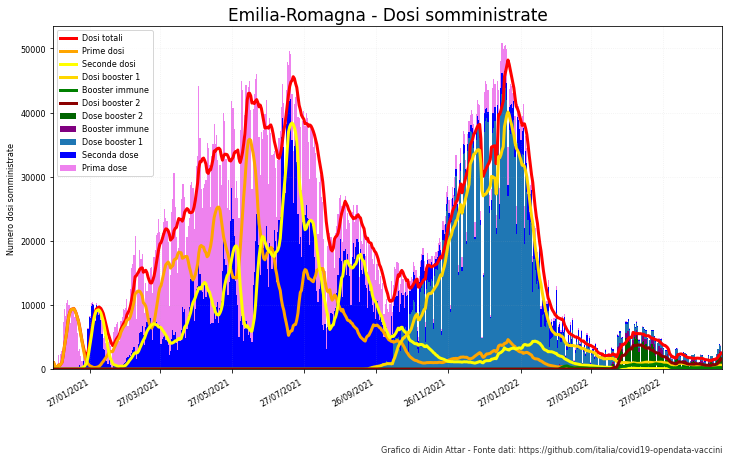

In [10]:
fig, ax = plt.subplots(figsize=(12,7))
label   = ['Dosi totali','Prime dosi','Seconde dosi','Dosi booster 1','Booster immune','Dosi booster 2','Dose booster 2','Booster immune','Dose booster 1', 'Seconda dose','Prima dose' ]
somministrazioni_l['Emilia-Romagna'][['db2','dbi','db1','d2','d1']].plot.bar(ax = ax, stacked = True, color = ['darkgreen','purple','C0','blue','violet'], width = 1)
ax.plot(somministrazioni_l['Emilia-Romagna'].index, somministrazioni_l['Emilia-Romagna'].media_totale, color =     'red', lw = 3)
ax.plot(somministrazioni_l['Emilia-Romagna'].index,     somministrazioni_l['Emilia-Romagna'].media_d1, color =  'orange', lw = 3)
ax.plot(somministrazioni_l['Emilia-Romagna'].index,     somministrazioni_l['Emilia-Romagna'].media_d2, color =  'yellow', lw = 3)
ax.plot(somministrazioni_l['Emilia-Romagna'].index,    somministrazioni_l['Emilia-Romagna'].media_db1, color =    'gold', lw = 3)
ax.plot(somministrazioni_l['Emilia-Romagna'].index,    somministrazioni_l['Emilia-Romagna'].media_dbi, color =   'green', lw = 3)
ax.plot(somministrazioni_l['Emilia-Romagna'].index,    somministrazioni_l['Emilia-Romagna'].media_db2, color = 'darkred', lw = 3)

ax.legend(label,loc="upper left")
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=2))

ax.set_title('Emilia-Romagna - Dosi somministrate', fontsize=17)
plt.rcParams['font.size'] = '8'
ax.tick_params(axis='both', labelsize=8)
ax.grid(alpha = 0.2,linestyle='dotted')
ax.set_ylabel('Numero dosi somministrate')
ax.set_xlabel("")
fig.autofmt_xdate()

plt.text(0.9, 0.05, 'Grafico di Aidin Attar - Fonte dati: https://github.com/italia/covid19-opendata-vaccini',
         transform=plt.gcf().transFigure,
         fontsize=8, color='black', alpha=0.8,
         ha='right', va='top', rotation='0')

plt.show()

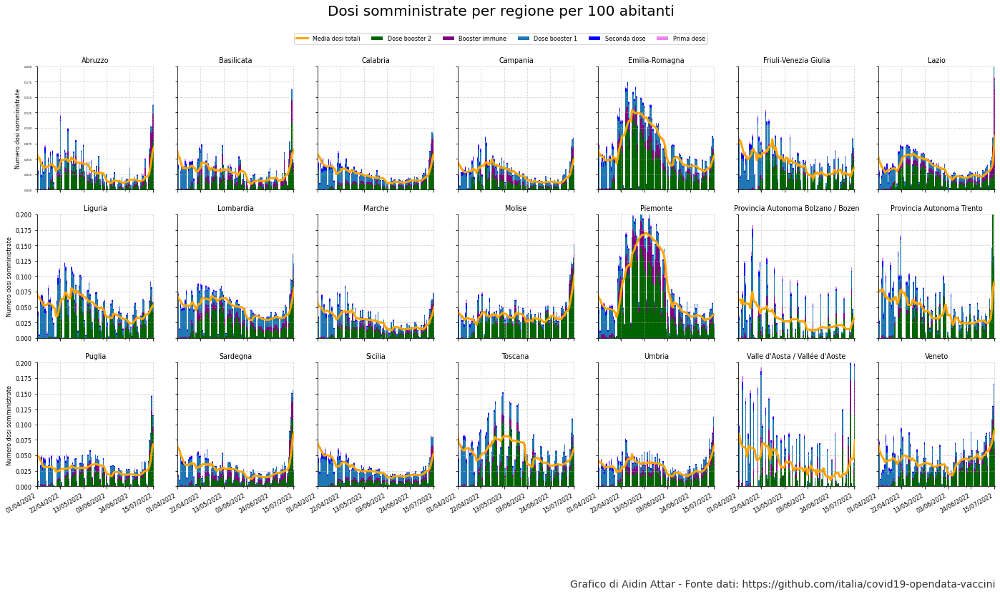

In [11]:
fig, ax = plt.subplots(nrows=3,ncols=7,figsize=(24,12), sharey=True, sharex=True)
x=0
y=0
for key in somministrazioni_l.keys():
    somministrazioni_l[key][['db2_per100',
                             'dbi_per100',
                             'db1_per100',
                             'd2_per100',
                             'd1_per100']].plot.bar(ax = ax[y,x],legend=False,
                                                             stacked = True, color = ['darkgreen','purple','C0','blue','violet'],
                                                             width = 1, title=str(key))
    ax[y,x].plot(somministrazioni_l[key].index,somministrazioni_l[key]['media_totale_per100'], color='orange', lw=3)
    ax[y,x].grid(alpha = 1,linestyle='dotted')
    ax[y,x].spines['right'].set_visible(False)
    ax[y,x].spines['top'].set_visible(False)
    x+=1
    if x==7:
        x=0
        y+=1
ax[0,0].set_xlim([date(2022, 4, 1).strftime('%d/%m/%Y'), yesterday.strftime('%d/%m/%Y')])
ax[0,0].set_ylim(bottom=0, top=.2)
ax[0,0].xaxis.set_major_locator(mdates.WeekdayLocator(interval=3))

fig.suptitle("Dosi somministrate per regione per 100 abitanti", fontsize=20)
plt.rcParams['font.size'] = '8'
ax[0,0].tick_params(axis='both', labelsize=4)
ax[0,0].set_ylabel('Numero dosi somministrate')
ax[1,0].set_ylabel('Numero dosi somministrate')
ax[2,0].set_ylabel('Numero dosi somministrate')
ax[0,0].set_xlabel("")
fig.autofmt_xdate()

labels = ['Media dosi totali','Dose booster 2','Booster immune','Dose booster 1', 'Seconda dose','Prima dose']
fig.legend(labels, loc='center',bbox_to_anchor=(.5,.925), ncol=len(labels), bbox_transform=fig.transFigure)

plt.text(0.9, 0.05, 'Grafico di Aidin Attar - Fonte dati: https://github.com/italia/covid19-opendata-vaccini',
         transform=plt.gcf().transFigure,
         fontsize=14, color='black', alpha=0.8,
         ha='right', va='top', rotation='0')

plt.show()

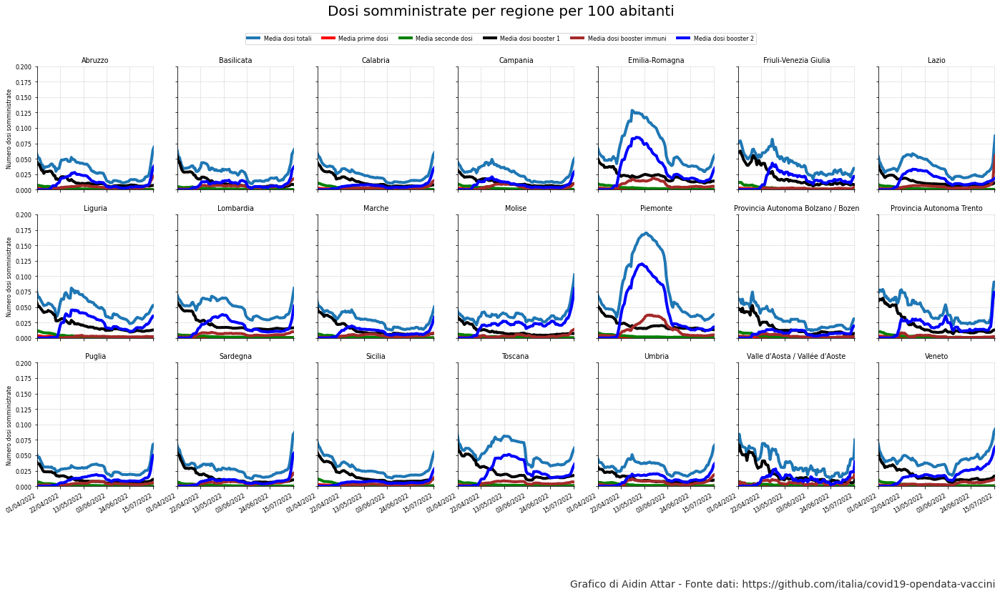

In [12]:
fig, ax = plt.subplots(nrows=3,ncols=7,figsize=(24,12), sharey=True, sharex=True)
x=0
y=0
for key in somministrazioni_l.keys():
    ax[y,x].plot(somministrazioni_l[key].index, somministrazioni_l[key].media_totale_per100, color=   'C0',lw=4)
    ax[y,x].plot(somministrazioni_l[key].index,     somministrazioni_l[key].media_d1_per100, color=  'red',lw=4)
    ax[y,x].plot(somministrazioni_l[key].index,     somministrazioni_l[key].media_d2_per100, color='green',lw=4)
    ax[y,x].plot(somministrazioni_l[key].index,    somministrazioni_l[key].media_db1_per100, color='black',lw=4)
    ax[y,x].plot(somministrazioni_l[key].index,    somministrazioni_l[key].media_dbi_per100, color='brown',lw=4)
    ax[y,x].plot(somministrazioni_l[key].index,    somministrazioni_l[key].media_db2_per100, color= 'blue',lw=4)
    ax[y,x].set_title(key)
    ax[y,x].grid(linestyle='dotted')
    ax[y,x].spines['right'].set_visible(False)
    ax[y,x].spines['top'].set_visible(False)
    x+=1
    if x==7:
        x=0
        y+=1
#ax[0,0].set_ylim([0,40])
ax[0,0].set_xlim([date(2022, 4, 1).strftime('%d/%m/%Y'), yesterday.strftime('%d/%m/%Y')])
ax[0,0].set_ylim(bottom=0, top=.2)
ax[0,0].xaxis.set_major_locator(mdates.WeekdayLocator(interval=3))

fig.suptitle("Dosi somministrate per regione per 100 abitanti", fontsize=20)
plt.rcParams['font.size'] = '8'
ax[0,0].tick_params(axis='both', labelsize=8)
ax[0,0].set_ylabel('Numero dosi somministrate')
ax[1,0].set_ylabel('Numero dosi somministrate')
ax[2,0].set_ylabel('Numero dosi somministrate')
ax[0,0].set_xlabel("")
fig.autofmt_xdate()
labels = ['Media dosi totali', 'Media prime dosi', 'Media seconde dosi', 'Media dosi booster 1', 'Media dosi booster immuni', 'Media dosi booster 2']
fig.legend(labels, loc='center',bbox_to_anchor=(.5,.925), ncol=len(labels), bbox_transform=fig.transFigure)

plt.text(0.9, 0.05, 'Grafico di Aidin Attar - Fonte dati: https://github.com/italia/covid19-opendata-vaccini',
         transform=plt.gcf().transFigure,
         fontsize=14, color='black', alpha=0.8,
         ha='right', va='top', rotation='0')

plt.show()

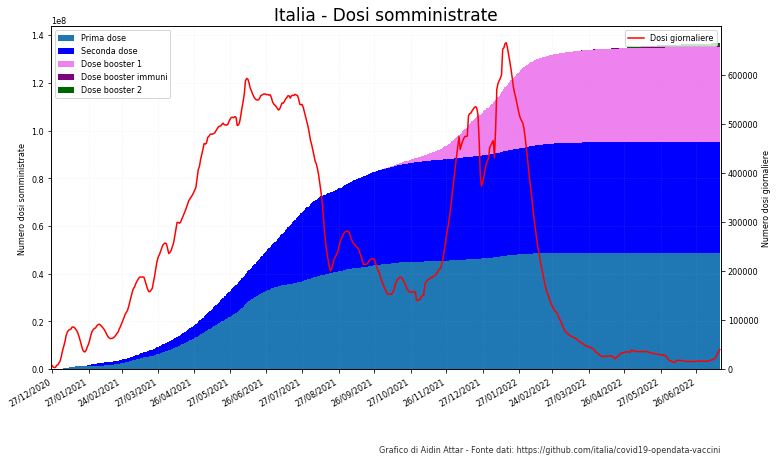

In [13]:
fig, ax = plt.subplots(figsize=(12,7))

label   = ['Prima dose','Seconda dose','Dose booster 1', 'Dose booster immuni', 'Dose booster 2']
italia[['cumulativa_d1','cumulativa_d2','cumulativa_db1','cumulativa_dbi','cumulativa_db2']].plot.bar(ax = ax, stacked = True, color = ['C0','blue','violet','purple','darkgreen'], width = 1)


#ax.set_xlim([date(2022, 4, 1).strftime('%d/%m/%Y'), yesterday.strftime('%d/%m/%Y')])

ax.legend(label,loc="upper left")
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=1))

ax.set_title('Italia - Dosi somministrate', fontsize=17)
plt.rcParams['font.size'] = '8'
ax.tick_params(axis='both', labelsize=8)
ax.grid(alpha = 0.2,linestyle='dotted')
ax.set_ylabel('Numero dosi somministrate')
ax.set_xlabel("")
fig.autofmt_xdate()

ax2 = ax.twinx()  # instantiate a second axes that shares the same x-axis
ax2.plot(italia.index,                   italia.media_totale, color =    'red', label='Dosi giornaliere')
ax2.set_ylabel('Numero dosi giornaliere')
ax2.legend(loc='upper right')
ax2.tick_params(axis='both', labelsize=8)

ax.set_ylim(bottom=0)
ax2.set_ylim(bottom=0)

plt.text(0.9, 0.05, 'Grafico di Aidin Attar - Fonte dati: https://github.com/italia/covid19-opendata-vaccini',
         transform=plt.gcf().transFigure,
         fontsize=8, color='black', alpha=0.8,
         ha='right', va='top', rotation='0')

plt.show()

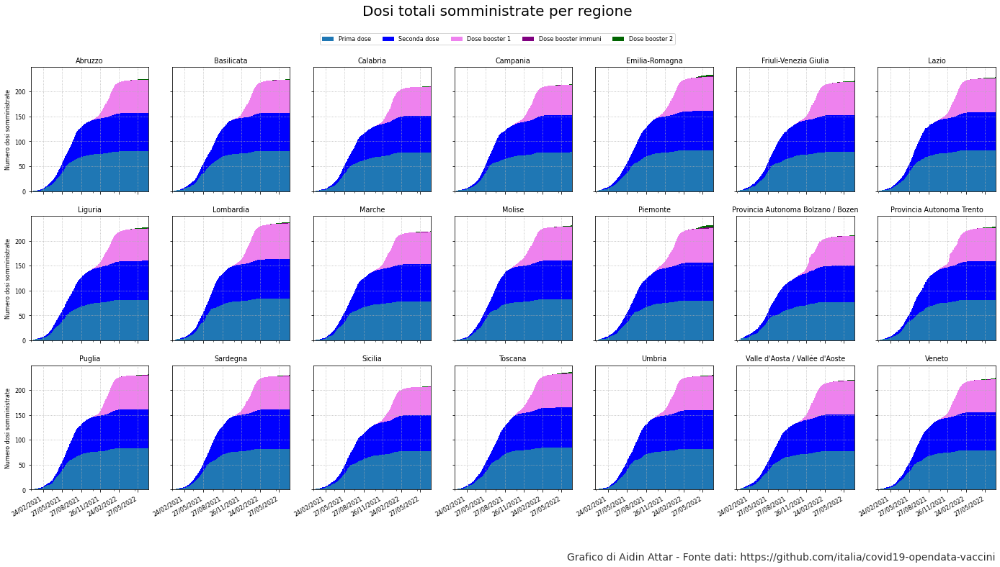

In [14]:
fig, ax = plt.subplots(nrows=3,ncols=7,figsize=(24,12), sharey=True, sharex=True)
x=0
y=0
for key in somministrazioni_l.keys():
    somministrazioni_l[key][['cumulativa_d1_per100',
                             'cumulativa_d2_per100',
                             'cumulativa_db1_per100',
                             'cumulativa_dbi_per100',
                             'cumulativa_db2_per100']].plot.bar(ax = ax[y,x], stacked = True, color = ['C0','blue','violet','purple','darkgreen'],legend=False,width = 1)
    ax[y,x].set_title(str(key))
    ax[y,x].grid(linestyle='dotted')
    x+=1
    if x==7:
        x=0
        y+=1
ax[0,0].xaxis.set_major_locator(mdates.MonthLocator(interval=3))

fig.suptitle("Dosi totali somministrate per regione", fontsize=20)
plt.rcParams['font.size'] = '8'
ax[0,0].tick_params(axis='both', labelsize=8)
#ax.grid(alpha = 0.2,linestyle='dotted')
ax[0,0].set_ylabel('Numero dosi somministrate')
ax[1,0].set_ylabel('Numero dosi somministrate')
ax[2,0].set_ylabel('Numero dosi somministrate')
ax[0,0].set_xlabel("")
fig.autofmt_xdate()
labels = ['Prima dose','Seconda dose','Dose booster 1', 'Dose booster immuni', 'Dose booster 2']
fig.legend(labels, loc='center',bbox_to_anchor=(.5,.925), ncol=len(labels), bbox_transform=fig.transFigure)

plt.text(0.9, 0.1, 'Grafico di Aidin Attar - Fonte dati: https://github.com/italia/covid19-opendata-vaccini',
         transform=plt.gcf().transFigure,
         fontsize=14, color='black', alpha=0.8,
         ha='right', va='top', rotation='0')

plt.show()

/tmp/ipykernel_64321/758826411.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  vaccini1 = vaccini1.append(sum_)
/home/aidin/anaconda3/lib/python3.8/site-packages/pandas/core/algorithms.py:798: FutureWarning: In a future version, the Index constructor will not infer numeric dtypes when passed object-dtype sequences (matching Series behavior)
  uniques = Index(uniques)


Text(1, 0, 'Grafico di Aidin Attar - Fonte dati: https://github.com/italia/covid19-opendata-vaccini')

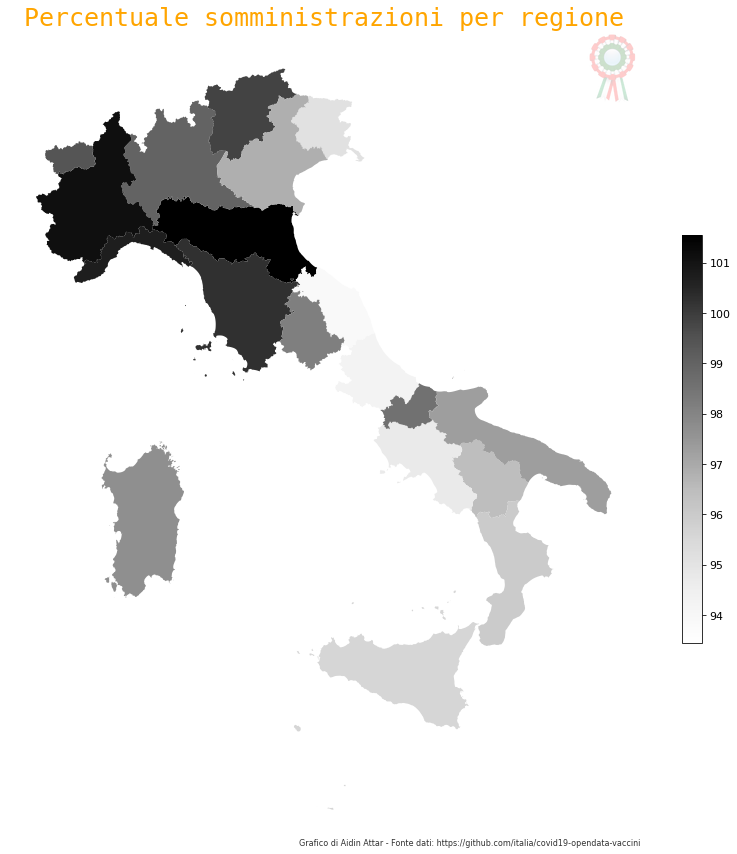

In [15]:
italy      = gpd.read_file('italy-with-regions/reg2011_g.shp')

vaccini1 = vaccini.set_index('area')
sum_ = vaccini1.loc[['PAT', 'PAB']].sum().to_frame().transpose()
sum_ = sum_.rename(index={0: 'TRE'})

vaccini1.drop(['PAT', 'PAB'],inplace=True)
vaccini1 = vaccini1.append(sum_)
vaccini1 = vaccini1.sort_index()

italy.sort_values(by = 'NOME_REG', inplace = True)
italy.reset_index(drop=True,       inplace = True)
italy.index = vaccini1.index

italy = italy.merge(vaccini1,left_index=True, right_index=True, how='right')
italy['percentuale_somministrazione'] = italy['dosi_somministrate'] / italy['dosi_consegnate'] * 100

fig, ax = plt.subplots(1, figsize=(15, 15))
col = 'percentuale_somministrazione'
ax.set_title('Percentuale somministrazioni per regione',
             fontdict={'fontsize':'25', 'fontweight':'3'},
             color='Orange',
             fontfamily='monospace')

normalize = mcolors.Normalize(vmin=italy['percentuale_somministrazione'].min(), vmax=italy['percentuale_somministrazione'].max())
scalarmappaple = cm.ScalarMappable(norm=normalize, cmap="Greys")
#scalarmappaple.set_array(italy.percentuale_somministrazione)
italy.plot(ax=ax,
           column=col,
           cmap='Greys')

plt.axis('off')
cbar = plt.colorbar(scalarmappaple, shrink=0.5)
cbar.ax.tick_params(labelsize=11)
watermark2()
ax.text(1, 0, 'Grafico di Aidin Attar - Fonte dati: https://github.com/italia/covid19-opendata-vaccini', transform=ax.transAxes,
        fontsize=8, color='black', alpha=0.8,
        ha='right', va='bottom', rotation='0')

In [16]:
oggi = [somministrazioni_l[key].iloc[-1] for key in somministrazioni_l.keys()]
cum = pd.DataFrame(oggi)
cum

,data,area,totale,m,f,d1,d2,dpi,db1,dbi,...,cumulativa_db1,cumulativa_dbi,cumulativa_db2,cumulativa_totale_per100,cumulativa_d1_per100,cumulativa_d2_per100,cumulativa_dpi_per100,cumulativa_db1_per100,cumulativa_dbi_per100,cumulativa_db2_per100
16/07/2022,2022-07-16 00:00:00,ABR,594.0,301.0,293.0,4.0,2.0,2.0,62.0,174.0,...,869294.0,7332.0,17352.0,228.139253,79.945122,77.200457,2.855107,66.257165,0.558841,1.322561
16/07/2022,2022-07-16 00:00:00,BAS,241.0,140.0,101.0,0.0,1.0,0.0,24.0,63.0,...,368785.0,3772.0,5907.0,227.357342,80.772436,76.833686,2.512840,65.518797,0.670138,1.049445
16/07/2022,2022-07-16 00:00:00,CAL,902.0,452.0,450.0,10.0,10.0,1.0,106.0,229.0,...,1132957.0,6623.0,15169.0,212.450077,77.695788,73.614792,1.830354,58.189882,0.340164,0.779096
16/07/2022,2022-07-16 00:00:00,CAM,2328.0,1237.0,1091.0,16.0,22.0,1.0,353.0,455.0,...,3495974.0,27485.0,57424.0,217.856205,78.261531,74.528387,3.348208,60.254636,0.473716,0.989728
16/07/2022,2022-07-16 00:00:00,EMR,2678.0,1323.0,1355.0,72.0,51.0,29.0,622.0,155.0,...,3055945.0,47453.0,167131.0,238.043709,82.105136,78.761337,3.830545,68.534313,1.064207,3.748172
16/07/2022,0,FVG,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,801852.0,3524.0,21519.0,225.396626,78.561564,74.662058,4.115802,65.996049,0.290041,1.771111
16/07/2022,2022-07-16 00:00:00,LAZ,10656.0,5280.0,5376.0,55.0,60.0,16.0,997.0,7938.0,...,3975805.0,55519.0,99437.0,231.825344,82.497381,76.147763,2.917214,67.627233,0.944361,1.691393
16/07/2022,2022-07-16 00:00:00,LIG,420.0,192.0,228.0,9.0,6.0,1.0,109.0,33.0,...,1005534.0,3324.0,37082.0,229.121857,81.271180,78.446744,1.967440,64.831335,0.214313,2.390845
16/07/2022,2022-07-16 00:00:00,LOM,12209.0,5784.0,6425.0,127.0,124.0,40.0,2307.0,1152.0,...,7240975.0,69965.0,212402.0,241.005060,83.734513,79.188181,3.297654,71.977883,0.695477,2.111352
16/07/2022,2022-07-16 00:00:00,MAR,1119.0,571.0,548.0,7.0,12.0,3.0,206.0,123.0,...,982936.0,6860.0,16857.0,222.450820,78.013574,75.075410,3.351803,64.454820,0.449836,1.105377


/tmp/ipykernel_64321/1047298699.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cum1 = cum1.append(sum_)
/home/aidin/anaconda3/lib/python3.8/site-packages/pandas/core/algorithms.py:798: FutureWarning: In a future version, the Index constructor will not infer numeric dtypes when passed object-dtype sequences (matching Series behavior)
  uniques = Index(uniques)


Text(1, 0, 'Grafico di Aidin Attar - Fonte dati: https://github.com/italia/covid19-opendata-vaccini')

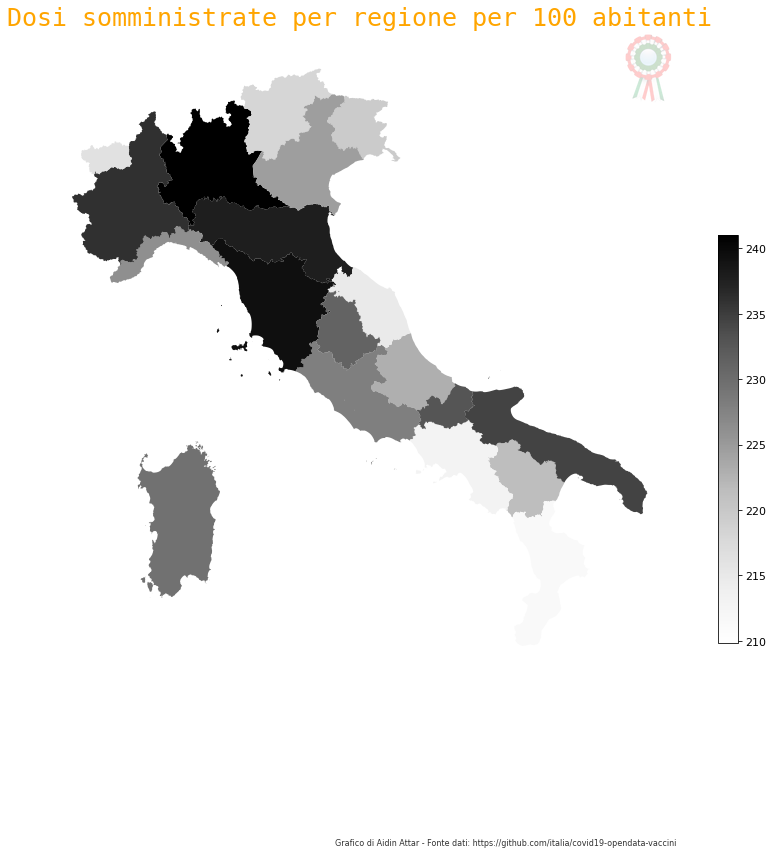

In [17]:
italy = gpd.read_file('italy-with-regions//reg2011_g.shp')

cum1 = cum.set_index('area')
sum_ = cum1.reindex(['PAT', 'PAB']).sum().to_frame().transpose()
sum_ = sum_.rename(index={0: 'TRE'})
cum1.drop(['PAT', 'PAB'],inplace=True)
cum1 = cum1.append(sum_)
cum1 = cum1.sort_index()
italy.sort_values(by = 'NOME_REG', inplace = True)
italy.reset_index(drop=True,       inplace = True)
italy.index = cum1.index

italy = italy.merge(cum1,left_index=True, right_index=True, how='right')
italy.at['TRE',                  'cumulativa_totale_per100'] = italy.at['TRE',                  'cumulativa_totale'] / (DictRegioni['Provincia Autonoma Bolzano / Bozen']+DictRegioni['Provincia Autonoma Trento'])*100
italy.at['TRE',              'cumulativa_d1_per100'] = italy.at['TRE',              'cumulativa_d1'] / (DictRegioni['Provincia Autonoma Bolzano / Bozen']+DictRegioni['Provincia Autonoma Trento'])*100
italy.at['TRE',            'cumulativa_d2_per100'] = italy.at['TRE',            'cumulativa_d2'] / (DictRegioni['Provincia Autonoma Bolzano / Bozen']+DictRegioni['Provincia Autonoma Trento'])*100
italy.at['TRE',     'cumulativa_dpi_per100'] = italy.at['TRE',     'cumulativa_dpi'] / (DictRegioni['Provincia Autonoma Bolzano / Bozen']+DictRegioni['Provincia Autonoma Trento'])*100
italy.at['TRE','cumulativa_db1_per100'] = italy.at['TRE','cumulativa_db1'] / (DictRegioni['Provincia Autonoma Bolzano / Bozen']+DictRegioni['Provincia Autonoma Trento'])*100

fig, ax = plt.subplots(1, figsize=(15, 15))
col = 'cumulativa_totale_per100'
ax.set_title('Dosi somministrate per regione per 100 abitanti', 
             fontdict={'fontsize':'25', 'fontweight':'3'}, 
             color='Orange', 
             fontfamily='monospace')


normalize = mcolors.Normalize(vmin=italy['cumulativa_totale_per100'].min(), vmax=italy['cumulativa_totale_per100'].max())
scalarmappaple = cm.ScalarMappable(norm=normalize, cmap="Greys")
#scalarmappaple.set_array(italy['cumulativa_totale_per100'])

italy.plot(ax=ax,
           column=col,
           cmap="Greys")
plt.axis('off')
cbar = plt.colorbar(scalarmappaple, shrink=0.5)
cbar.ax.tick_params(labelsize=11)
watermark2()
ax.text(1, 0, 'Grafico di Aidin Attar - Fonte dati: https://github.com/italia/covid19-opendata-vaccini', transform=ax.transAxes,
        fontsize=8, color='black', alpha=0.8,
        ha='right', va='bottom', rotation='0')

/home/aidin/anaconda3/lib/python3.8/site-packages/pandas/core/algorithms.py:798: FutureWarning: In a future version, the Index constructor will not infer numeric dtypes when passed object-dtype sequences (matching Series behavior)
  uniques = Index(uniques)
/home/aidin/anaconda3/lib/python3.8/site-packages/pandas/core/algorithms.py:798: FutureWarning: In a future version, the Index constructor will not infer numeric dtypes when passed object-dtype sequences (matching Series behavior)
  uniques = Index(uniques)
/home/aidin/anaconda3/lib/python3.8/site-packages/pandas/core/algorithms.py:798: FutureWarning: In a future version, the Index constructor will not infer numeric dtypes when passed object-dtype sequences (matching Series behavior)
  uniques = Index(uniques)
/home/aidin/anaconda3/lib/python3.8/site-packages/pandas/core/algorithms.py:798: FutureWarning: In a future version, the Index constructor will not infer numeric dtypes when passed object-dtype sequences (matching Series behav

Text(0.9, 0.05, 'Grafico di Aidin Attar - Fonte dati: https://github.com/italia/covid19-opendata-vaccini')

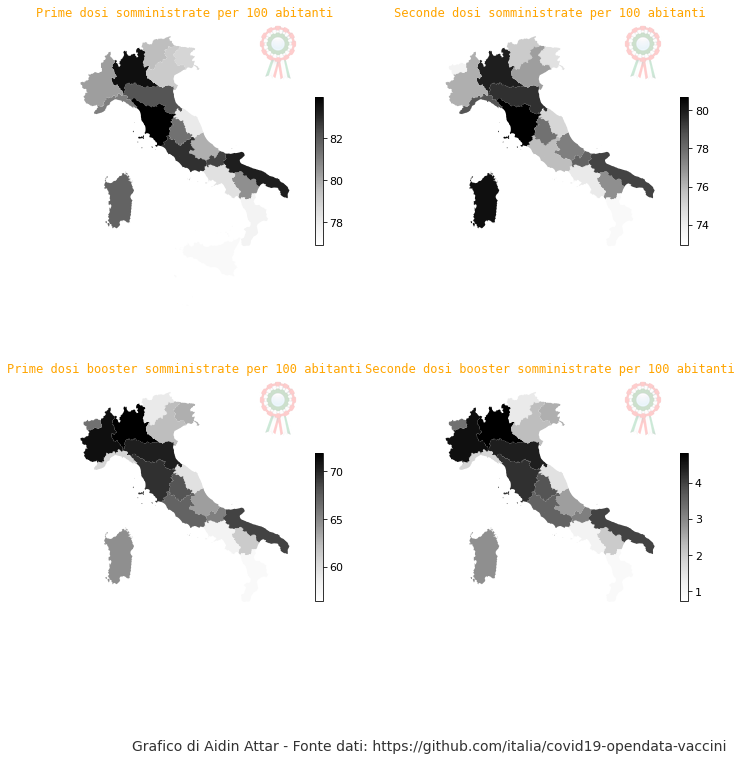

In [18]:
fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(12, 12))
col1 = 'cumulativa_d1_per100'
ax[0,0].set_title('Prime dosi somministrate per 100 abitanti',
             fontdict={'fontsize':'12', 'fontweight':'3'},
             color='Orange',
             fontfamily='monospace')


normalize1 = mcolors.Normalize(vmin=italy[col1].min(), vmax=italy[col1].max())
scalarmappaple1 = cm.ScalarMappable(norm=normalize1, cmap="Greys")
#scalarmappaple.set_array(italy['cumulativa_totale_per100'])

italy.plot(ax=ax[0,0],
           column=col1,
           cmap="Greys")
plt.axis('off')
cbar = plt.colorbar(scalarmappaple1, ax=ax[0,0],shrink=0.5)
cbar.ax.tick_params(labelsize=11)

col2 = 'cumulativa_d2_per100'
ax[0,1].set_title('Seconde dosi somministrate per 100 abitanti',
             fontdict={'fontsize':'12', 'fontweight':'3'},
             color='Orange',
             fontfamily='monospace')


normalize2 = mcolors.Normalize(vmin=italy[col2].min(), vmax=italy[col2].max())
scalarmappaple2 = cm.ScalarMappable(norm=normalize2, cmap="Greys")
#scalarmappaple.set_array(italy['cumulativa_totale_per100'])

italy.plot(ax=ax[0,1],
           column=col2,
           cmap="Greys")
cbar = plt.colorbar(scalarmappaple2, ax=ax[0,1],shrink=0.5)
cbar.ax.tick_params(labelsize=11)

col3 = 'cumulativa_db1_per100'
ax[1,0].set_title('Prime dosi booster somministrate per 100 abitanti',
             fontdict={'fontsize':'12', 'fontweight':'3'},
             color='Orange',
             fontfamily='monospace')


normalize3 = mcolors.Normalize(vmin=italy[col3].min(), vmax=italy[col3].max())
scalarmappaple3 = cm.ScalarMappable(norm=normalize3, cmap="Greys")
#scalarmappaple.set_array(italy['cumulativa_totale_per100'])

italy.plot(ax=ax[1,0],
           column=col3,
           cmap="Greys")
cbar = plt.colorbar(scalarmappaple3, ax=ax[1,0],shrink=0.5)
cbar.ax.tick_params(labelsize=11)

col4 = 'cumulativa_db2_per100'
ax[1,1].set_title('Seconde dosi booster somministrate per 100 abitanti',
             fontdict={'fontsize':'12', 'fontweight':'3'},
             color='Orange',
             fontfamily='monospace')


normalize4 = mcolors.Normalize(vmin=italy[col4].min(), vmax=italy[col4].max())
scalarmappaple4 = cm.ScalarMappable(norm=normalize4, cmap="Greys")

italy.plot(ax=ax[1,1],
           column=col3,
           cmap="Greys")
cbar = plt.colorbar(scalarmappaple4, ax=ax[1,1],shrink=0.5)
cbar.ax.tick_params(labelsize=11)
ax[0,0].axis('off')
ax[0,1].axis('off')
ax[1,0].axis('off')
ax[1,1].axis('off')

watermark2(ax=ax[0,0])
watermark2(ax=ax[0,1])
watermark2(ax=ax[1,0])
watermark2(ax=ax[1,1])
plt.text(0.9, 0.05, 'Grafico di Aidin Attar - Fonte dati: https://github.com/italia/covid19-opendata-vaccini',
         transform=plt.gcf().transFigure,
         fontsize=14, color='black', alpha=0.8,
         ha='right', va='top', rotation='0')

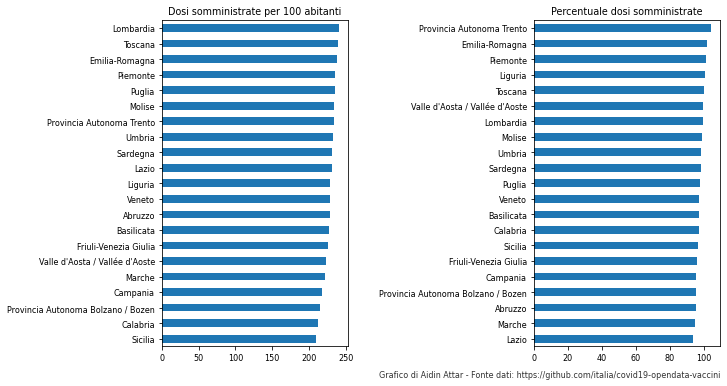

In [19]:
cum = cum.sort_values(by = 'cumulativa_totale_per100')
vaccinisort = vaccini.sort_values(by = 'percentuale_somministrazione')
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10,6), gridspec_kw={ 'wspace': 1})

plt.rcParams['font.size'] = '8'
cum.plot(        ax=axes[0],x = 'reg', y='cumulativa_totale_per100', kind = 'barh', legend = False, xlabel = '', title = "Dosi somministrate per 100 abitanti")
vaccinisort.plot(ax=axes[1],x = 'reg', y='percentuale_somministrazione', kind = 'barh', legend = False, xlabel = '', title = "Percentuale dosi somministrate")
plt.text(0.9, 0.05, 'Grafico di Aidin Attar - Fonte dati: https://github.com/italia/covid19-opendata-vaccini', transform=plt.gcf().transFigure,
        fontsize=8, color='black', alpha=0.8,
        ha='right', va='bottom', rotation='0')
plt.show()

In [20]:
# Need to clone the repository https://github.com/pcm-dpc/COVID-19.git #

province        = pd.read_csv('../../COVID-19/dati-province/dpc-covid19-ita-province.csv')
regioni         = pd.read_csv('../../COVID-19/dati-regioni/dpc-covid19-ita-regioni.csv')
italia_contagio = pd.read_csv('../../COVID-19/dati-andamento-nazionale/dpc-covid19-ita-andamento-nazionale.csv')
Popolazione     = pd.read_csv('../../COVID-19/grafici/Popolazione_Regioni.csv', names=('provincia','sigla', 'popolazione'))
italia_contagio

,data,stato,ricoverati_con_sintomi,terapia_intensiva,totale_ospedalizzati,isolamento_domiciliare,totale_positivi,variazione_totale_positivi,nuovi_positivi,dimessi_guariti,...,tamponi,casi_testati,note,ingressi_terapia_intensiva,note_test,note_casi,totale_positivi_test_molecolare,totale_positivi_test_antigenico_rapido,tamponi_test_molecolare,tamponi_test_antigenico_rapido
0,2020-02-24T18:00:00,ITA,101,26,127,94,221,0,221,1,...,4324,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2020-02-25T18:00:00,ITA,114,35,150,162,311,90,93,1,...,8623,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2020-02-26T18:00:00,ITA,128,36,164,221,385,74,78,3,...,9587,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2020-02-27T18:00:00,ITA,248,56,304,284,588,203,250,45,...,12014,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2020-02-28T18:00:00,ITA,345,64,409,412,821,233,238,46,...,15695,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
870,2022-07-13T17:00:00,ITA,9826,388,10214,1381676,1391890,41409,110168,18217525,...,231368532,60741344.0,NaN,59.0,NaN,NaN,9010256.0,10768655.0,94299833.0,137068699.0
871,2022-07-14T17:00:00,ITA,10115,391,10506,1412919,1423425,31535,107122,18294517,...,231776628,60836652.0,NaN,48.0,NaN,NaN,9022123.0,10865420.0,94358940.0,137417688.0
872,2022-07-15T17:00:00,ITA,10363,395,10758,1416008,1426766,3341,96384,18388978,...,232167636,60922939.0,NaN,52.0,NaN,NaN,9032360.0,10953119.0,94411447.0,137756189.0
873,2022-07-16T17:00:00,ITA,10434,405,10839,1437711,1448550,21784,89830,18458467,...,232565974,61008831.0,NaN,57.0,NaN,NaN,9043627.0,11033236.0,94464501.0,138101473.0


In [21]:
idx = pd.date_range('2020-02-24', yesterday)
italia_contagio['data']                             = pd.to_datetime(italia_contagio['data'],format='%Y-%m-%dT%H:%M:%S',yearfirst=True, dayfirst=True)
italia_contagio['new_date'] = italia_contagio['data'].dt.date
#italia_contagio.sort_values(by='new_date',inplace=True)
italia_contagio                                     = italia_contagio.set_index('new_date')
italia_contagio.sort_index(inplace=True)
italia_contagio                                     = italia_contagio.reindex(idx)
italia_contagio.index                               = italia_contagio.index.strftime('%d/%m/%Y')
italia_contagio.fillna(method='ffill',inplace=True)
italia_contagio['casi_giornalieri']                 = italia_contagio['totale_casi'] - italia_contagio['totale_casi'].shift(1)
italia_contagio['media_casi_giorn']                 = italia_contagio['casi_giornalieri'].rolling(window=7, min_periods=1).mean()
italia_contagio['morti_giornalieri']                = italia_contagio['deceduti'] - italia_contagio['deceduti'].shift(1)
italia_contagio['media_morti_giorn']                = italia_contagio['morti_giornalieri'].rolling(window=7, min_periods=1).mean()
italia_contagio['media_ingressi_terapia_intensiva'] = italia_contagio['ingressi_terapia_intensiva'].rolling(window=7, min_periods=1).mean()

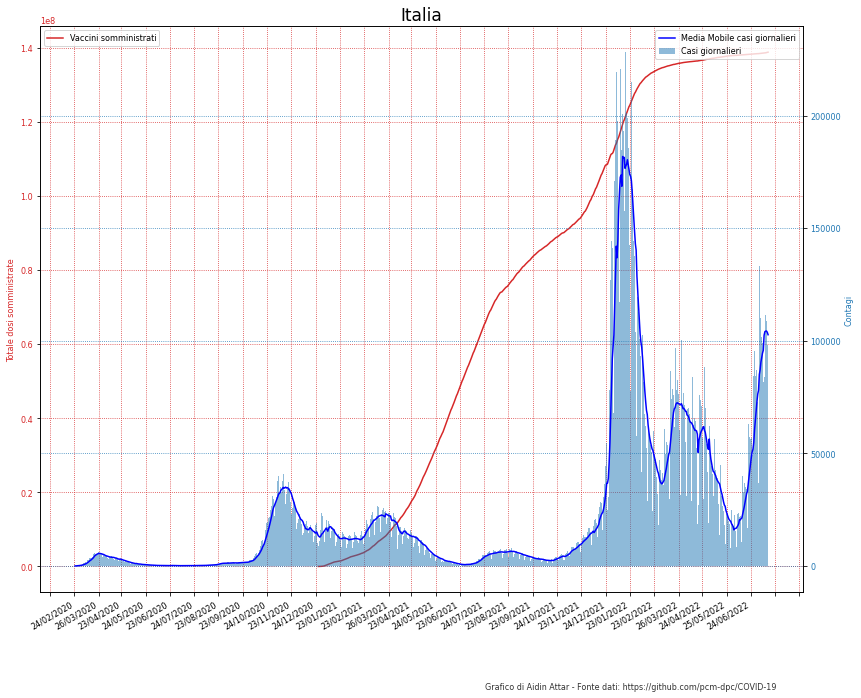

In [22]:
fig, ax1 = plt.subplots(figsize=(12, 10))

color = 'tab:red'
ax1.set_xlabel('')
ax1.set_ylabel('Totale dosi somministrate', color=color)
ax1.plot(italia.index, italia.cumulativa_totale, color=color, label='Vaccini somministrati',zorder=3)

ax1.legend(loc='upper left')
fig.autofmt_xdate()

ax1.tick_params(axis='y', labelcolor=color)
ax1.grid(linestyle='dotted',color=color)
ax1.xaxis.set_major_locator(mdates.MonthLocator(interval=1))

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
color = 'tab:blue'
ax2.set_ylabel('Contagi', color=color)

ax2.bar(italia_contagio.index, italia_contagio.casi_giornalieri, color=color, width=1, alpha=0.5,label='Casi giornalieri', zorder=1)
ax2.plot(italia_contagio.index, italia_contagio['media_casi_giorn'],
        color = 'blue', label = 'Media Mobile casi giornalieri',zorder=2)
ax1.set_title('Italia', fontsize=17)
plt.rcParams['font.size'] = '8'

ax2.set_xlabel('')
ax2.tick_params(axis='y', labelcolor=color)
ax2.legend(loc='upper right')

ax2.grid(linestyle='dotted', color=color)

plt.text(0.9, 0.05, 'Grafico di Aidin Attar - Fonte dati: https://github.com/pcm-dpc/COVID-19',
         transform=plt.gcf().transFigure,
         fontsize=8, color='black', alpha=0.8,
         ha='right', va='top', rotation='0')

fig.tight_layout()  # otherwise the right y-label is slightly clipped
plt.show()


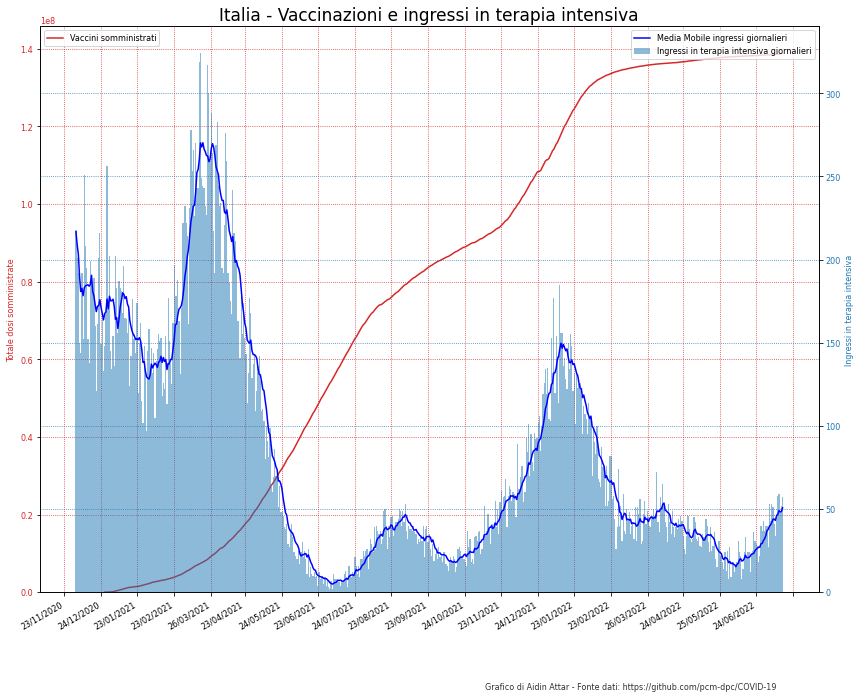

In [23]:
fig, ax1 = plt.subplots(figsize=(12, 10))

color = 'tab:red'
ax1.set_xlabel('')
ax1.set_ylabel('Totale dosi somministrate', color=color)
ax1.plot(italia.index, italia.cumulativa_totale, color=color, label='Vaccini somministrati',zorder=3)
ax1.set_ylim(bottom=0)
ax1.legend(loc='upper left')
fig.autofmt_xdate()

ax1.tick_params(axis='y', labelcolor=color)
ax1.grid(linestyle='dotted',color=color)
ax1.xaxis.set_major_locator(mdates.MonthLocator(interval=1))

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
color = 'tab:blue'
ax2.set_ylabel('Ingressi in terapia intensiva', color=color)

ax2.bar(italia_contagio.index, italia_contagio.ingressi_terapia_intensiva, color=color, width=1, alpha=0.5,label='Ingressi in terapia intensiva giornalieri', zorder=1)
ax2.plot(italia_contagio.index, italia_contagio['media_ingressi_terapia_intensiva'],
        color = 'blue', label = 'Media Mobile ingressi giornalieri',zorder=2)
ax1.set_title('Italia - Vaccinazioni e ingressi in terapia intensiva', fontsize=17)
plt.rcParams['font.size'] = '8'
ax2.set_ylim(bottom=0)
ax2.set_xlabel('')
ax2.tick_params(axis='y', labelcolor=color)
ax2.legend(loc='upper right')

ax2.grid(linestyle='dotted', color=color)

plt.text(0.9, 0.05, 'Grafico di Aidin Attar - Fonte dati: https://github.com/pcm-dpc/COVID-19',
         transform=plt.gcf().transFigure,
         fontsize=8, color='black', alpha=0.8,
         ha='right', va='top', rotation='0')

fig.tight_layout()  # otherwise the right y-label is slightly clipped
plt.show()


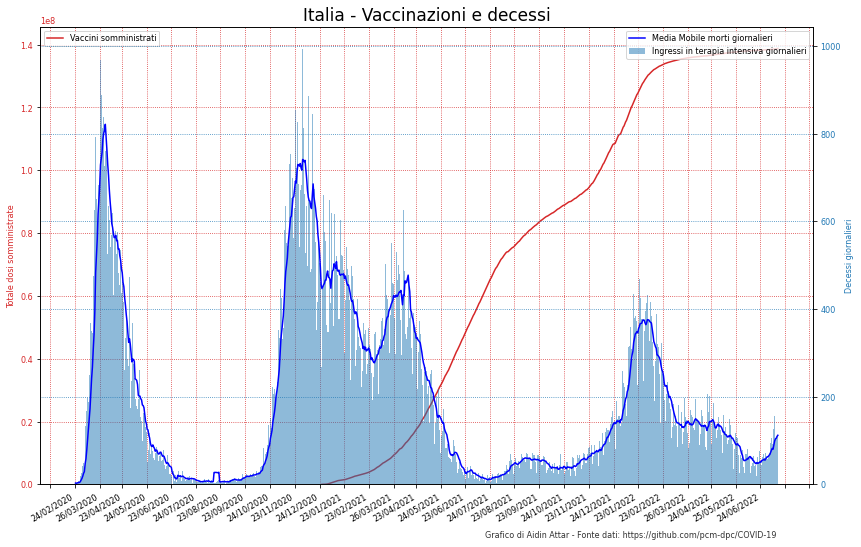

In [24]:
fig, ax1 = plt.subplots(figsize=(12, 8))

color = 'tab:red'
ax1.set_xlabel('')
ax1.set_ylabel('Totale dosi somministrate', color=color)
ax1.plot(italia.index, italia.cumulativa_totale, color=color, label='Vaccini somministrati',zorder=3)
ax1.set_ylim(bottom=0)
ax1.legend(loc='upper left')
fig.autofmt_xdate()

ax1.tick_params(axis='y', labelcolor=color)
ax1.grid(linestyle='dotted',color=color)
ax1.xaxis.set_major_locator(mdates.MonthLocator(interval=1))

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
color = 'tab:blue'
ax2.set_ylabel('Decessi giornalieri', color=color)

ax2.bar(italia_contagio.index, italia_contagio.morti_giornalieri, color=color, width=1, alpha=0.5,label='Ingressi in terapia intensiva giornalieri', zorder=1)
ax2.plot(italia_contagio.index, italia_contagio['media_morti_giorn'],
        color = 'blue', label = 'Media Mobile morti giornalieri',zorder=2)
ax1.set_title('Italia - Vaccinazioni e decessi', fontsize=17)
plt.rcParams['font.size'] = '8'
ax2.set_ylim(bottom=0)
ax2.set_xlabel('')
ax2.tick_params(axis='y', labelcolor=color)
ax2.legend(loc='upper right')

ax2.grid(linestyle='dotted', color=color)

plt.text(0.9, 0.075, 'Grafico di Aidin Attar - Fonte dati: https://github.com/pcm-dpc/COVID-19',
         transform=plt.gcf().transFigure,
         fontsize=8, color='black', alpha=0.8,
         ha='right', va='top', rotation='0')

fig.tight_layout()  # otherwise the right y-label is slightly clipped
plt.show()


In [25]:
idx = pd.date_range('27/12/2020', yesterday)
NomiFornitori=somm1.forn.unique()
FasceAnagrafiche=somm1.eta.unique()
somministrazioni_fornitori_età={elem1:{elem2:{elem3:pd.DataFrame for elem3 in FasceAnagrafiche} for elem2 in NomiFornitori} for elem1 in NomiRegioni}

for key1 in somministrazioni_fornitori_età.keys():
    for key2 in somministrazioni_fornitori_età[key1].keys():
        for key3 in somministrazioni_fornitori_età[key1][key2].keys():
            somministrazioni_fornitori_età[key1][key2][key3]                          = somm1[:][somm1.reg==key1][somm1.forn==key2][somm1.eta==key3]
            somministrazioni_fornitori_età[key1][key2][key3]['totale']                = somministrazioni_fornitori_età[key1][key2][key3]['m'] + somministrazioni_fornitori_età[key1][key2][key3]['f']             
            somministrazioni_fornitori_età[key1][key2][key3]['data'] = pd.to_datetime(somministrazioni_fornitori_età[key1][key2][key3]['data'], format='%Y-%m-%d', yearfirst=True)
            somministrazioni_fornitori_età[key1][key2][key3]                          = somministrazioni_fornitori_età[key1][key2][key3].set_index('data')
            somministrazioni_fornitori_età[key1][key2][key3].index                    = pd.DatetimeIndex(somministrazioni_fornitori_età[key1][key2][key3].index)
            somministrazioni_fornitori_età[key1][key2][key3].sort_index(inplace=True)
            somministrazioni_fornitori_età[key1][key2][key3]                          = somministrazioni_fornitori_età[key1][key2][key3].reindex(idx)
            somministrazioni_fornitori_età[key1][key2][key3].index                    = somministrazioni_fornitori_età[key1][key2][key3].index.strftime('%d/%m/%Y')
            somministrazioni_fornitori_età[key1][key2][key3].area.fillna(method='bfill',inplace=True)
            somministrazioni_fornitori_età[key1][key2][key3].N1.fillna(method='bfill',inplace=True)
            somministrazioni_fornitori_età[key1][key2][key3].N2.fillna(method='bfill',inplace=True)
            somministrazioni_fornitori_età[key1][key2][key3].ISTAT.fillna(method='bfill',inplace=True)
            somministrazioni_fornitori_età[key1][key2][key3].reg.fillna(key1,inplace=True)
            somministrazioni_fornitori_età[key1][key2][key3].eta.fillna(key3,inplace=True)
            somministrazioni_fornitori_età[key1][key2][key3].forn.fillna(key2,inplace=True)
            somministrazioni_fornitori_età[key1][key2][key3].fillna(0,inplace=True)

italia_fornitori_età = copy.deepcopy(somministrazioni_fornitori_età['Emilia-Romagna'])

for key1 in italia_fornitori_età.keys():
    for key2 in italia_fornitori_età[key1].keys():
        italia_fornitori_età[key1][key2]['totale'] = sum(somministrazioni_fornitori_età[key][key1][key2]['totale'].fillna(0) for key in somministrazioni_fornitori_età.keys())
        italia_fornitori_età[key1][key2][     'm'] = sum(somministrazioni_fornitori_età[key][key1][key2][     'm'].fillna(0) for key in somministrazioni_fornitori_età.keys())
        italia_fornitori_età[key1][key2][     'f'] = sum(somministrazioni_fornitori_età[key][key1][key2][     'f'].fillna(0) for key in somministrazioni_fornitori_età.keys())
        italia_fornitori_età[key1][key2][    'd1'] = sum(somministrazioni_fornitori_età[key][key1][key2][    'd1'].fillna(0) for key in somministrazioni_fornitori_età.keys())
        italia_fornitori_età[key1][key2][    'd2'] = sum(somministrazioni_fornitori_età[key][key1][key2][    'd2'].fillna(0) for key in somministrazioni_fornitori_età.keys())
        italia_fornitori_età[key1][key2][   'dpi'] = sum(somministrazioni_fornitori_età[key][key1][key2][   'dpi'].fillna(0) for key in somministrazioni_fornitori_età.keys())
        italia_fornitori_età[key1][key2][   'db1'] = sum(somministrazioni_fornitori_età[key][key1][key2][   'db1'].fillna(0) for key in somministrazioni_fornitori_età.keys())
        italia_fornitori_età[key1][key2][   'dbi'] = sum(somministrazioni_fornitori_età[key][key1][key2][   'dbi'].fillna(0) for key in somministrazioni_fornitori_età.keys())
        italia_fornitori_età[key1][key2][   'db2'] = sum(somministrazioni_fornitori_età[key][key1][key2][   'db2'].fillna(0) for key in somministrazioni_fornitori_età.keys())

for key1 in italia_fornitori_età.keys():
    for key2 in italia_fornitori_età[key1].keys():
        italia_fornitori_età[key1][key2].drop(columns=['N1','N2','ISTAT'], axis=1, inplace = True)
        italia_fornitori_età[key1][key2]['area'] = 'ITA'
        italia_fornitori_età[key1][key2]['reg'] = 'italia'


italia_fornitori = copy.deepcopy(italia_fornitori_età['Pfizer/BioNTech'])

for key1 in italia_fornitori.keys():
    italia_fornitori[key1][ 'totale'] = sum(italia_fornitori_età[key][key1][ 'totale'].fillna(0) for key in italia_fornitori_età.keys())
    italia_fornitori[key1][      'm'] = sum(italia_fornitori_età[key][key1][      'm'].fillna(0) for key in italia_fornitori_età.keys())
    italia_fornitori[key1][      'f'] = sum(italia_fornitori_età[key][key1][      'f'].fillna(0) for key in italia_fornitori_età.keys())
    italia_fornitori[key1][     'd1'] = sum(italia_fornitori_età[key][key1][     'd1'].fillna(0) for key in italia_fornitori_età.keys())
    italia_fornitori[key1][     'd2'] = sum(italia_fornitori_età[key][key1][     'd2'].fillna(0) for key in italia_fornitori_età.keys())
    italia_fornitori[key1][    'dpi'] = sum(italia_fornitori_età[key][key1][    'dpi'].fillna(0) for key in italia_fornitori_età.keys())
    italia_fornitori[key1][    'db1'] = sum(italia_fornitori_età[key][key1][    'db1'].fillna(0) for key in italia_fornitori_età.keys())
    italia_fornitori[key1][    'dbi'] = sum(italia_fornitori_età[key][key1][    'dbi'].fillna(0) for key in italia_fornitori_età.keys())
    italia_fornitori[key1][    'db2'] = sum(italia_fornitori_età[key][key1][    'db2'].fillna(0) for key in italia_fornitori_età.keys())

    italia_fornitori[key1].drop(columns=['eta'], axis=1, inplace=True)

    italia_fornitori[key1]['media_totale'] = italia_fornitori[key1]['totale'].rolling(window=7, min_periods=1).mean()
    italia_fornitori[key1][     'media_m'] = italia_fornitori[key1][     'm'].rolling(window=7, min_periods=1).mean()
    italia_fornitori[key1][     'media_f'] = italia_fornitori[key1][     'f'].rolling(window=7, min_periods=1).mean()
    italia_fornitori[key1][    'media_d1'] = italia_fornitori[key1][    'd1'].rolling(window=7, min_periods=1).mean()
    italia_fornitori[key1][    'media_d2'] = italia_fornitori[key1][    'd2'].rolling(window=7, min_periods=1).mean()
    italia_fornitori[key1][   'media_dpi'] = italia_fornitori[key1][   'dpi'].rolling(window=7, min_periods=1).mean()
    italia_fornitori[key1][   'media_db1'] = italia_fornitori[key1][   'db1'].rolling(window=7, min_periods=1).mean()
    italia_fornitori[key1][   'media_dbi'] = italia_fornitori[key1][   'dbi'].rolling(window=7, min_periods=1).mean()
    italia_fornitori[key1][   'media_db2'] = italia_fornitori[key1][   'db2'].rolling(window=7, min_periods=1).mean()

    italia_fornitori[key1]['cumulativa_totale'] = italia_fornitori[key1]['totale'].cumsum()
    italia_fornitori[key1][     'cumulativa_m'] = italia_fornitori[key1][     'm'].cumsum()
    italia_fornitori[key1][     'cumulativa_f'] = italia_fornitori[key1][     'f'].cumsum()
    italia_fornitori[key1][    'cumulativa_d1'] = italia_fornitori[key1][    'd1'].cumsum()
    italia_fornitori[key1][    'cumulativa_d2'] = italia_fornitori[key1][    'd2'].cumsum()
    italia_fornitori[key1][   'cumulativa_dpi'] = italia_fornitori[key1][   'dpi'].cumsum()
    italia_fornitori[key1][   'cumulativa_db1'] = italia_fornitori[key1][   'db1'].cumsum()
    italia_fornitori[key1][   'cumulativa_dbi'] = italia_fornitori[key1][   'dbi'].cumsum()
    italia_fornitori[key1][   'cumulativa_db2'] = italia_fornitori[key1][   'db2'].cumsum()

/home/aidin/anaconda3/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3397: UserWarning: Parsing '27/12/2020' in DD/MM/YYYY format. Provide format or specify infer_datetime_format=True for consistent parsing.
  exec(code_obj, self.user_global_ns, self.user_ns)
/tmp/ipykernel_64321/2583315183.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  somministrazioni_fornitori_età[key1][key2][key3]                          = somm1[:][somm1.reg==key1][somm1.forn==key2][somm1.eta==key3]
/tmp/ipykernel_64321/2583315183.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  somministrazioni_fornitori_età[key1][key2][key3]                          = somm1[:][somm1.reg==key1][somm1.forn==key2][somm1.eta==key3]
/tmp/ipykernel_64321/2583315183.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documenta

In [26]:
idx = pd.date_range('27/12/2020', yesterday)
NomiFornitori=somm1.forn.unique()
FasceAnagrafiche=somm1.eta.unique()
somministrazioni_età_fornitori={elem1:{elem2:{elem3:pd.DataFrame for elem3 in NomiFornitori} for elem2 in FasceAnagrafiche} for elem1 in NomiRegioni}

for key1 in somministrazioni_età_fornitori.keys():
    for key2 in somministrazioni_età_fornitori[key1].keys():
        for key3 in somministrazioni_età_fornitori[key1][key2].keys():
            somministrazioni_età_fornitori[key1][key2][key3]                          = somm1[:][somm1.reg==key1][somm1.eta==key2][somm1.forn==key3]
            somministrazioni_età_fornitori[key1][key2][key3]['totale']                = somministrazioni_età_fornitori[key1][key2][key3]['m'] + somministrazioni_età_fornitori[key1][key2][key3]['f']             
            somministrazioni_età_fornitori[key1][key2][key3]['data'] = pd.to_datetime(somministrazioni_età_fornitori[key1][key2][key3]['data'], format='%Y-%m-%d', yearfirst=True)
            somministrazioni_età_fornitori[key1][key2][key3]                          = somministrazioni_età_fornitori[key1][key2][key3].set_index('data')
            somministrazioni_età_fornitori[key1][key2][key3].index                    = pd.DatetimeIndex(somministrazioni_età_fornitori[key1][key2][key3].index)
            somministrazioni_età_fornitori[key1][key2][key3].sort_index(inplace=True)
            somministrazioni_età_fornitori[key1][key2][key3]                          = somministrazioni_età_fornitori[key1][key2][key3].reindex(idx)
            somministrazioni_età_fornitori[key1][key2][key3].index                    = somministrazioni_età_fornitori[key1][key2][key3].index.strftime('%d/%m/%Y')
            somministrazioni_età_fornitori[key1][key2][key3].area.fillna(method='bfill',inplace=True)
            somministrazioni_età_fornitori[key1][key2][key3].N1.fillna(method='bfill',inplace=True)
            somministrazioni_età_fornitori[key1][key2][key3].N2.fillna(method='bfill',inplace=True)
            somministrazioni_età_fornitori[key1][key2][key3].ISTAT.fillna(method='bfill',inplace=True)
            somministrazioni_età_fornitori[key1][key2][key3].reg.fillna(key1,inplace=True)
            somministrazioni_età_fornitori[key1][key2][key3].eta.fillna(key3,inplace=True)
            somministrazioni_età_fornitori[key1][key2][key3].forn.fillna(key2,inplace=True)
            somministrazioni_età_fornitori[key1][key2][key3].fillna(0,inplace=True)

italia_età_fornitori = copy.deepcopy(somministrazioni_età_fornitori['Emilia-Romagna'])

for key1 in italia_età_fornitori.keys():
    for key2 in italia_età_fornitori[key1].keys():
        italia_età_fornitori[key1][key2]['totale'] = sum(somministrazioni_età_fornitori[key][key1][key2]['totale'].fillna(0) for key in somministrazioni_età_fornitori.keys())
        italia_età_fornitori[key1][key2][     'm'] = sum(somministrazioni_età_fornitori[key][key1][key2][     'm'].fillna(0) for key in somministrazioni_età_fornitori.keys())
        italia_età_fornitori[key1][key2][     'f'] = sum(somministrazioni_età_fornitori[key][key1][key2][     'f'].fillna(0) for key in somministrazioni_età_fornitori.keys())
        italia_età_fornitori[key1][key2][    'd1'] = sum(somministrazioni_età_fornitori[key][key1][key2][    'd1'].fillna(0) for key in somministrazioni_età_fornitori.keys())
        italia_età_fornitori[key1][key2][    'd2'] = sum(somministrazioni_età_fornitori[key][key1][key2][    'd2'].fillna(0) for key in somministrazioni_età_fornitori.keys())
        italia_età_fornitori[key1][key2][   'dpi'] = sum(somministrazioni_età_fornitori[key][key1][key2][   'dpi'].fillna(0) for key in somministrazioni_età_fornitori.keys())
        italia_età_fornitori[key1][key2][   'db1'] = sum(somministrazioni_età_fornitori[key][key1][key2][   'db1'].fillna(0) for key in somministrazioni_età_fornitori.keys())
        italia_età_fornitori[key1][key2][   'dbi'] = sum(somministrazioni_età_fornitori[key][key1][key2][   'dbi'].fillna(0) for key in somministrazioni_età_fornitori.keys())
        italia_età_fornitori[key1][key2][   'db2'] = sum(somministrazioni_età_fornitori[key][key1][key2][   'db2'].fillna(0) for key in somministrazioni_età_fornitori.keys())

for key1 in italia_età_fornitori.keys():
    for key2 in italia_età_fornitori[key1].keys():
        italia_età_fornitori[key1][key2].drop(columns=['N1','N2','ISTAT'], axis=1, inplace = True)
        italia_età_fornitori[key1][key2]['area'] = 'ITA'
        italia_età_fornitori[key1][key2]['reg'] = 'italia'

italia_età = copy.deepcopy(italia_età_fornitori['20-29'])

for key1 in italia_età.keys():
    italia_età[key1][ 'totale'] = sum(italia_età_fornitori[key][key1][ 'totale'].fillna(0) for key in italia_età_fornitori.keys())
    italia_età[key1][      'm'] = sum(italia_età_fornitori[key][key1][      'm'].fillna(0) for key in italia_età_fornitori.keys())
    italia_età[key1][      'f'] = sum(italia_età_fornitori[key][key1][      'f'].fillna(0) for key in italia_età_fornitori.keys())
    italia_età[key1][     'd1'] = sum(italia_età_fornitori[key][key1][     'd1'].fillna(0) for key in italia_età_fornitori.keys())
    italia_età[key1][     'd2'] = sum(italia_età_fornitori[key][key1][     'd2'].fillna(0) for key in italia_età_fornitori.keys())
    italia_età[key1][    'dpi'] = sum(italia_età_fornitori[key][key1][    'dpi'].fillna(0) for key in italia_età_fornitori.keys())
    italia_età[key1][    'db1'] = sum(italia_età_fornitori[key][key1][    'db1'].fillna(0) for key in italia_età_fornitori.keys())
    italia_età[key1][    'dbi'] = sum(italia_età_fornitori[key][key1][    'dbi'].fillna(0) for key in italia_età_fornitori.keys())
    italia_età[key1][    'db2'] = sum(italia_età_fornitori[key][key1][    'db2'].fillna(0) for key in italia_età_fornitori.keys())

    italia_età[key1].drop(columns=['eta'], axis=1, inplace=True)

    italia_età[key1]['media_totale'] = italia_età[key1]['totale'].rolling(window=7, min_periods=1).mean()
    italia_età[key1][     'media_m'] = italia_età[key1][     'm'].rolling(window=7, min_periods=1).mean()
    italia_età[key1][     'media_f'] = italia_età[key1][     'f'].rolling(window=7, min_periods=1).mean()
    italia_età[key1][    'media_d1'] = italia_età[key1][    'd1'].rolling(window=7, min_periods=1).mean()
    italia_età[key1][    'media_d2'] = italia_età[key1][    'd2'].rolling(window=7, min_periods=1).mean()
    italia_età[key1][   'media_dpi'] = italia_età[key1][   'dpi'].rolling(window=7, min_periods=1).mean()
    italia_età[key1][   'media_db1'] = italia_età[key1][   'db1'].rolling(window=7, min_periods=1).mean()
    italia_età[key1][   'media_dbi'] = italia_età[key1][   'dbi'].rolling(window=7, min_periods=1).mean()
    italia_età[key1][   'media_db2'] = italia_età[key1][   'db2'].rolling(window=7, min_periods=1).mean()

    italia_età[key1]['cumulativa_totale'] = italia_età[key1]['totale'].cumsum()
    italia_età[key1][     'cumulativa_m'] = italia_età[key1][     'm'].cumsum()
    italia_età[key1][     'cumulativa_f'] = italia_età[key1][     'f'].cumsum()
    italia_età[key1][    'cumulativa_d1'] = italia_età[key1][    'd1'].cumsum()
    italia_età[key1][    'cumulativa_d2'] = italia_età[key1][    'd2'].cumsum()
    italia_età[key1][   'cumulativa_dpi'] = italia_età[key1][   'dpi'].cumsum()
    italia_età[key1][   'cumulativa_db1'] = italia_età[key1][   'db1'].cumsum()
    italia_età[key1][   'cumulativa_dbi'] = italia_età[key1][   'dbi'].cumsum()
    italia_età[key1][   'cumulativa_db2'] = italia_età[key1][   'db2'].cumsum()

/home/aidin/anaconda3/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3397: UserWarning: Parsing '27/12/2020' in DD/MM/YYYY format. Provide format or specify infer_datetime_format=True for consistent parsing.
  exec(code_obj, self.user_global_ns, self.user_ns)
/tmp/ipykernel_64321/3071077937.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  somministrazioni_età_fornitori[key1][key2][key3]                          = somm1[:][somm1.reg==key1][somm1.eta==key2][somm1.forn==key3]
/tmp/ipykernel_64321/3071077937.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  somministrazioni_età_fornitori[key1][key2][key3]['totale']                = somministrazioni_età_fornitori[key1][key2][key3]['m'] + somministraz

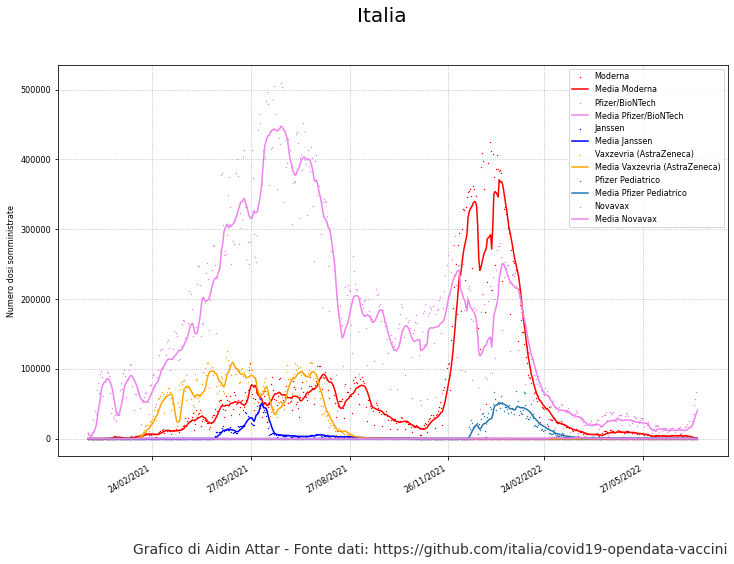

In [27]:
fig, ax = plt.subplots(figsize=(12,8))

colors=['red','violet','blue','orange','C0','violet','brown','black','plasma']
i=0
for key in italia_età.keys():
    ax.scatter(italia_età[key].index,italia_età[key]['totale'], color=colors[i],label=str(key),marker='x', s=0.2)
    italia_età[key]['media_totale'].plot(ax = ax,color=colors[i],label='Media '+str(key))
    i+=1

ax.xaxis.set_major_locator(mdates.MonthLocator(interval=3))
ax.legend(loc='best')
fig.suptitle("Italia", fontsize=20)
plt.rcParams['font.size'] = '8'
ax.tick_params(axis='both', labelsize=8)
ax.grid(alpha = 1,linestyle='dotted')
ax.set_ylabel('Numero dosi somministrate')
ax.set_xlabel("")
fig.autofmt_xdate()

plt.text(0.9, 0.05, 'Grafico di Aidin Attar - Fonte dati: https://github.com/italia/covid19-opendata-vaccini',
         transform=plt.gcf().transFigure,
         fontsize=14, color='black', alpha=0.8,
         ha='right', va='top', rotation='0')

plt.show()

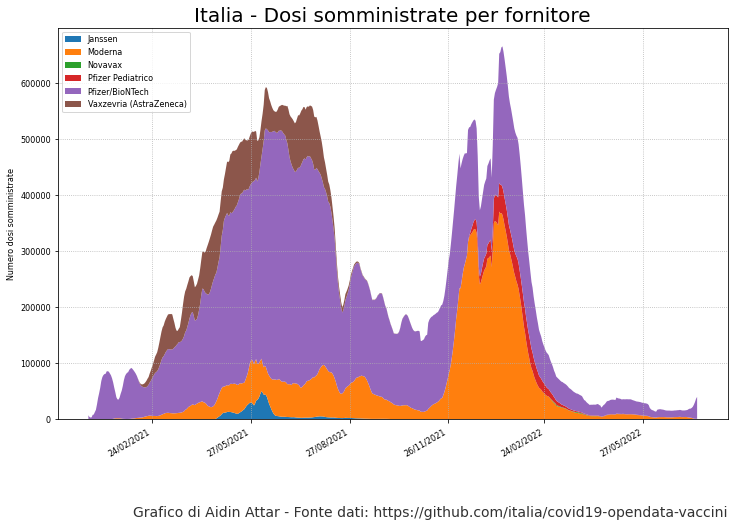

In [28]:
fig, ax = plt.subplots(figsize=(12,8))

colors=['red','violet','blue','orange','C0','violet','brown','yellow','green','black','purple']
ax.stackplot(italia_età['Pfizer/BioNTech'].index,[italia_età[key]['media_totale'] for key in sorted(italia_età.keys())])

label=[key for key in sorted(italia_età.keys())]
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=3))
ax.legend(label,loc='upper left')
ax.set_title("Italia - Dosi somministrate per fornitore", fontsize=20)
plt.rcParams['font.size'] = '8'
ax.tick_params(axis='both', labelsize=8)
ax.grid(alpha = 1,linestyle='dotted')
ax.set_ylabel('Numero dosi somministrate')
ax.set_xlabel("")
fig.autofmt_xdate()

plt.text(0.9, 0.05, 'Grafico di Aidin Attar - Fonte dati: https://github.com/italia/covid19-opendata-vaccini',
         transform=plt.gcf().transFigure,
         fontsize=14, color='black', alpha=0.8,
         ha='right', va='top', rotation='0')

plt.show()

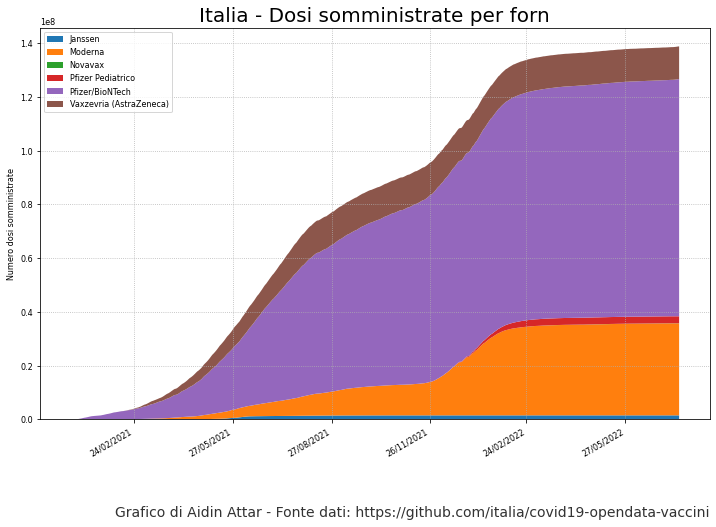

In [29]:
fig, ax = plt.subplots(figsize=(12,8))

colors=['red','violet','blue','orange','C0','violet','brown','yellow','green','black','purple']
ax.stackplot(italia_età['Pfizer/BioNTech'].index,[italia_età[key]['cumulativa_totale'] for key in sorted(italia_età.keys())])

label=[key for key in sorted(italia_età.keys())]
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=3))
ax.legend(label,loc='upper left')
ax.set_title("Italia - Dosi somministrate per forn", fontsize=20)
plt.rcParams['font.size'] = '8'
ax.tick_params(axis='both', labelsize=8)
ax.grid(alpha = 1,linestyle='dotted')
ax.set_ylabel('Numero dosi somministrate')
ax.set_xlabel("")
fig.autofmt_xdate()

plt.text(0.9, 0.05, 'Grafico di Aidin Attar - Fonte dati: https://github.com/italia/covid19-opendata-vaccini',
         transform=plt.gcf().transFigure,
         fontsize=14, color='black', alpha=0.8,
         ha='right', va='top', rotation='0')

plt.show()

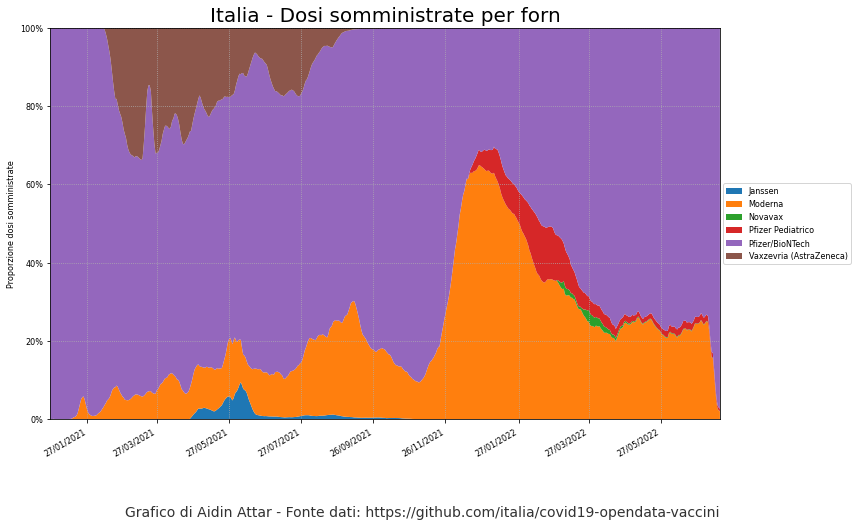

In [30]:
fig, ax = plt.subplots(figsize=(12,8))

colors=['red','violet','blue','orange','C0','violet','brown','yellow','green','black','purple']
ax.stackplot(italia_età['Pfizer/BioNTech'].index,[italia_età[key]['media_totale']*100/sum(italia_età[key1]['media_totale'] for key1 in italia_età.keys()) for key in sorted(italia_età.keys())])

label=[key for key in sorted(italia_età.keys())]
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=2))
ax.set_title("Italia - Dosi somministrate per forn", fontsize=20)
plt.rcParams['font.size'] = '8'
ax.tick_params(axis='both', labelsize=8)
ax.grid(alpha = 1,linestyle='dotted')
ax.set_ylabel('Proporzione dosi somministrate')
ax.set_xlabel("")
fig.autofmt_xdate()
ax.set_ylim(top=100)
ax.yaxis.set_major_formatter(mtick.PercentFormatter())
ax.set_xlim([date(2020, 12, 27).strftime('%d/%m/%Y'), yesterday.strftime('%d/%m/%Y')])
ax.legend(label, loc = 'center', bbox_to_anchor=(1.1, 0.5))

plt.text(0.9, 0.05, 'Grafico di Aidin Attar - Fonte dati: https://github.com/italia/covid19-opendata-vaccini',
         transform=plt.gcf().transFigure,
         fontsize=14, color='black', alpha=0.8,
         ha='right', va='top', rotation='0')

plt.show()

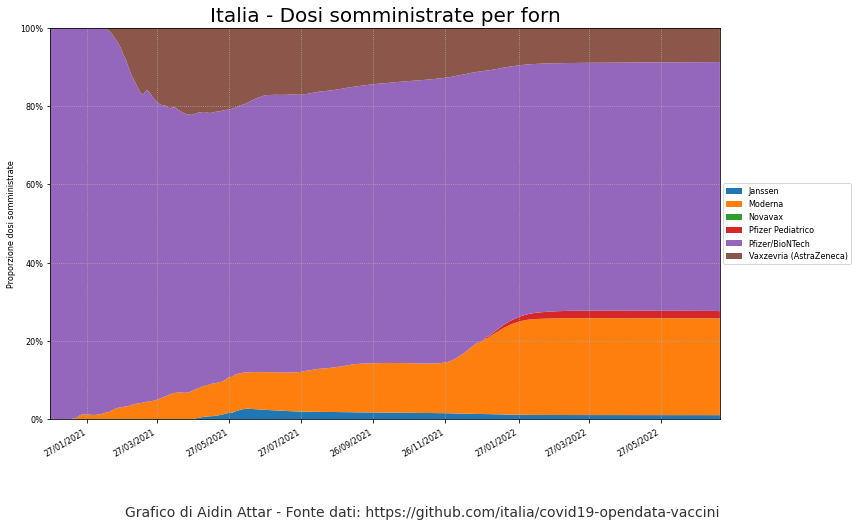

In [31]:
fig, ax = plt.subplots(figsize=(12,8))

colors=['red','violet','blue','orange','C0','violet','brown','yellow','green','black','purple']
ax.stackplot(italia_età['Pfizer/BioNTech'].index,[italia_età[key]['cumulativa_totale']*100/sum(italia_età[key1]['cumulativa_totale'] for key1 in italia_età.keys()) for key in sorted(italia_età.keys())])

label=[key for key in sorted(italia_età.keys())]
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=2))
ax.set_title("Italia - Dosi somministrate per forn", fontsize=20)
plt.rcParams['font.size'] = '8'
ax.tick_params(axis='both', labelsize=8)
ax.grid(alpha = 1,linestyle='dotted')
ax.set_ylabel('Proporzione dosi somministrate')
ax.set_xlabel("")
fig.autofmt_xdate()
ax.set_ylim(top=100)
ax.yaxis.set_major_formatter(mtick.PercentFormatter())
ax.set_xlim([date(2020, 12, 27).strftime('%d/%m/%Y'), yesterday.strftime('%d/%m/%Y')])
ax.legend(label, loc = 'center', bbox_to_anchor=(1.1, 0.5))

plt.text(0.9, 0.05, 'Grafico di Aidin Attar - Fonte dati: https://github.com/italia/covid19-opendata-vaccini',
         transform=plt.gcf().transFigure,
         fontsize=14, color='black', alpha=0.8,
         ha='right', va='top', rotation='0')

plt.show()

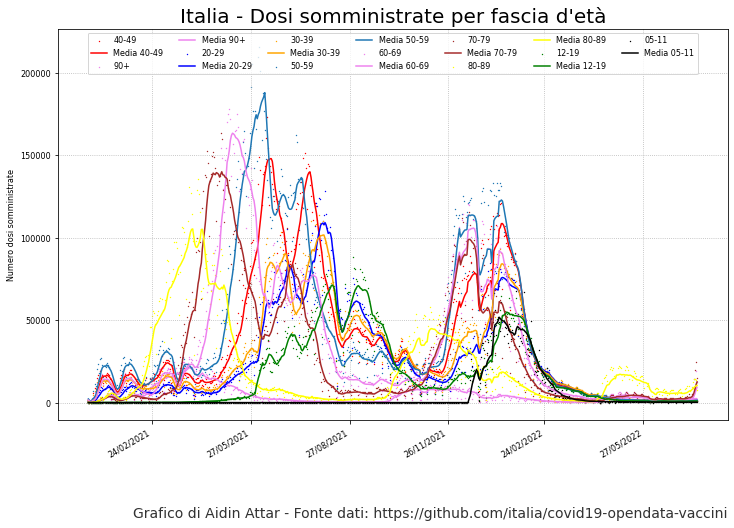

In [32]:
fig, ax = plt.subplots(figsize=(12,8))

colors=['red','violet','blue','orange','C0','violet','brown','yellow','green','black','purple']
i=0
for key in italia_fornitori.keys():
    ax.scatter(italia_fornitori[key].index,italia_fornitori[key]['totale'], c=colors[i],label=str(key),marker='x', s=0.2)
    italia_fornitori[key]['media_totale'].plot(ax = ax,color=colors[i],label='Media '+str(key))
    i+=1

ax.xaxis.set_major_locator(mdates.MonthLocator(interval=3))
ax.legend(loc='upper center', ncol=7)
ax.set_title("Italia - Dosi somministrate per fascia d'età", fontsize=20)
plt.rcParams['font.size'] = '8'
ax.tick_params(axis='both', labelsize=8)
ax.grid(alpha = 1,linestyle='dotted')
ax.set_ylabel('Numero dosi somministrate')
ax.set_xlabel("")
fig.autofmt_xdate()

plt.text(0.9, 0.05, 'Grafico di Aidin Attar - Fonte dati: https://github.com/italia/covid19-opendata-vaccini',
         transform=plt.gcf().transFigure,
         fontsize=14, color='black', alpha=0.8,
         ha='right', va='top', rotation='0')

plt.show()

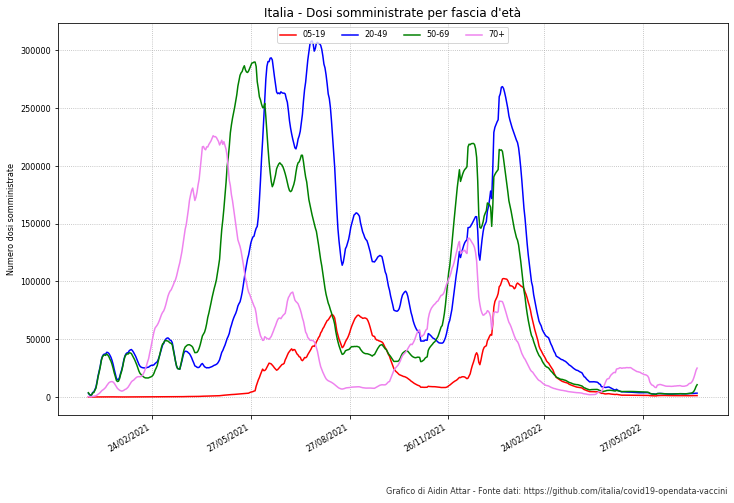

In [33]:
fig, ax = plt.subplots(figsize=(12,8))

colors=['red','violet','blue','orange','C0','violet','brown','yellow','green','black','purple']

ax.plot(italia_fornitori['90+'].index, italia_fornitori['05-11']['media_totale']+italia_fornitori['12-19']['media_totale'], label='05-19', color='red')
ax.plot(italia_fornitori['90+'].index, italia_fornitori['20-29']['media_totale']+italia_fornitori['30-39']['media_totale']+italia_fornitori['40-49']['media_totale'], label='20-49', color='blue')
ax.plot(italia_fornitori['90+'].index, italia_fornitori['50-59']['media_totale']+italia_fornitori['60-69']['media_totale'], label='50-69', color='green')
ax.plot(italia_fornitori['90+'].index, italia_fornitori['70-79']['media_totale']+italia_fornitori['80-89']['media_totale']+italia_fornitori['90+']['media_totale'], label='70+', color='violet')

ax.xaxis.set_major_locator(mdates.MonthLocator(interval=3))
ax.legend(loc='upper center', ncol=7)
ax.set_title("Italia - Dosi somministrate per fascia d'età", fontsize=12)
plt.rcParams['font.size'] = '8'
ax.tick_params(axis='both', labelsize=8)
ax.grid(alpha = 1,linestyle='dotted')
ax.set_ylabel('Numero dosi somministrate')
ax.set_xlabel("")
fig.autofmt_xdate()

plt.text(0.9, 0.075, 'Grafico di Aidin Attar - Fonte dati: https://github.com/italia/covid19-opendata-vaccini',
         transform=plt.gcf().transFigure,
         fontsize=8, color='black', alpha=0.8,
         ha='right', va='top', rotation='0')

plt.show()

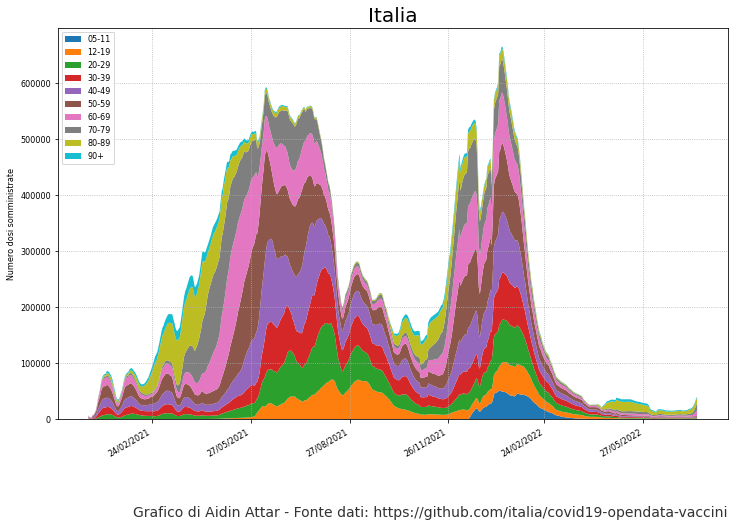

In [34]:
fig, ax = plt.subplots(figsize=(12,8))

colors=['red','violet','blue','orange','C0','violet','brown','yellow','green','black','purple']
ax.stackplot(italia_fornitori['50-59'].index,[italia_fornitori[key]['media_totale'] for key in sorted(italia_fornitori.keys())])

label=[key for key in sorted(italia_fornitori.keys())]
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=3))
ax.legend(label,loc='upper left')
ax.set_title("Italia", fontsize=20)
plt.rcParams['font.size'] = '8'
ax.tick_params(axis='both', labelsize=8)
ax.grid(alpha = 1,linestyle='dotted')
ax.set_ylabel('Numero dosi somministrate')
ax.set_xlabel("")
fig.autofmt_xdate()

plt.text(0.9, 0.05, 'Grafico di Aidin Attar - Fonte dati: https://github.com/italia/covid19-opendata-vaccini',
         transform=plt.gcf().transFigure,
         fontsize=14, color='black', alpha=0.8,
         ha='right', va='top', rotation='0')

plt.show()

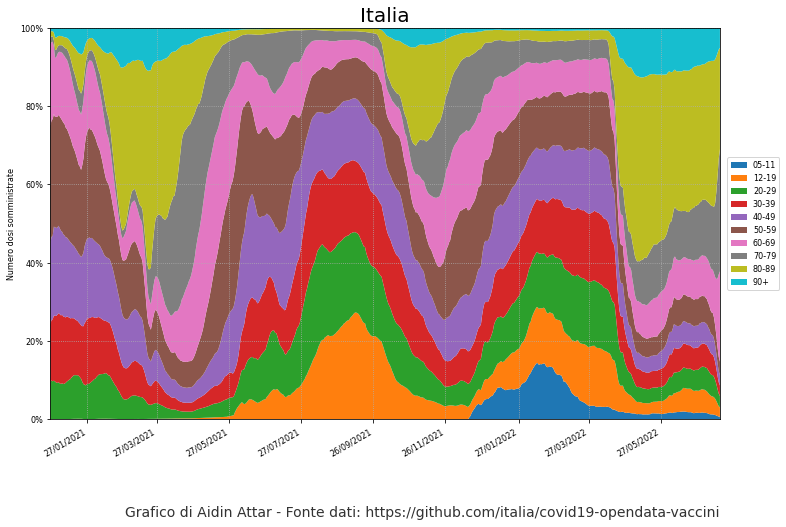

In [35]:
fig, ax = plt.subplots(figsize=(12,8))

colors=['red','violet','blue','orange','C0','violet','brown','yellow','green','black','purple']
ax.stackplot(italia_fornitori['50-59'].index,[italia_fornitori[key]['media_totale']*100/sum(italia_fornitori[key1]['media_totale'] for key1 in italia_fornitori.keys()) for key in sorted(italia_fornitori.keys())])

label=[key for key in sorted(italia_fornitori.keys())]
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=2))
ax.set_title("Italia", fontsize=20)
plt.rcParams['font.size'] = '8'
ax.tick_params(axis='both', labelsize=8)
ax.grid(alpha = 1,linestyle='dotted')
ax.set_ylabel('Numero dosi somministrate')
ax.set_xlabel("")
fig.autofmt_xdate()
ax.set_ylim(top=100)
ax.set_xlim([date(2020, 12, 27).strftime('%d/%m/%Y'), yesterday.strftime('%d/%m/%Y')])
ax.legend(label, loc = 'center', bbox_to_anchor=(1.05, 0.5))
ax.yaxis.set_major_formatter(mtick.PercentFormatter())

plt.text(0.9, 0.05, 'Grafico di Aidin Attar - Fonte dati: https://github.com/italia/covid19-opendata-vaccini',
         transform=plt.gcf().transFigure,
         fontsize=14, color='black', alpha=0.8,
         ha='right', va='top', rotation='0')

plt.show()

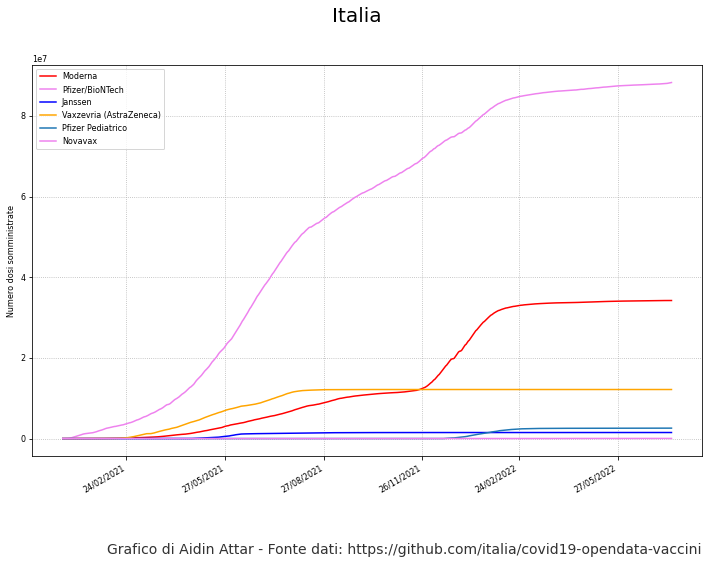

In [36]:
fig, ax = plt.subplots(figsize=(12,8))

colors=['red','violet','blue','orange','C0','violet','brown','black','plasma']
i=0
for key in italia_età.keys():
    ax.plot(italia_età[key].index,italia_età[key]['cumulativa_totale'], color=colors[i],label=str(key))
    #italia_età[key]['media_totale'].plot(ax = ax,color=colors[i],label='Media '+str(key))
    i+=1

ax.xaxis.set_major_locator(mdates.MonthLocator(interval=3))
ax.legend(loc='best')
fig.suptitle("Italia", fontsize=20)
plt.rcParams['font.size'] = '8'
ax.tick_params(axis='both', labelsize=8)
ax.grid(alpha = 1,linestyle='dotted')
ax.set_ylabel('Numero dosi somministrate')
ax.set_xlabel("")
fig.autofmt_xdate()

plt.text(0.9, 0.05, 'Grafico di Aidin Attar - Fonte dati: https://github.com/italia/covid19-opendata-vaccini',
         transform=plt.gcf().transFigure,
         fontsize=14, color='black', alpha=0.8,
         ha='right', va='top', rotation='0')

plt.show()

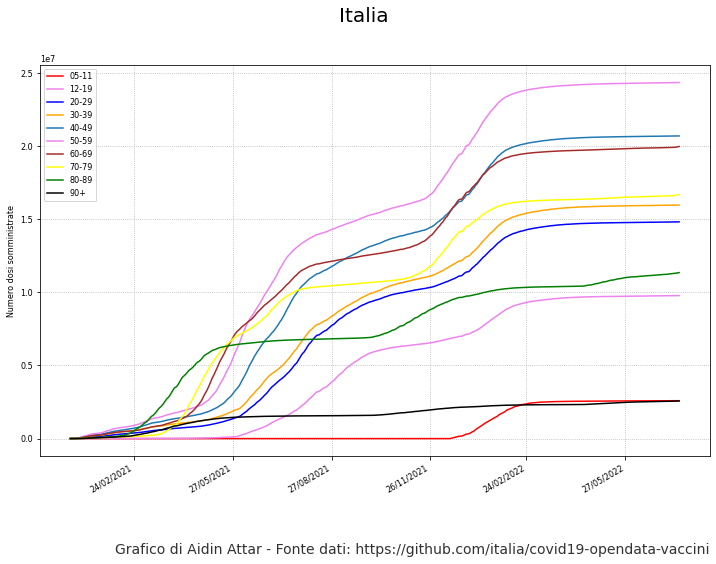

In [37]:
fig, ax = plt.subplots(figsize=(12,8))

colors=['red','violet','blue','orange','C0','violet','brown','yellow','green','black','purple']
i=0
for key in sorted(italia_fornitori.keys()):
    ax.plot(italia_fornitori[key].index,italia_fornitori[key]['cumulativa_totale'], color=colors[i],label=str(key))
    i+=1
    #.plot(ax = ax,color=colors,label='Media '+str(key))

ax.xaxis.set_major_locator(mdates.MonthLocator(interval=3))
ax.legend(loc='best')
fig.suptitle("Italia", fontsize=20)
plt.rcParams['font.size'] = '8'
ax.tick_params(axis='both', labelsize=8)
ax.grid(alpha = 1,linestyle='dotted')
ax.set_ylabel('Numero dosi somministrate')
ax.set_xlabel("")
fig.autofmt_xdate()

plt.text(0.9, 0.05, 'Grafico di Aidin Attar - Fonte dati: https://github.com/italia/covid19-opendata-vaccini',
         transform=plt.gcf().transFigure,
         fontsize=14, color='black', alpha=0.8,
         ha='right', va='top', rotation='0')

plt.show()

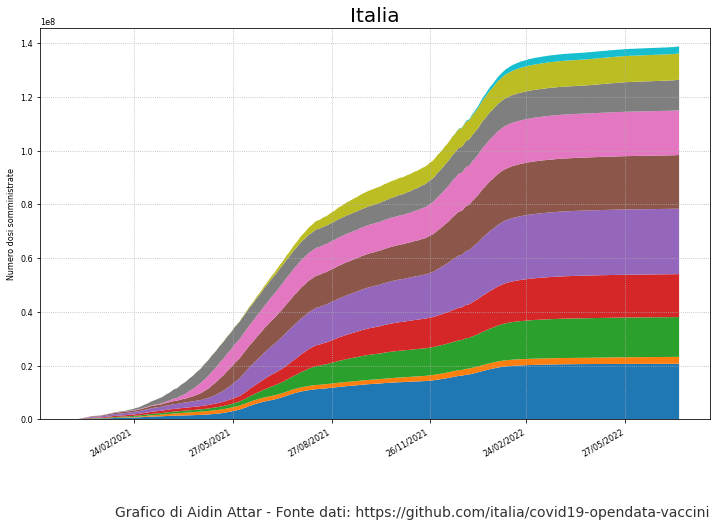

In [38]:
fig, ax = plt.subplots(figsize=(12,8))

colors=['red','violet','blue','orange','C0','violet','brown','yellow','green','black','purple']
ax.stackplot(italia_fornitori['50-59'].index,[italia_fornitori[key]['cumulativa_totale'] for key in italia_fornitori.keys()])

label=[key for key in sorted(italia_fornitori.keys())]
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=3))
ax.set_title("Italia", fontsize=20)
plt.rcParams['font.size'] = '8'
ax.tick_params(axis='both', labelsize=8)
ax.grid(alpha = 1,linestyle='dotted')
ax.set_ylabel('Numero dosi somministrate')
ax.set_xlabel("")
fig.autofmt_xdate()

plt.text(0.9, 0.05, 'Grafico di Aidin Attar - Fonte dati: https://github.com/italia/covid19-opendata-vaccini',
         transform=plt.gcf().transFigure,
         fontsize=14, color='black', alpha=0.8,
         ha='right', va='top', rotation='0')

plt.show()

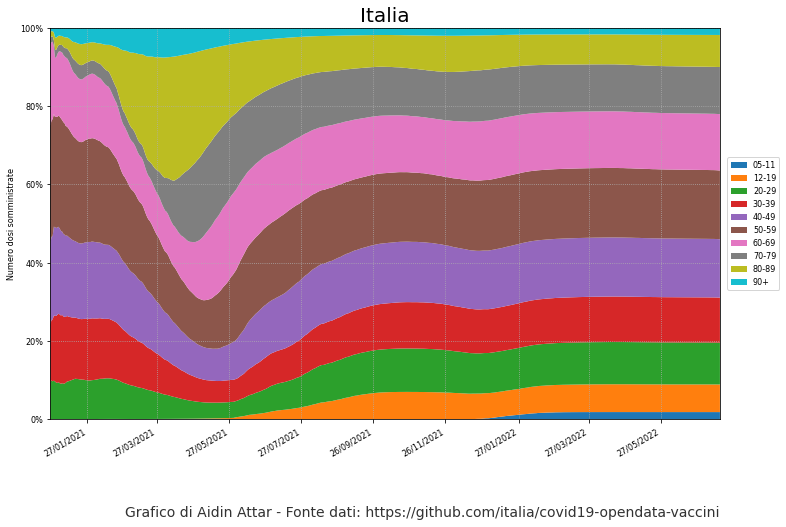

In [39]:
fig, ax = plt.subplots(figsize=(12,8))

colors=['red','violet','blue','orange','C0','violet','brown','yellow','green','black','purple']
ax.stackplot(italia_fornitori['50-59'].index,[italia_fornitori[key]['cumulativa_totale']*100/sum(italia_fornitori[key1]['cumulativa_totale'] for key1 in italia_fornitori.keys()) for key in sorted(italia_fornitori.keys())])

label=[key for key in sorted(italia_fornitori.keys())]
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=2))
ax.set_title("Italia", fontsize=20)
plt.rcParams['font.size'] = '8'
ax.tick_params(axis='both', labelsize=8)
ax.grid(alpha = 1,linestyle='dotted')
ax.set_ylabel('Numero dosi somministrate')
ax.set_xlabel("")
fig.autofmt_xdate()
ax.set_ylim(top=100)
ax.yaxis.set_major_formatter(mtick.PercentFormatter())
ax.set_xlim([date(2020, 12, 27).strftime('%d/%m/%Y'), yesterday.strftime('%d/%m/%Y')])
ax.legend(label, loc = 'center', bbox_to_anchor=(1.05, 0.5))

plt.text(0.9, 0.05, 'Grafico di Aidin Attar - Fonte dati: https://github.com/italia/covid19-opendata-vaccini',
         transform=plt.gcf().transFigure,
         fontsize=14, color='black', alpha=0.8,
         ha='right', va='top', rotation='0')

plt.show()

In [40]:
PlateaFasce=sorted(platea.eta.unique())
Platea_Italia=dict()

for f in PlateaFasce:
    Platea_Italia[f]=platea.groupby('eta').get_group(f)['totale_popolazione'].sum()
Platea_Italia

{'05-11': 3656069,
 '12-19': 4620379,
 '20-29': 6040323,
 '30-39': 6782798,
 '40-49': 8781291,
 '50-59': 9619202,
 '60-69': 7531587,
 '70-79': 6016425,
 '80+': 4601980}

In [41]:
new_italia_fornitori = copy.deepcopy(italia_fornitori)
new_italia_fornitori['80+'] = copy.deepcopy(italia_fornitori['90+'])
new_italia_fornitori['80+']['totale'] = italia_fornitori['80-89']['totale']+italia_fornitori['90+']['totale']
new_italia_fornitori['80+'][     'm'] = italia_fornitori['80-89'][     'm']+italia_fornitori['90+'][     'm']
new_italia_fornitori['80+'][     'f'] = italia_fornitori['80-89'][     'f']+italia_fornitori['90+'][     'f']
new_italia_fornitori['80+'][    'd1'] = italia_fornitori['80-89'][    'd1']+italia_fornitori['90+'][    'd1']
new_italia_fornitori['80+'][    'd2'] = italia_fornitori['80-89'][    'd2']+italia_fornitori['90+'][    'd2']
new_italia_fornitori['80+'][   'dpi'] = italia_fornitori['80-89'][   'dpi']+italia_fornitori['90+'][   'dpi']
new_italia_fornitori['80+'][   'db1'] = italia_fornitori['80-89'][   'db1']+italia_fornitori['90+'][   'db1']
new_italia_fornitori['80+'][   'dbi'] = italia_fornitori['80-89'][   'dbi']+italia_fornitori['90+'][   'dbi']
new_italia_fornitori['80+'][   'db2'] = italia_fornitori['80-89'][   'db2']+italia_fornitori['90+'][   'db2']
new_italia_fornitori.pop('80-89')
new_italia_fornitori.pop('90+')

for key1 in new_italia_fornitori.keys():
    new_italia_fornitori[key1]['media_totale'] = new_italia_fornitori[key1]['totale'].rolling(window=7, min_periods=1).mean()
    new_italia_fornitori[key1][     'media_m'] = new_italia_fornitori[key1][     'm'].rolling(window=7, min_periods=1).mean()
    new_italia_fornitori[key1][     'media_f'] = new_italia_fornitori[key1][     'f'].rolling(window=7, min_periods=1).mean()
    new_italia_fornitori[key1][    'media_d1'] = new_italia_fornitori[key1][    'd1'].rolling(window=7, min_periods=1).mean()
    new_italia_fornitori[key1][    'media_d2'] = new_italia_fornitori[key1][    'd2'].rolling(window=7, min_periods=1).mean()
    new_italia_fornitori[key1][   'media_dpi'] = new_italia_fornitori[key1][   'dpi'].rolling(window=7, min_periods=1).mean()
    new_italia_fornitori[key1][   'media_db1'] = new_italia_fornitori[key1][   'db1'].rolling(window=7, min_periods=1).mean()
    new_italia_fornitori[key1][   'media_dbi'] = new_italia_fornitori[key1][   'dbi'].rolling(window=7, min_periods=1).mean()
    new_italia_fornitori[key1][   'media_db2'] = new_italia_fornitori[key1][   'db2'].rolling(window=7, min_periods=1).mean()

    new_italia_fornitori[key1]['cumulativa_totale'] = new_italia_fornitori[key1]['totale'].cumsum()
    new_italia_fornitori[key1][     'cumulativa_m'] = new_italia_fornitori[key1][     'm'].cumsum()
    new_italia_fornitori[key1][     'cumulativa_f'] = new_italia_fornitori[key1][     'f'].cumsum()
    new_italia_fornitori[key1][    'cumulativa_d1'] = new_italia_fornitori[key1][    'd1'].cumsum()
    new_italia_fornitori[key1][    'cumulativa_d2'] = new_italia_fornitori[key1][    'd2'].cumsum()
    new_italia_fornitori[key1][   'cumulativa_dpi'] = new_italia_fornitori[key1][   'dpi'].cumsum()
    new_italia_fornitori[key1][   'cumulativa_db1'] = new_italia_fornitori[key1][   'db1'].cumsum()
    new_italia_fornitori[key1][   'cumulativa_dbi'] = new_italia_fornitori[key1][   'dbi'].cumsum()
    new_italia_fornitori[key1][   'cumulativa_db2'] = new_italia_fornitori[key1][   'db2'].cumsum()

    new_italia_fornitori[key1]['perc_cumulativa_totale'] = new_italia_fornitori[key1]['cumulativa_totale'] / Platea_Italia[key1] * 100
    new_italia_fornitori[key1][     'perc_cumulativa_m'] = new_italia_fornitori[key1][     'cumulativa_m'] / Platea_Italia[key1] * 100
    new_italia_fornitori[key1][     'perc_cumulativa_f'] = new_italia_fornitori[key1][     'cumulativa_f'] / Platea_Italia[key1] * 100
    new_italia_fornitori[key1][    'perc_cumulativa_d1'] = new_italia_fornitori[key1][    'cumulativa_d1'] / Platea_Italia[key1] * 100
    new_italia_fornitori[key1][    'perc_cumulativa_d2'] = new_italia_fornitori[key1][    'cumulativa_d2'] / Platea_Italia[key1] * 100
    new_italia_fornitori[key1][   'perc_cumulativa_dpi'] = new_italia_fornitori[key1][   'cumulativa_dpi'] / Platea_Italia[key1] * 100
    new_italia_fornitori[key1][   'perc_cumulativa_db1'] = new_italia_fornitori[key1][   'cumulativa_db1'] / Platea_Italia[key1] * 100
    new_italia_fornitori[key1][   'perc_cumulativa_dbi'] = new_italia_fornitori[key1][   'cumulativa_dbi'] / Platea_Italia[key1] * 100
    new_italia_fornitori[key1][   'perc_cumulativa_db2'] = new_italia_fornitori[key1][   'cumulativa_db2'] / Platea_Italia[key1] * 100

    new_italia_fornitori[key1][ 'rimasti_cumulativa_totale'] = Platea_Italia[key1] - new_italia_fornitori[key1][ 'cumulativa_totale']
    new_italia_fornitori[key1][      'rimasti_cumulativa_m'] = Platea_Italia[key1] - new_italia_fornitori[key1][      'cumulativa_m']
    new_italia_fornitori[key1][      'rimasti_cumulativa_f'] = Platea_Italia[key1] - new_italia_fornitori[key1][      'cumulativa_f']
    new_italia_fornitori[key1][     'rimasti_cumulativa_d1'] = Platea_Italia[key1] - new_italia_fornitori[key1][     'cumulativa_d1']
    new_italia_fornitori[key1][     'rimasti_cumulativa_d2'] = Platea_Italia[key1] - new_italia_fornitori[key1][     'cumulativa_d2']
    new_italia_fornitori[key1][    'rimasti_cumulativa_dpi'] = Platea_Italia[key1] - new_italia_fornitori[key1][    'cumulativa_dpi']
    new_italia_fornitori[key1][    'rimasti_cumulativa_db1'] = Platea_Italia[key1] - new_italia_fornitori[key1][    'cumulativa_db1']
    new_italia_fornitori[key1][    'rimasti_cumulativa_dbi'] = Platea_Italia[key1] - new_italia_fornitori[key1][    'cumulativa_dbi']
    new_italia_fornitori[key1][    'rimasti_cumulativa_db2'] = Platea_Italia[key1] - new_italia_fornitori[key1][    'cumulativa_db2']

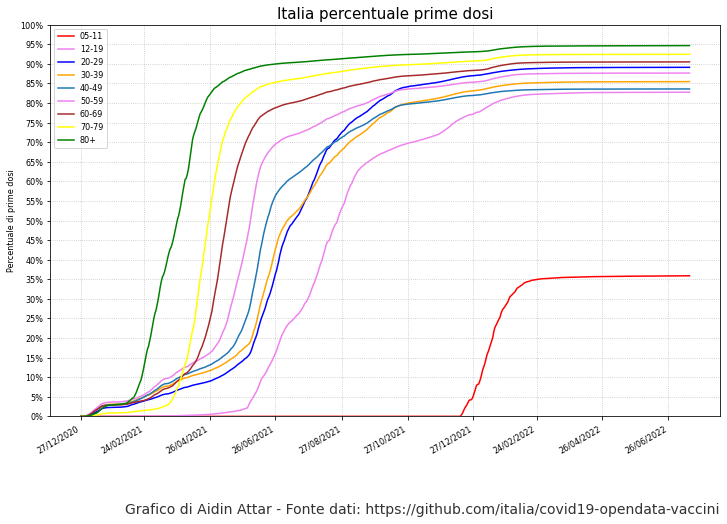

In [42]:
fig, ax = plt.subplots(figsize=(12,8))

colors=['red','violet','blue','orange','C0','violet','brown','yellow','green','black','purple']
i=0
for key in sorted(new_italia_fornitori.keys()):
    ax.plot(new_italia_fornitori[key].index,new_italia_fornitori[key]['perc_cumulativa_d1'], color=colors[i],label=str(key))
    i+=1

ax.xaxis.set_major_locator(mdates.MonthLocator(interval=2))
ax.legend(loc='best')
ax.set_title("Italia percentuale prime dosi", fontsize=15)
plt.rcParams['font.size'] = '8'
ax.yaxis.set_major_locator(MultipleLocator(5))
ax.tick_params(axis='both', labelsize=8)
ax.grid(alpha = 0.8,linestyle='dotted')
ax.set_ylabel('Percentuale di prime dosi')
ax.set_xlabel("")
ax.set_ylim([0,100])
fig.autofmt_xdate()

ax.yaxis.set_major_formatter(mtick.PercentFormatter())
plt.text(0.9, 0.05, 'Grafico di Aidin Attar - Fonte dati: https://github.com/italia/covid19-opendata-vaccini',
         transform=plt.gcf().transFigure,
         fontsize=14, color='black', alpha=0.8,
         ha='right', va='top', rotation='0')

plt.show()

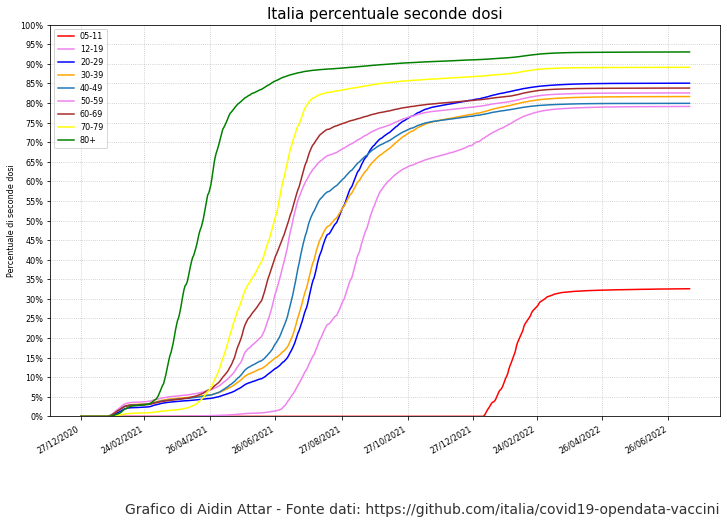

In [43]:
fig, ax = plt.subplots(figsize=(12,8))

colors=['red','violet','blue','orange','C0','violet','brown','yellow','green','black','purple']
i=0
for key in sorted(new_italia_fornitori.keys()):
    ax.plot(new_italia_fornitori[key].index,new_italia_fornitori[key]['perc_cumulativa_d2'], color=colors[i],label=str(key))
    i+=1
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=2))
ax.legend(loc='best')
ax.set_title("Italia percentuale seconde dosi", fontsize=15)
ax.yaxis.set_major_locator(MultipleLocator(5))
plt.rcParams['font.size'] = '8'
ax.tick_params(axis='both', labelsize=8)
ax.grid(alpha = 0.8,linestyle='dotted')
ax.set_ylabel('Percentuale di seconde dosi')
ax.set_xlabel("")
fig.autofmt_xdate()
ax.set_ylim([0,100])

ax.yaxis.set_major_formatter(mtick.PercentFormatter())
plt.text(0.9, 0.05, 'Grafico di Aidin Attar - Fonte dati: https://github.com/italia/covid19-opendata-vaccini',
         transform=plt.gcf().transFigure,
         fontsize=14, color='black', alpha=0.8,
         ha='right', va='top', rotation='0')

plt.show()

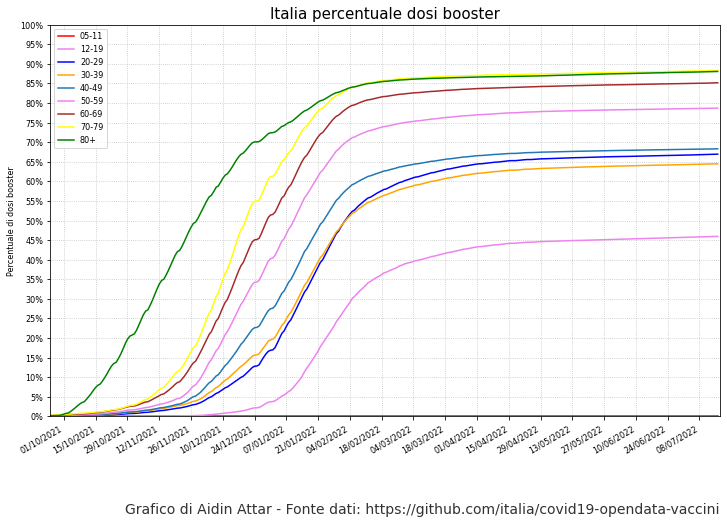

In [44]:
fig, ax = plt.subplots(figsize=(12,8))

colors=['red','violet','blue','orange','C0','violet','brown','yellow','green','black','purple']
i=0
for key in sorted(new_italia_fornitori.keys()):
    ax.plot(new_italia_fornitori[key].index,new_italia_fornitori[key]['perc_cumulativa_db1'], color=colors[i],label=str(key))
    i+=1
ax.xaxis.set_major_locator(mdates.WeekdayLocator(interval=2))
ax.set_xlim([date(2021, 9, 25).strftime('%d/%m/%Y'), today.strftime('%d/%m/%Y')])
ax.legend(loc='best')
ax.set_title("Italia percentuale dosi booster", fontsize=15)
ax.yaxis.set_major_locator(MultipleLocator(5))
plt.rcParams['font.size'] = '8'
ax.tick_params(axis='both', labelsize=8)
ax.grid(alpha = 0.8,linestyle='dotted')
ax.set_ylabel('Percentuale di dosi booster')
ax.set_xlabel("")
fig.autofmt_xdate()
ax.set_ylim([0,100])

ax.yaxis.set_major_formatter(mtick.PercentFormatter())
plt.text(0.9, 0.05, 'Grafico di Aidin Attar - Fonte dati: https://github.com/italia/covid19-opendata-vaccini',
         transform=plt.gcf().transFigure,
         fontsize=14, color='black', alpha=0.8,
         ha='right', va='top', rotation='0')

plt.show()

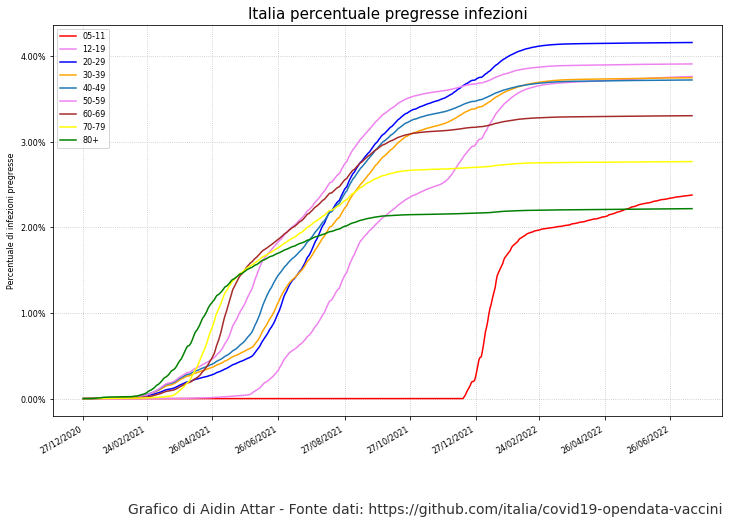

In [45]:
fig, ax = plt.subplots(figsize=(12,8))

colors=['red','violet','blue','orange','C0','violet','brown','yellow','green','black','purple']
i=0
for key in sorted(new_italia_fornitori.keys()):
    ax.plot(new_italia_fornitori[key].index,new_italia_fornitori[key]['perc_cumulativa_dpi'], color=colors[i],label=str(key))
    i+=1
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=2))
#ax.set_xlim([date(2021, 9, 25).strftime('%d/%m/%Y'), yesterday.strftime('%d/%m/%Y')])
ax.legend(loc='best')
ax.set_title("Italia percentuale pregresse infezioni", fontsize=15)
#ax.yaxis.set_major_locator(MultipleLocator(5))
plt.rcParams['font.size'] = '8'
ax.tick_params(axis='both', labelsize=8)
ax.grid(alpha = 0.8,linestyle='dotted')
ax.set_ylabel('Percentuale di infezioni pregresse')
ax.set_xlabel("")
fig.autofmt_xdate()

ax.yaxis.set_major_formatter(mtick.PercentFormatter())
plt.text(0.9, 0.05, 'Grafico di Aidin Attar - Fonte dati: https://github.com/italia/covid19-opendata-vaccini',
         transform=plt.gcf().transFigure,
         fontsize=14, color='black', alpha=0.8,
         ha='right', va='top', rotation='0')

plt.show()

In [46]:
somministrazioni_età_fornitori

{'Abruzzo': {'40-49': {'Moderna':              forn area      eta    m    f   d1   d2  dpi  db1  dbi  db2   N1  \
   27/12/2020  40-49  ABR  Moderna  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ITF   
   28/12/2020  40-49  ABR  Moderna  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ITF   
   29/12/2020  40-49  ABR  Moderna  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ITF   
   30/12/2020  40-49  ABR  Moderna  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ITF   
   31/12/2020  40-49  ABR  Moderna  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ITF   
   ...           ...  ...      ...  ...  ...  ...  ...  ...  ...  ...  ...  ...   
   12/07/2022  40-49    0  Moderna  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0    0   
   13/07/2022  40-49    0  Moderna  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0    0   
   14/07/2022  40-49    0  Moderna  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0    0   
   15/07/2022  40-49    0  Moderna  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0    0   
   16/07/2022  40-49    0  Moderna  0.0  0.0  0.0  0.0  

In [47]:
somministrazioni_età={elem1:{elem2:pd.DataFrame for elem2 in NomiFornitori} for elem1 in NomiRegioni}
for key in somministrazioni_età.keys():
    somministrazioni_età[key] = copy.deepcopy(somministrazioni_età_fornitori[key]['20-29'])

for key1 in somministrazioni_età.keys():
    for key2 in somministrazioni_età[key1].keys():
        somministrazioni_età[key1][key2]['totale'] = sum(somministrazioni_età_fornitori[key1][key][key2]['totale'].fillna(0) for key in somministrazioni_età_fornitori[key1].keys())
        somministrazioni_età[key1][key2][     'm'] = sum(somministrazioni_età_fornitori[key1][key][key2][     'm'].fillna(0) for key in somministrazioni_età_fornitori[key1].keys())
        somministrazioni_età[key1][key2][     'f'] = sum(somministrazioni_età_fornitori[key1][key][key2][     'f'].fillna(0) for key in somministrazioni_età_fornitori[key1].keys())
        somministrazioni_età[key1][key2][    'd1'] = sum(somministrazioni_età_fornitori[key1][key][key2][    'd1'].fillna(0) for key in somministrazioni_età_fornitori[key1].keys())
        somministrazioni_età[key1][key2][    'd2'] = sum(somministrazioni_età_fornitori[key1][key][key2][    'd2'].fillna(0) for key in somministrazioni_età_fornitori[key1].keys())
        somministrazioni_età[key1][key2][   'dpi'] = sum(somministrazioni_età_fornitori[key1][key][key2][   'dpi'].fillna(0) for key in somministrazioni_età_fornitori[key1].keys())
        somministrazioni_età[key1][key2][   'db1'] = sum(somministrazioni_età_fornitori[key1][key][key2][   'db1'].fillna(0) for key in somministrazioni_età_fornitori[key1].keys())
        somministrazioni_età[key1][key2][   'dbi'] = sum(somministrazioni_età_fornitori[key1][key][key2][   'dbi'].fillna(0) for key in somministrazioni_età_fornitori[key1].keys())
        somministrazioni_età[key1][key2][   'db2'] = sum(somministrazioni_età_fornitori[key1][key][key2][   'db2'].fillna(0) for key in somministrazioni_età_fornitori[key1].keys())

        somministrazioni_età[key1][key2]['totale_per100'] = somministrazioni_età[key1][key2]['totale'] / DictRegioni[key1] * 100
        somministrazioni_età[key1][key2][     'm_per100'] = somministrazioni_età[key1][key2][     'm'] / DictRegioni[key1] * 100
        somministrazioni_età[key1][key2][     'f_per100'] = somministrazioni_età[key1][key2][     'f'] / DictRegioni[key1] * 100
        somministrazioni_età[key1][key2][    'd1_per100'] = somministrazioni_età[key1][key2][    'd1'] / DictRegioni[key1] * 100
        somministrazioni_età[key1][key2][    'd2_per100'] = somministrazioni_età[key1][key2][    'd2'] / DictRegioni[key1] * 100
        somministrazioni_età[key1][key2][   'dpi_per100'] = somministrazioni_età[key1][key2][   'dpi'] / DictRegioni[key1] * 100
        somministrazioni_età[key1][key2][   'db1_per100'] = somministrazioni_età[key1][key2][   'db1'] / DictRegioni[key1] * 100
        somministrazioni_età[key1][key2][   'dbi_per100'] = somministrazioni_età[key1][key2][   'dbi'] / DictRegioni[key1] * 100
        somministrazioni_età[key1][key2][   'db2_per100'] = somministrazioni_età[key1][key2][   'db2'] / DictRegioni[key1] * 100

for key1 in somministrazioni_età.keys():
    for key2 in somministrazioni_età[key1].keys():
        somministrazioni_età[key1][key2]['media_totale'] = somministrazioni_età[key1][key2]['totale'].rolling(window=7, min_periods=1).mean()
        somministrazioni_età[key1][key2][     'media_m'] = somministrazioni_età[key1][key2][     'm'].rolling(window=7, min_periods=1).mean()
        somministrazioni_età[key1][key2][     'media_f'] = somministrazioni_età[key1][key2][     'f'].rolling(window=7, min_periods=1).mean()
        somministrazioni_età[key1][key2][    'media_d1'] = somministrazioni_età[key1][key2][    'd1'].rolling(window=7, min_periods=1).mean()
        somministrazioni_età[key1][key2][    'media_d2'] = somministrazioni_età[key1][key2][    'd2'].rolling(window=7, min_periods=1).mean()
        somministrazioni_età[key1][key2][   'media_dpi'] = somministrazioni_età[key1][key2][   'dpi'].rolling(window=7, min_periods=1).mean()
        somministrazioni_età[key1][key2][   'media_db1'] = somministrazioni_età[key1][key2][   'db1'].rolling(window=7, min_periods=1).mean()
        somministrazioni_età[key1][key2][   'media_dbi'] = somministrazioni_età[key1][key2][   'dbi'].rolling(window=7, min_periods=1).mean()
        somministrazioni_età[key1][key2][   'media_db2'] = somministrazioni_età[key1][key2][   'db2'].rolling(window=7, min_periods=1).mean()

        somministrazioni_età[key1][key2]['media_totale_per100'] = somministrazioni_età[key1][key2]['totale_per100'].rolling(window=7, min_periods=1).mean()
        somministrazioni_età[key1][key2][     'media_m_per100'] = somministrazioni_età[key1][key2][     'm_per100'].rolling(window=7, min_periods=1).mean()
        somministrazioni_età[key1][key2][     'media_f_per100'] = somministrazioni_età[key1][key2][     'f_per100'].rolling(window=7, min_periods=1).mean()
        somministrazioni_età[key1][key2][    'media_d1_per100'] = somministrazioni_età[key1][key2][    'd1_per100'].rolling(window=7, min_periods=1).mean()
        somministrazioni_età[key1][key2][    'media_d2_per100'] = somministrazioni_età[key1][key2][    'd2_per100'].rolling(window=7, min_periods=1).mean()
        somministrazioni_età[key1][key2][   'media_dpi_per100'] = somministrazioni_età[key1][key2][   'dpi_per100'].rolling(window=7, min_periods=1).mean()
        somministrazioni_età[key1][key2][   'media_db1_per100'] = somministrazioni_età[key1][key2][   'db1_per100'].rolling(window=7, min_periods=1).mean()
        somministrazioni_età[key1][key2][   'media_dbi_per100'] = somministrazioni_età[key1][key2][   'dbi_per100'].rolling(window=7, min_periods=1).mean()
        somministrazioni_età[key1][key2][   'media_db2_per100'] = somministrazioni_età[key1][key2][   'db2_per100'].rolling(window=7, min_periods=1).mean()

        somministrazioni_età[key1][key2]['cumulativa_totale'] = somministrazioni_età[key1][key2]['totale'].cumsum()
        somministrazioni_età[key1][key2][     'cumulativa_m'] = somministrazioni_età[key1][key2][     'm'].cumsum()
        somministrazioni_età[key1][key2][     'cumulativa_f'] = somministrazioni_età[key1][key2][     'f'].cumsum()
        somministrazioni_età[key1][key2][    'cumulativa_d1'] = somministrazioni_età[key1][key2][    'd1'].cumsum()
        somministrazioni_età[key1][key2][    'cumulativa_d2'] = somministrazioni_età[key1][key2][    'd2'].cumsum()
        somministrazioni_età[key1][key2][   'cumulativa_dpi'] = somministrazioni_età[key1][key2][   'dpi'].cumsum()
        somministrazioni_età[key1][key2][   'cumulativa_db1'] = somministrazioni_età[key1][key2][   'db1'].cumsum()
        somministrazioni_età[key1][key2][   'cumulativa_dbi'] = somministrazioni_età[key1][key2][   'dbi'].cumsum()
        somministrazioni_età[key1][key2][   'cumulativa_db2'] = somministrazioni_età[key1][key2][   'db2'].cumsum()

        somministrazioni_età[key1][key2]['cumulativa_totale_per100'] = somministrazioni_età[key1][key2]['totale_per100'].cumsum()
        somministrazioni_età[key1][key2][     'cumulativa_m_per100'] = somministrazioni_età[key1][key2][     'm_per100'].cumsum()
        somministrazioni_età[key1][key2][     'cumulativa_f_per100'] = somministrazioni_età[key1][key2][     'f_per100'].cumsum()
        somministrazioni_età[key1][key2][    'cumulativa_d1_per100'] = somministrazioni_età[key1][key2][    'd1_per100'].cumsum()
        somministrazioni_età[key1][key2][    'cumulativa_d2_per100'] = somministrazioni_età[key1][key2][    'd2_per100'].cumsum()
        somministrazioni_età[key1][key2][   'cumulativa_dpi_per100'] = somministrazioni_età[key1][key2][   'dpi_per100'].cumsum()
        somministrazioni_età[key1][key2][   'cumulativa_db1_per100'] = somministrazioni_età[key1][key2][   'db1_per100'].cumsum()
        somministrazioni_età[key1][key2][   'cumulativa_dbi_per100'] = somministrazioni_età[key1][key2][   'dbi_per100'].cumsum()
        somministrazioni_età[key1][key2][   'cumulativa_db2_per100'] = somministrazioni_età[key1][key2][   'db2_per100'].cumsum()

In [48]:
somministrazioni_fornitori={elem1:{elem2:pd.DataFrame for elem2 in FasceAnagrafiche} for elem1 in NomiRegioni}

for key in somministrazioni_fornitori.keys():
    somministrazioni_fornitori[key] = copy.deepcopy(somministrazioni_fornitori_età[key]['Pfizer/BioNTech'])

for key1 in somministrazioni_fornitori.keys():
    for key2 in somministrazioni_fornitori[key1].keys():
        somministrazioni_fornitori[key1][key2]['totale'] = sum(somministrazioni_fornitori_età[key1][key][key2]['totale'].fillna(0) for key in somministrazioni_fornitori_età[key1].keys())
        somministrazioni_fornitori[key1][key2][     'm'] = sum(somministrazioni_fornitori_età[key1][key][key2][     'm'].fillna(0) for key in somministrazioni_fornitori_età[key1].keys())
        somministrazioni_fornitori[key1][key2][     'f'] = sum(somministrazioni_fornitori_età[key1][key][key2][     'f'].fillna(0) for key in somministrazioni_fornitori_età[key1].keys())
        somministrazioni_fornitori[key1][key2][    'd1'] = sum(somministrazioni_fornitori_età[key1][key][key2][    'd1'].fillna(0) for key in somministrazioni_fornitori_età[key1].keys())
        somministrazioni_fornitori[key1][key2][    'd2'] = sum(somministrazioni_fornitori_età[key1][key][key2][    'd2'].fillna(0) for key in somministrazioni_fornitori_età[key1].keys())
        somministrazioni_fornitori[key1][key2][   'dpi'] = sum(somministrazioni_fornitori_età[key1][key][key2][   'dpi'].fillna(0) for key in somministrazioni_fornitori_età[key1].keys())
        somministrazioni_fornitori[key1][key2][   'db1'] = sum(somministrazioni_fornitori_età[key1][key][key2][   'db1'].fillna(0) for key in somministrazioni_fornitori_età[key1].keys())
        somministrazioni_fornitori[key1][key2][   'dbi'] = sum(somministrazioni_fornitori_età[key1][key][key2][   'dbi'].fillna(0) for key in somministrazioni_fornitori_età[key1].keys())
        somministrazioni_fornitori[key1][key2][   'db2'] = sum(somministrazioni_fornitori_età[key1][key][key2][   'db2'].fillna(0) for key in somministrazioni_fornitori_età[key1].keys())

        somministrazioni_fornitori[key1][key2]['totale_per100'] = somministrazioni_fornitori[key1][key2]['totale'] / DictRegioni[key1] * 100
        somministrazioni_fornitori[key1][key2][     'm_per100'] = somministrazioni_fornitori[key1][key2][     'm'] / DictRegioni[key1] * 100
        somministrazioni_fornitori[key1][key2][     'f_per100'] = somministrazioni_fornitori[key1][key2][     'f'] / DictRegioni[key1] * 100
        somministrazioni_fornitori[key1][key2][    'd1_per100'] = somministrazioni_fornitori[key1][key2][    'd1'] / DictRegioni[key1] * 100
        somministrazioni_fornitori[key1][key2][    'd2_per100'] = somministrazioni_fornitori[key1][key2][    'd2'] / DictRegioni[key1] * 100
        somministrazioni_fornitori[key1][key2][   'dpi_per100'] = somministrazioni_fornitori[key1][key2][   'dpi'] / DictRegioni[key1] * 100
        somministrazioni_fornitori[key1][key2][   'db1_per100'] = somministrazioni_fornitori[key1][key2][   'db1'] / DictRegioni[key1] * 100
        somministrazioni_fornitori[key1][key2][   'dbi_per100'] = somministrazioni_fornitori[key1][key2][   'dbi'] / DictRegioni[key1] * 100
        somministrazioni_fornitori[key1][key2][   'db2_per100'] = somministrazioni_fornitori[key1][key2][   'db2'] / DictRegioni[key1] * 100

for key1 in somministrazioni_fornitori.keys():
    for key2 in somministrazioni_fornitori[key1].keys():
        somministrazioni_fornitori[key1][key2]['media_totale'] = somministrazioni_fornitori[key1][key2]['totale'].rolling(window=7, min_periods=1).mean()
        somministrazioni_fornitori[key1][key2][     'media_m'] = somministrazioni_fornitori[key1][key2][     'm'].rolling(window=7, min_periods=1).mean()
        somministrazioni_fornitori[key1][key2][     'media_f'] = somministrazioni_fornitori[key1][key2][     'f'].rolling(window=7, min_periods=1).mean()
        somministrazioni_fornitori[key1][key2][    'media_d1'] = somministrazioni_fornitori[key1][key2][    'd1'].rolling(window=7, min_periods=1).mean()
        somministrazioni_fornitori[key1][key2][    'media_d2'] = somministrazioni_fornitori[key1][key2][    'd2'].rolling(window=7, min_periods=1).mean()
        somministrazioni_fornitori[key1][key2][   'media_dpi'] = somministrazioni_fornitori[key1][key2][   'dpi'].rolling(window=7, min_periods=1).mean()
        somministrazioni_fornitori[key1][key2][   'media_db1'] = somministrazioni_fornitori[key1][key2][   'db1'].rolling(window=7, min_periods=1).mean()
        somministrazioni_fornitori[key1][key2][   'media_dbi'] = somministrazioni_fornitori[key1][key2][   'dbi'].rolling(window=7, min_periods=1).mean()
        somministrazioni_fornitori[key1][key2][   'media_db2'] = somministrazioni_fornitori[key1][key2][   'db2'].rolling(window=7, min_periods=1).mean()

        somministrazioni_fornitori[key1][key2]['media_totale_per100'] = somministrazioni_fornitori[key1][key2]['totale_per100'].rolling(window=7, min_periods=1).mean()
        somministrazioni_fornitori[key1][key2][     'media_m_per100'] = somministrazioni_fornitori[key1][key2][     'm_per100'].rolling(window=7, min_periods=1).mean()
        somministrazioni_fornitori[key1][key2][     'media_f_per100'] = somministrazioni_fornitori[key1][key2][     'f_per100'].rolling(window=7, min_periods=1).mean()
        somministrazioni_fornitori[key1][key2][    'media_d1_per100'] = somministrazioni_fornitori[key1][key2][    'd1_per100'].rolling(window=7, min_periods=1).mean()
        somministrazioni_fornitori[key1][key2][    'media_d2_per100'] = somministrazioni_fornitori[key1][key2][    'd2_per100'].rolling(window=7, min_periods=1).mean()
        somministrazioni_fornitori[key1][key2][   'media_dpi_per100'] = somministrazioni_fornitori[key1][key2][   'dpi_per100'].rolling(window=7, min_periods=1).mean()
        somministrazioni_fornitori[key1][key2][   'media_db1_per100'] = somministrazioni_fornitori[key1][key2][   'db1_per100'].rolling(window=7, min_periods=1).mean()
        somministrazioni_fornitori[key1][key2][   'media_dbi_per100'] = somministrazioni_fornitori[key1][key2][   'dbi_per100'].rolling(window=7, min_periods=1).mean()
        somministrazioni_fornitori[key1][key2][   'media_db2_per100'] = somministrazioni_fornitori[key1][key2][   'db2_per100'].rolling(window=7, min_periods=1).mean()

        somministrazioni_fornitori[key1][key2]['cumulativa_totale'] = somministrazioni_fornitori[key1][key2]['totale'].cumsum()
        somministrazioni_fornitori[key1][key2][     'cumulativa_m'] = somministrazioni_fornitori[key1][key2][     'm'].cumsum()
        somministrazioni_fornitori[key1][key2][     'cumulativa_f'] = somministrazioni_fornitori[key1][key2][     'f'].cumsum()
        somministrazioni_fornitori[key1][key2][    'cumulativa_d1'] = somministrazioni_fornitori[key1][key2][    'd1'].cumsum()
        somministrazioni_fornitori[key1][key2][    'cumulativa_d2'] = somministrazioni_fornitori[key1][key2][    'd2'].cumsum()
        somministrazioni_fornitori[key1][key2][   'cumulativa_dpi'] = somministrazioni_fornitori[key1][key2][   'dpi'].cumsum()
        somministrazioni_fornitori[key1][key2][   'cumulativa_db1'] = somministrazioni_fornitori[key1][key2][   'db1'].cumsum()
        somministrazioni_fornitori[key1][key2][   'cumulativa_dbi'] = somministrazioni_fornitori[key1][key2][   'dbi'].cumsum()
        somministrazioni_fornitori[key1][key2][   'cumulativa_db2'] = somministrazioni_fornitori[key1][key2][   'db2'].cumsum()

        somministrazioni_fornitori[key1][key2]['cumulativa_totale_per100'] = somministrazioni_fornitori[key1][key2]['totale_per100'].cumsum()
        somministrazioni_fornitori[key1][key2][     'cumulativa_m_per100'] = somministrazioni_fornitori[key1][key2][     'm_per100'].cumsum()
        somministrazioni_fornitori[key1][key2][     'cumulativa_f_per100'] = somministrazioni_fornitori[key1][key2][     'f_per100'].cumsum()
        somministrazioni_fornitori[key1][key2][    'cumulativa_d1_per100'] = somministrazioni_fornitori[key1][key2][    'd1_per100'].cumsum()
        somministrazioni_fornitori[key1][key2][    'cumulativa_d2_per100'] = somministrazioni_fornitori[key1][key2][    'd2_per100'].cumsum()
        somministrazioni_fornitori[key1][key2][   'cumulativa_dpi_per100'] = somministrazioni_fornitori[key1][key2][   'dpi_per100'].cumsum()
        somministrazioni_fornitori[key1][key2][   'cumulativa_db1_per100'] = somministrazioni_fornitori[key1][key2][   'db1_per100'].cumsum()
        somministrazioni_fornitori[key1][key2][   'cumulativa_dbi_per100'] = somministrazioni_fornitori[key1][key2][   'dbi_per100'].cumsum()
        somministrazioni_fornitori[key1][key2][   'cumulativa_db2_per100'] = somministrazioni_fornitori[key1][key2][   'db2_per100'].cumsum()

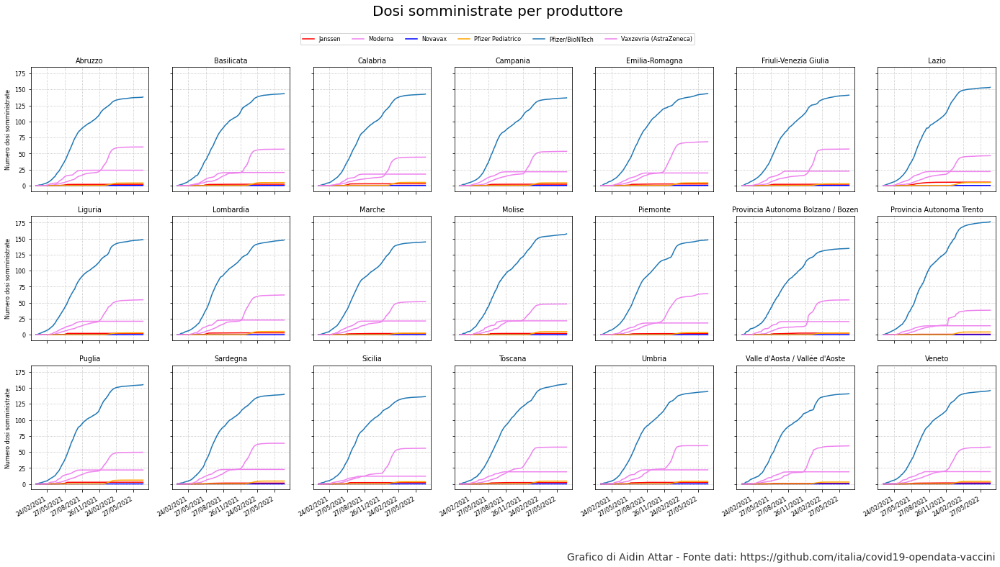

In [49]:
fig, ax = plt.subplots(nrows=3,ncols=7,figsize=(24,12), sharey=True, sharex=True)

colors=['red','violet','blue','orange','C0','violet','brown','black','plasma']
x=0
y=0
for key1 in somministrazioni_età.keys():
    i=0
    for key2 in sorted(somministrazioni_età[key1].keys()):
        ax[y,x].plot(somministrazioni_età[key1][key2].index,somministrazioni_età[key1][key2]['cumulativa_totale_per100'], color=colors[i])
        i+=1
    ax[y,x].set_title(str(key1))
    ax[y,x].grid(linestyle='dotted')
    x+=1
    if x==7:
        x=0
        y+=1
ax[0,0].xaxis.set_major_locator(mdates.MonthLocator(interval=3))

fig.suptitle("Dosi somministrate per produttore", fontsize=20)
plt.rcParams['font.size'] = '8'
ax[0,0].tick_params(axis='both', labelsize=8)
#ax.grid(alpha = 0.2,linestyle='dotted')
ax[0,0].set_ylabel('Numero dosi somministrate')
ax[1,0].set_ylabel('Numero dosi somministrate')
ax[2,0].set_ylabel('Numero dosi somministrate')
ax[0,0].set_xlabel("")
fig.autofmt_xdate()
labels = [key for key in sorted(somministrazioni_età['Emilia-Romagna'].keys())]
fig.legend(labels, loc='center',bbox_to_anchor=(.5,.925), ncol=len(labels), bbox_transform=fig.transFigure)

plt.text(0.9, 0.1, 'Grafico di Aidin Attar - Fonte dati: https://github.com/italia/covid19-opendata-vaccini',
         transform=plt.gcf().transFigure,
         fontsize=14, color='black', alpha=0.8,
         ha='right', va='top', rotation='0')

plt.show()

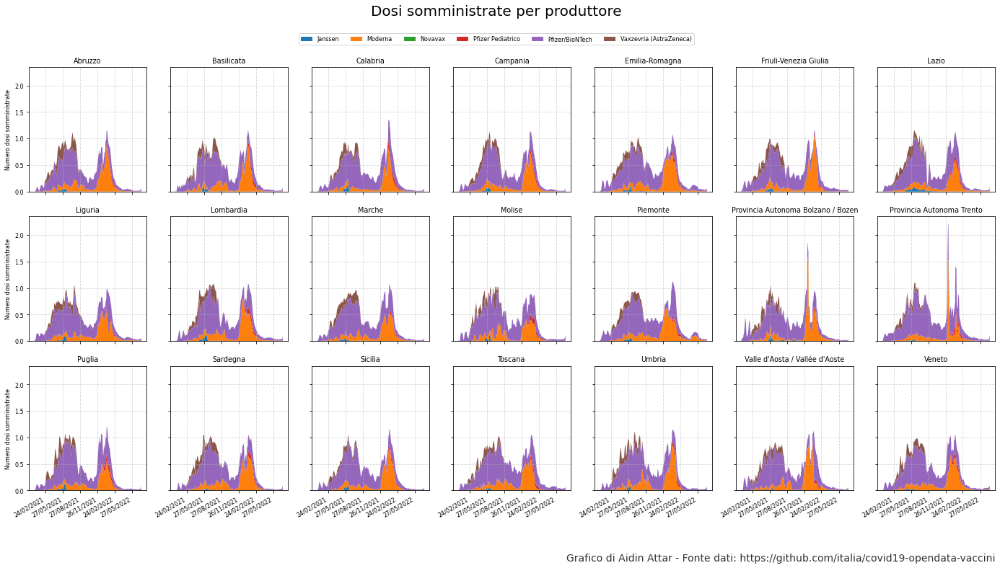

In [50]:
fig, ax = plt.subplots(nrows=3,ncols=7,figsize=(24,12), sharey=True, sharex=True)

colors=['red','violet','blue','orange','C0','violet','brown','black','plasma']
x=0
y=0
for key1 in somministrazioni_età.keys():
    ax[y,x].stackplot(somministrazioni_età[key1]['Pfizer/BioNTech'].index,[somministrazioni_età[key1][key]['media_totale_per100'] for key in sorted(somministrazioni_età[key1].keys())])
    ax[y,x].set_title(str(key1))
    ax[y,x].grid(linestyle='dotted')
    x+=1
    if x==7:
        x=0
        y+=1
ax[0,0].xaxis.set_major_locator(mdates.MonthLocator(interval=3))

fig.suptitle("Dosi somministrate per produttore", fontsize=20)
plt.rcParams['font.size'] = '8'
ax[0,0].tick_params(axis='both', labelsize=8)
#ax.grid(alpha = 0.2,linestyle='dotted')
ax[0,0].set_ylabel('Numero dosi somministrate')
ax[1,0].set_ylabel('Numero dosi somministrate')
ax[2,0].set_ylabel('Numero dosi somministrate')
ax[0,0].set_xlabel("")
labels = [key for key in sorted(somministrazioni_età['Emilia-Romagna'].keys())]
fig.legend(labels, loc='center',bbox_to_anchor=(.5,.925), ncol=len(labels), bbox_transform=fig.transFigure)

fig.autofmt_xdate()

plt.text(0.9, 0.1, 'Grafico di Aidin Attar - Fonte dati: https://github.com/italia/covid19-opendata-vaccini',
         transform=plt.gcf().transFigure,
         fontsize=14, color='black', alpha=0.8,
         ha='right', va='top', rotation='0')

plt.show()


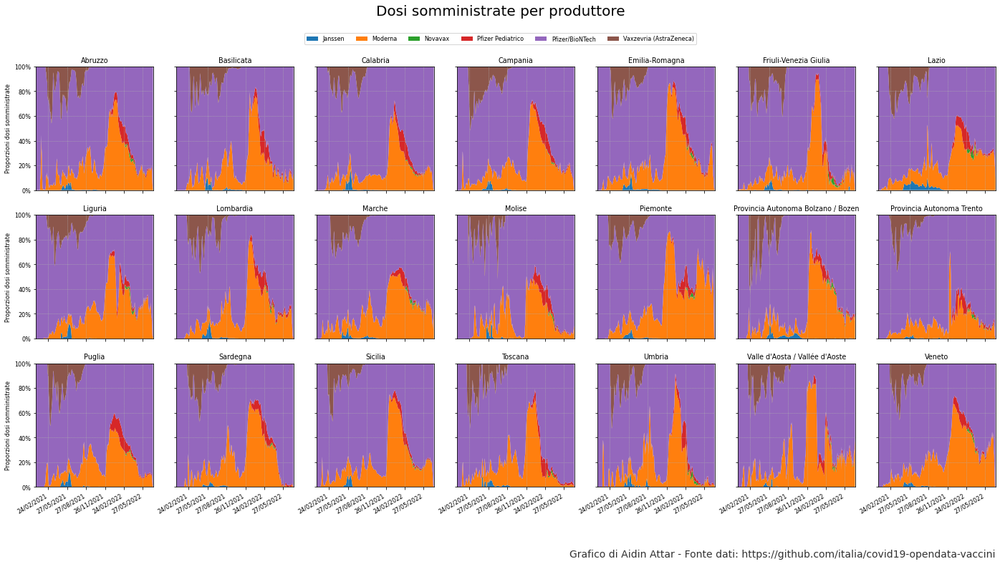

In [51]:
fig, ax = plt.subplots(nrows=3,ncols=7,figsize=(24,12), sharey=True, sharex=True)

colors=['red','violet','blue','orange','C0','violet','brown','black','plasma']
x=0
y=0
for key1 in somministrazioni_età.keys():
    ax[y,x].stackplot(somministrazioni_età[key1]['Pfizer/BioNTech'].index,[somministrazioni_età[key1][key]['media_totale_per100']*100/sum(somministrazioni_età[key1][key2]['media_totale_per100'] for key2 in somministrazioni_età[key1].keys()) for key in sorted(somministrazioni_età[key1].keys())])
    ax[y,x].set_title(str(key1))
    ax[y,x].grid(linestyle='dotted')
    x+=1
    if x==7:
        x=0
        y+=1
ax[0,0].xaxis.set_major_locator(mdates.MonthLocator(interval=3))

fig.suptitle("Dosi somministrate per produttore", fontsize=20)
plt.rcParams['font.size'] = '8'
ax[0,0].tick_params(axis='both', labelsize=8)
#ax.grid(alpha = 0.2,linestyle='dotted')
ax[0,0].set_ylabel('Proporzioni dosi somministrate')
ax[1,0].set_ylabel('Proporzioni dosi somministrate')
ax[2,0].set_ylabel('Proporzioni dosi somministrate')
ax[0,0].set_xlabel("")
ax[0,0].set_ylim(top=100)

ax[0,0].yaxis.set_major_formatter(mtick.PercentFormatter())
ax[0,0].set_xlim([date(2020, 12, 27).strftime('%d/%m/%Y'), yesterday.strftime('%d/%m/%Y')])
labels = [key for key in sorted(somministrazioni_età['Emilia-Romagna'].keys())]
fig.legend(labels, loc='center',bbox_to_anchor=(.5,.925), ncol=len(labels), bbox_transform=fig.transFigure)

fig.autofmt_xdate()

plt.text(0.9, 0.1, 'Grafico di Aidin Attar - Fonte dati: https://github.com/italia/covid19-opendata-vaccini',
         transform=plt.gcf().transFigure,
         fontsize=14, color='black', alpha=0.8,
         ha='right', va='top', rotation='0')

plt.show()

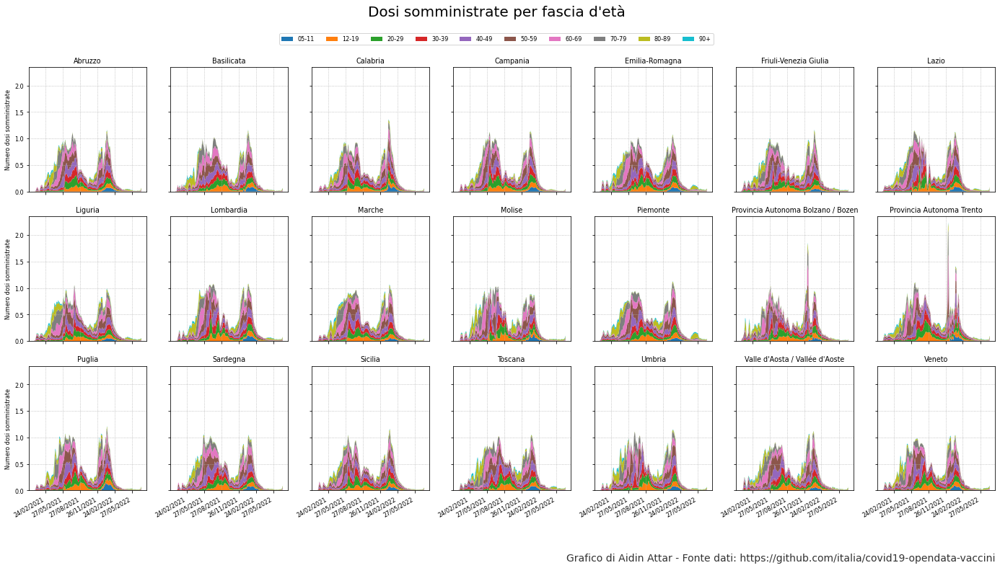

In [52]:
fig, ax = plt.subplots(nrows=3,ncols=7,figsize=(24,12), sharey=True, sharex=True)

colors=['red','violet','blue','orange','C0','violet','brown','black','plasma']
x=0
y=0
for key1 in somministrazioni_fornitori.keys():
    ax[y,x].stackplot(somministrazioni_fornitori[key1]['50-59'].index,[somministrazioni_fornitori[key1][key]['media_totale_per100'] for key in sorted(somministrazioni_fornitori[key1].keys())])
    ax[y,x].set_title(str(key1))
    ax[y,x].grid(linestyle='dotted')
    x+=1
    if x==7:
        x=0
        y+=1
ax[0,0].xaxis.set_major_locator(mdates.MonthLocator(interval=3))

fig.suptitle("Dosi somministrate per fascia d'età", fontsize=20)
plt.rcParams['font.size'] = '8'
ax[0,0].tick_params(axis='both', labelsize=8)
#ax.grid(alpha = 0.2,linestyle='dotted')
ax[0,0].set_ylabel('Numero dosi somministrate')
ax[1,0].set_ylabel('Numero dosi somministrate')
ax[2,0].set_ylabel('Numero dosi somministrate')
ax[0,0].set_xlabel("")

labels = [key for key in sorted(somministrazioni_fornitori['Emilia-Romagna'].keys())]
fig.legend(labels, loc='center',bbox_to_anchor=(.5,.925), ncol=len(labels), bbox_transform=fig.transFigure)

fig.autofmt_xdate()

plt.text(0.9, 0.1, 'Grafico di Aidin Attar - Fonte dati: https://github.com/italia/covid19-opendata-vaccini',
         transform=plt.gcf().transFigure,
         fontsize=14, color='black', alpha=0.8,
         ha='right', va='top', rotation='0')

plt.show()

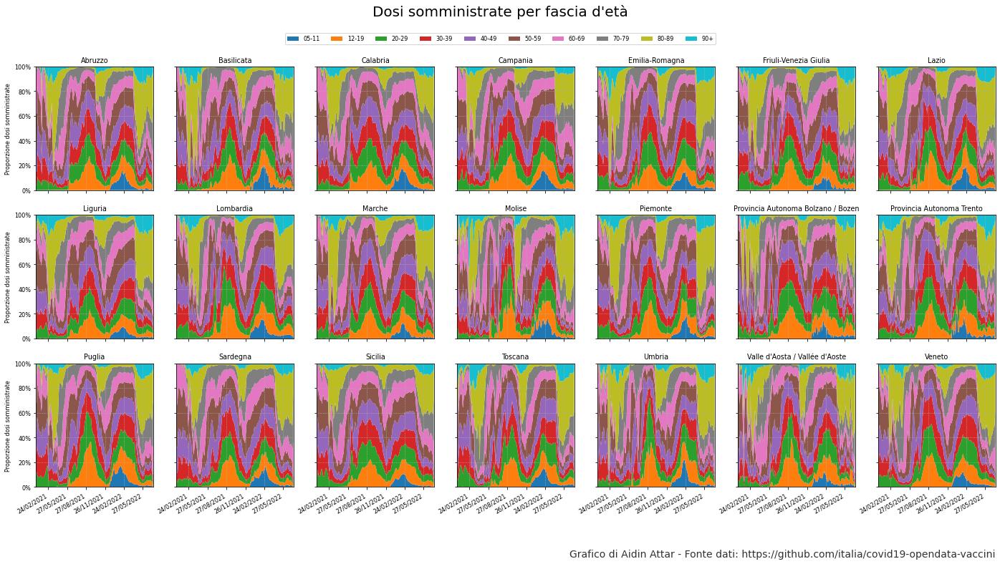

In [53]:
fig, ax = plt.subplots(nrows=3,ncols=7,figsize=(24,12), sharey=True, sharex=True)

colors=['red','violet','blue','orange','C0','violet','brown','black','plasma']
x=0
y=0
for key1 in somministrazioni_fornitori.keys():
    ax[y,x].stackplot(somministrazioni_fornitori[key1]['50-59'].index,[somministrazioni_fornitori[key1][key]['media_totale']*100/sum(somministrazioni_fornitori[key1][key2]['media_totale'] for key2 in somministrazioni_fornitori[key1].keys()) for key in sorted(somministrazioni_fornitori[key1].keys())])
    ax[y,x].set_title(str(key1))
    ax[y,x].grid(linestyle='dotted')
    x+=1
    if x==7:
        x=0
        y+=1
ax[0,0].xaxis.set_major_locator(mdates.MonthLocator(interval=3))

fig.suptitle("Dosi somministrate per fascia d'età", fontsize=20)
plt.rcParams['font.size'] = '8'
ax[0,0].tick_params(axis='both', labelsize=8)
#ax.grid(alpha = 0.2,linestyle='dotted')
ax[0,0].set_ylabel('Proporzione dosi somministrate')
ax[1,0].set_ylabel('Proporzione dosi somministrate')
ax[2,0].set_ylabel('Proporzione dosi somministrate')
ax[0,0].set_xlabel("")
ax[0,0].set_ylim(top=100)

ax[0,0].yaxis.set_major_formatter(mtick.PercentFormatter())
ax[0,0].set_xlim([date(2020, 12, 27).strftime('%d/%m/%Y'), yesterday.strftime('%d/%m/%Y')])

labels = [key for key in sorted(somministrazioni_fornitori['Emilia-Romagna'].keys())]
fig.legend(labels, loc='center',bbox_to_anchor=(.5,.925), ncol=len(labels), bbox_transform=fig.transFigure)

fig.autofmt_xdate()

plt.text(0.9, 0.1, 'Grafico di Aidin Attar - Fonte dati: https://github.com/italia/covid19-opendata-vaccini',
         transform=plt.gcf().transFigure,
         fontsize=14, color='black', alpha=0.8,
         ha='right', va='top', rotation='0')

plt.show()

In [54]:
PlateaRegioni = sorted(platea.reg.unique())
PopolazioneRegioni={elem1:{elem2: int for elem2 in PlateaFasce} for elem1 in PlateaRegioni}
for key1 in PopolazioneRegioni.keys():
    for key2 in PopolazioneRegioni[key1].keys():
        PopolazioneRegioni[key1][key2]=platea.groupby('reg').get_group(key1).groupby('eta').get_group(key2)['totale_popolazione'].values[0]

PopolazioneRegioni['Provincia Autonoma Bolzano / Bozen'] = PopolazioneRegioni[ 'P.A. Bolzano']
PopolazioneRegioni['Provincia Autonoma Trento'         ] = PopolazioneRegioni[ 'P.A. Trento' ]
PopolazioneRegioni["Valle d'Aosta / Vallée d'Aoste"    ] = PopolazioneRegioni["Valle d'Aosta"]
#for new_key, old_key in zip(NomiRegioni,PlateaRegioni):
#    PopolazioneRegioni[new_key] = PopolazioneRegioni.pop(old_key)

In [55]:
new_somministrazioni_fornitori = copy.deepcopy(somministrazioni_fornitori)

for key in somministrazioni_fornitori.keys():
    new_somministrazioni_fornitori[key]['80+'] = copy.deepcopy(somministrazioni_fornitori[key]['90+'])
    new_somministrazioni_fornitori[key]['80+']['totale'] = somministrazioni_fornitori[key]['80-89']['totale']+somministrazioni_fornitori[key]['90+']['totale']
    new_somministrazioni_fornitori[key]['80+'][     'm'] = somministrazioni_fornitori[key]['80-89'][     'm']+somministrazioni_fornitori[key]['90+'][     'm']
    new_somministrazioni_fornitori[key]['80+'][     'f'] = somministrazioni_fornitori[key]['80-89'][     'f']+somministrazioni_fornitori[key]['90+'][     'f']
    new_somministrazioni_fornitori[key]['80+'][    'd1'] = somministrazioni_fornitori[key]['80-89'][    'd1']+somministrazioni_fornitori[key]['90+'][    'd1']
    new_somministrazioni_fornitori[key]['80+'][    'd2'] = somministrazioni_fornitori[key]['80-89'][    'd2']+somministrazioni_fornitori[key]['90+'][    'd2']
    new_somministrazioni_fornitori[key]['80+'][   'dpi'] = somministrazioni_fornitori[key]['80-89'][   'dpi']+somministrazioni_fornitori[key]['90+'][   'dpi']
    new_somministrazioni_fornitori[key]['80+'][   'db1'] = somministrazioni_fornitori[key]['80-89'][   'db1']+somministrazioni_fornitori[key]['90+'][   'db1']
    new_somministrazioni_fornitori[key]['80+'][   'dbi'] = somministrazioni_fornitori[key]['80-89'][   'dbi']+somministrazioni_fornitori[key]['90+'][   'dbi']
    new_somministrazioni_fornitori[key]['80+'][   'db2'] = somministrazioni_fornitori[key]['80-89'][   'db2']+somministrazioni_fornitori[key]['90+'][   'db2']

    new_somministrazioni_fornitori[key]['80+']['eta']='80+'
    new_somministrazioni_fornitori[key].pop('80-89')
    new_somministrazioni_fornitori[key].pop('90+')

for key in new_somministrazioni_fornitori.keys():
    for key1 in new_somministrazioni_fornitori[key].keys():
        new_somministrazioni_fornitori[key][key1]['media_totale'] = new_somministrazioni_fornitori[key][key1]['totale'].rolling(window=7, min_periods=1).mean()
        new_somministrazioni_fornitori[key][key1][     'media_m'] = new_somministrazioni_fornitori[key][key1][     'm'].rolling(window=7, min_periods=1).mean()
        new_somministrazioni_fornitori[key][key1][     'media_f'] = new_somministrazioni_fornitori[key][key1][     'f'].rolling(window=7, min_periods=1).mean()
        new_somministrazioni_fornitori[key][key1][    'media_d1'] = new_somministrazioni_fornitori[key][key1][    'd1'].rolling(window=7, min_periods=1).mean()
        new_somministrazioni_fornitori[key][key1][    'media_d2'] = new_somministrazioni_fornitori[key][key1][    'd2'].rolling(window=7, min_periods=1).mean()
        new_somministrazioni_fornitori[key][key1][   'media_dpi'] = new_somministrazioni_fornitori[key][key1][   'dpi'].rolling(window=7, min_periods=1).mean()
        new_somministrazioni_fornitori[key][key1][   'media_db1'] = new_somministrazioni_fornitori[key][key1][   'db1'].rolling(window=7, min_periods=1).mean()
        new_somministrazioni_fornitori[key][key1][   'media_dbi'] = new_somministrazioni_fornitori[key][key1][   'dbi'].rolling(window=7, min_periods=1).mean()
        new_somministrazioni_fornitori[key][key1][   'media_db2'] = new_somministrazioni_fornitori[key][key1][   'db2'].rolling(window=7, min_periods=1).mean()

        new_somministrazioni_fornitori[key][key1]['cumulativa_totale'] = new_somministrazioni_fornitori[key][key1]['totale'].cumsum()
        new_somministrazioni_fornitori[key][key1][     'cumulativa_m'] = new_somministrazioni_fornitori[key][key1][     'm'].cumsum()
        new_somministrazioni_fornitori[key][key1][     'cumulativa_f'] = new_somministrazioni_fornitori[key][key1][     'f'].cumsum()
        new_somministrazioni_fornitori[key][key1][    'cumulativa_d1'] = new_somministrazioni_fornitori[key][key1][    'd1'].cumsum()
        new_somministrazioni_fornitori[key][key1][    'cumulativa_d2'] = new_somministrazioni_fornitori[key][key1][    'd2'].cumsum()
        new_somministrazioni_fornitori[key][key1][   'cumulativa_dpi'] = new_somministrazioni_fornitori[key][key1][   'dpi'].cumsum()
        new_somministrazioni_fornitori[key][key1][   'cumulativa_db1'] = new_somministrazioni_fornitori[key][key1][   'db1'].cumsum()
        new_somministrazioni_fornitori[key][key1][   'cumulativa_dbi'] = new_somministrazioni_fornitori[key][key1][   'dbi'].cumsum()
        new_somministrazioni_fornitori[key][key1][   'cumulativa_db2'] = new_somministrazioni_fornitori[key][key1][   'db2'].cumsum()

        new_somministrazioni_fornitori[key][key1]['perc_cumulativa_totale'] = new_somministrazioni_fornitori[key][key1]['cumulativa_totale'] / PopolazioneRegioni[key][key1] * 100
        new_somministrazioni_fornitori[key][key1][     'perc_cumulativa_m'] = new_somministrazioni_fornitori[key][key1][     'cumulativa_m'] / PopolazioneRegioni[key][key1] * 100
        new_somministrazioni_fornitori[key][key1][     'perc_cumulativa_f'] = new_somministrazioni_fornitori[key][key1][     'cumulativa_f'] / PopolazioneRegioni[key][key1] * 100
        new_somministrazioni_fornitori[key][key1][    'perc_cumulativa_d1'] = new_somministrazioni_fornitori[key][key1][    'cumulativa_d1'] / PopolazioneRegioni[key][key1] * 100
        new_somministrazioni_fornitori[key][key1][    'perc_cumulativa_d2'] = new_somministrazioni_fornitori[key][key1][    'cumulativa_d2'] / PopolazioneRegioni[key][key1] * 100
        new_somministrazioni_fornitori[key][key1][   'perc_cumulativa_dpi'] = new_somministrazioni_fornitori[key][key1][   'cumulativa_dpi'] / PopolazioneRegioni[key][key1] * 100
        new_somministrazioni_fornitori[key][key1][   'perc_cumulativa_db1'] = new_somministrazioni_fornitori[key][key1][   'cumulativa_db1'] / PopolazioneRegioni[key][key1] * 100
        new_somministrazioni_fornitori[key][key1][   'perc_cumulativa_dbi'] = new_somministrazioni_fornitori[key][key1][   'cumulativa_dbi'] / PopolazioneRegioni[key][key1] * 100
        new_somministrazioni_fornitori[key][key1][   'perc_cumulativa_db2'] = new_somministrazioni_fornitori[key][key1][   'cumulativa_db2'] / PopolazioneRegioni[key][key1] * 100

        new_somministrazioni_fornitori[key][key1]['rimasti_cumulativa totale'] = (PopolazioneRegioni[key][key1] - new_somministrazioni_fornitori[key][key1]['cumulativa_totale']) / DictRegioni[key] * 100
        new_somministrazioni_fornitori[key][key1][     'rimasti_cumulativa m'] = (PopolazioneRegioni[key][key1] - new_somministrazioni_fornitori[key][key1][     'cumulativa_m']) / DictRegioni[key] * 100
        new_somministrazioni_fornitori[key][key1][     'rimasti_cumulativa f'] = (PopolazioneRegioni[key][key1] - new_somministrazioni_fornitori[key][key1][     'cumulativa_f']) / DictRegioni[key] * 100
        new_somministrazioni_fornitori[key][key1][    'rimasti_cumulativa d1'] = (PopolazioneRegioni[key][key1] - new_somministrazioni_fornitori[key][key1][    'cumulativa_d1']) / DictRegioni[key] * 100
        new_somministrazioni_fornitori[key][key1][    'rimasti_cumulativa d2'] = (PopolazioneRegioni[key][key1] - new_somministrazioni_fornitori[key][key1][    'cumulativa_d2']) / DictRegioni[key] * 100
        new_somministrazioni_fornitori[key][key1][   'rimasti_cumulativa dpi'] = (PopolazioneRegioni[key][key1] - new_somministrazioni_fornitori[key][key1][   'cumulativa_dpi']) / DictRegioni[key] * 100
        new_somministrazioni_fornitori[key][key1][   'rimasti_cumulativa db1'] = (PopolazioneRegioni[key][key1] - new_somministrazioni_fornitori[key][key1][   'cumulativa_db1']) / DictRegioni[key] * 100
        new_somministrazioni_fornitori[key][key1][   'rimasti_cumulativa dbi'] = (PopolazioneRegioni[key][key1] - new_somministrazioni_fornitori[key][key1][   'cumulativa_dbi']) / DictRegioni[key] * 100
        new_somministrazioni_fornitori[key][key1][   'rimasti_cumulativa db2'] = (PopolazioneRegioni[key][key1] - new_somministrazioni_fornitori[key][key1][   'cumulativa_db2']) / DictRegioni[key] * 100

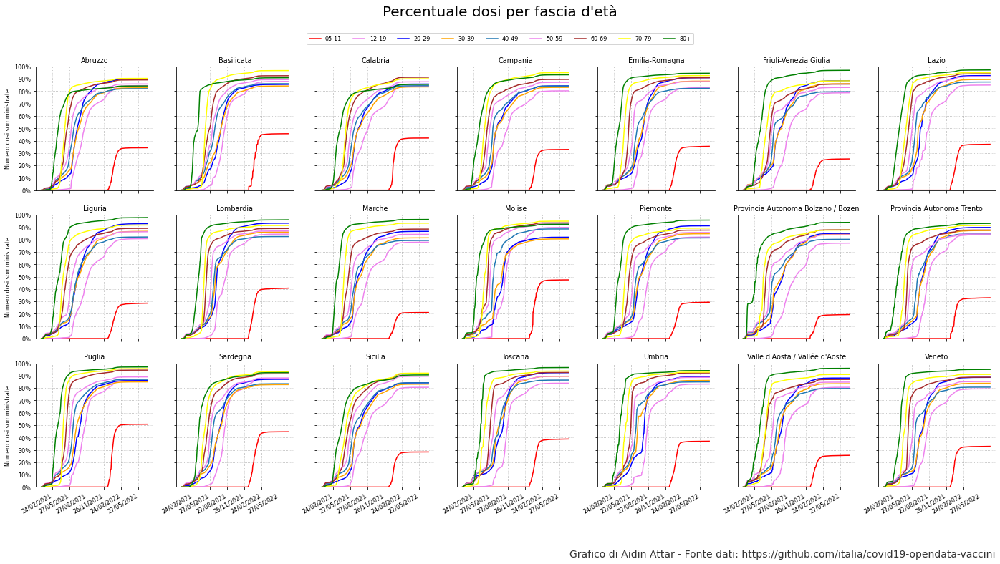

In [56]:
fig, ax = plt.subplots(nrows=3,ncols=7,figsize=(24,12), sharex=True, sharey=True)

colors=['red','violet','blue','orange','C0','violet','brown','yellow','green','black','purple']
x=0
y=0
for key1 in new_somministrazioni_fornitori.keys():
    i=0
    for key2 in sorted(new_somministrazioni_fornitori[key1].keys()):
        ax[y,x].plot(new_somministrazioni_fornitori[key1][key2].index,new_somministrazioni_fornitori[key1][key2]['perc_cumulativa_d1'], color=colors[i])
        i+=1
    ax[y,x].set_title(str(key1))
    ax[y,x].grid(linestyle='dotted')
    ax[y,x].spines['right'].set_visible(False)
    ax[y,x].spines['top'].set_visible(False)
    x+=1
    if x==7:
        x=0
        y+=1
ax[0,0].xaxis.set_major_locator(mdates.MonthLocator(interval=3))
ax[0,0].yaxis.set_major_locator(MultipleLocator(10))
ax[0,0].set_ylim(bottom=0,top=100)
fig.suptitle("Percentuale dosi per fascia d'età", fontsize=20)
plt.rcParams['font.size'] = '8'
ax[0,0].tick_params(axis='both', labelsize=8)
#ax.grid(alpha = 0.2,linestyle='dotted')
ax[0,0].set_ylabel('Numero dosi somministrate')
ax[1,0].set_ylabel('Numero dosi somministrate')
ax[2,0].set_ylabel('Numero dosi somministrate')
ax[0,0].set_xlabel("")
fig.autofmt_xdate()

ax[0,0].yaxis.set_major_formatter(mtick.PercentFormatter())
labels = [key for key in sorted(new_somministrazioni_fornitori['Emilia-Romagna'].keys())]
fig.legend(labels, loc='center',bbox_to_anchor=(.5,.925), ncol=len(labels), bbox_transform=fig.transFigure)

plt.text(0.9, 0.1, 'Grafico di Aidin Attar - Fonte dati: https://github.com/italia/covid19-opendata-vaccini',
         transform=plt.gcf().transFigure,
         fontsize=14, color='black', alpha=0.8,
         ha='right', va='top', rotation='0')

plt.show()

In [57]:
PercetualiPrimaDose          = [new_italia_fornitori[key][ 'perc_cumulativa_d1'].iloc[-1] for key in sorted(new_italia_fornitori.keys())]
PercetualiSecondaDose        = [new_italia_fornitori[key][ 'perc_cumulativa_d2'].iloc[-1] for key in sorted(new_italia_fornitori.keys())]
PercetualiTerzaDose          = [new_italia_fornitori[key]['perc_cumulativa_db1'].iloc[-1] for key in sorted(new_italia_fornitori.keys())]
PercetualiPregressaInfezione = [new_italia_fornitori[key]['perc_cumulativa_dpi'].iloc[-1] for key in sorted(new_italia_fornitori.keys())]
PercetualiQuartaDose         = [new_italia_fornitori[key]['perc_cumulativa_db2'].iloc[-1] for key in sorted(new_italia_fornitori.keys())]
PercetualiBoosterImmune      = [new_italia_fornitori[key]['perc_cumulativa_dbi'].iloc[-1] for key in sorted(new_italia_fornitori.keys())]

PercentualiOggi = pd.DataFrame({'d1': PercetualiPrimaDose,
                                'd2': PercetualiSecondaDose,
                                'db1': PercetualiTerzaDose,
                                'db2': PercetualiQuartaDose,
                                'dpi': PercetualiPregressaInfezione,
                                'dbi': PercetualiBoosterImmune},
                               index=sorted(new_italia_fornitori.keys()))
PercentualiOggi

,d1,d2,db1,db2,dpi,dbi
05-11,35.907309,32.592191,0.000000,0.000000,2.377800,0.000000
12-19,82.772842,79.138075,45.961922,0.000152,3.761899,0.007164
20-29,89.124340,85.077868,66.955476,0.001722,4.159413,0.032250
30-39,85.470716,81.660813,64.489994,0.003538,3.748040,0.056142
40-49,83.595988,79.931015,68.317107,0.006480,3.721958,0.110542
50-59,87.653685,82.583015,78.706051,0.018359,3.909274,0.249303
60-69,90.509012,83.829982,85.189655,0.844032,3.304642,1.523065
70-79,92.446029,89.123026,88.324329,1.921224,2.768820,2.905230
80+,94.670164,93.047080,88.066658,22.327998,2.218806,2.140144


In [58]:
PercentualiRegioni = {}
for key in NomiRegioni:
    PercetualiPrimaDose          = [new_somministrazioni_fornitori[key][key1][ 'perc_cumulativa_d1'].iloc[-1] for key1 in sorted(new_somministrazioni_fornitori[key].keys())]
    PercetualiSecondaDose        = [new_somministrazioni_fornitori[key][key1][ 'perc_cumulativa_d2'].iloc[-1] for key1 in sorted(new_somministrazioni_fornitori[key].keys())]
    PercetualiTerzaDose          = [new_somministrazioni_fornitori[key][key1]['perc_cumulativa_db1'].iloc[-1] for key1 in sorted(new_somministrazioni_fornitori[key].keys())]
    PercetualiPregressaInfezione = [new_somministrazioni_fornitori[key][key1]['perc_cumulativa_dpi'].iloc[-1] for key1 in sorted(new_somministrazioni_fornitori[key].keys())]
    PercetualiQuartaDose         = [new_somministrazioni_fornitori[key][key1]['perc_cumulativa_db2'].iloc[-1] for key1 in sorted(new_somministrazioni_fornitori[key].keys())]
    PercetualiBoosterImmune      = [new_somministrazioni_fornitori[key][key1]['perc_cumulativa_dbi'].iloc[-1] for key1 in sorted(new_somministrazioni_fornitori[key].keys())]

    PercentualiRegioni[key] = pd.DataFrame({'d1' : PercetualiPrimaDose,
                                            'd2' : PercetualiSecondaDose,
                                            'db1': PercetualiTerzaDose,
                                            'db2': PercetualiQuartaDose,
                                            'dpi': PercetualiPregressaInfezione,
                                            'dbi': PercetualiBoosterImmune},
                                           index=sorted(new_somministrazioni_fornitori[key].keys()))

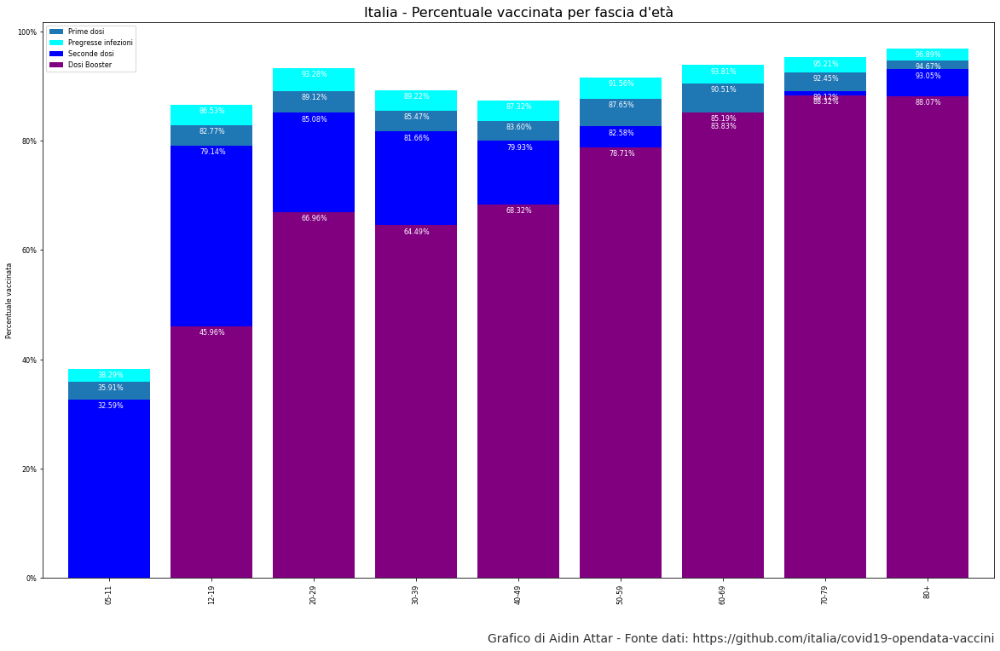

In [59]:
fig, ax = plt.subplots(figsize=(20,12))

labels=['Prime dosi', 'Pregresse infezioni', 'Seconde dosi', 'Dosi Booster']
PercentualiOggi[['d1','dpi']].plot.bar(ax=ax, stacked=True, color = ['C0', 'cyan'],width=.8)
PercentualiOggi['d2'].plot.bar(ax=ax, stacked=True, color='blue',width=0.8)
PercentualiOggi['db1'].plot.bar(ax=ax, stacked=True, color='purple',width=.8)
ax.legend(labels, loc='best')
ax.set_ylabel('Percentuale vaccinata')
ax.set_title("Italia - Percentuale vaccinata per fascia d'età", fontsize=16)
#ax.grid(linestyle='dotted')

ax.yaxis.set_major_formatter(mtick.PercentFormatter())
for index,data in enumerate(PercentualiOggi['d2']):
    if data != 0:
        plt.text(x=index-0.12 , y =data-1.5 , s=str("{:.2%}".format(data/100)), color = 'w',fontdict=dict(fontsize=8))

for index,data in enumerate(PercentualiOggi['d1']):
    if data != 0:
        plt.text(x=index-0.12 , y =data-1.5 , s=str("{:.2%}".format(data/100)), color = 'w',fontdict=dict(fontsize=8))

for index,data in enumerate(PercentualiOggi['db1']):
    if data != 0:
        plt.text(x=index-0.12 , y =data-1.5 , s=str("{:.2%}".format(data/100)), color = 'w',fontdict=dict(fontsize=8))

for index,data in enumerate(PercentualiOggi['d1']+PercentualiOggi['dpi']):
    if data != 0:
        plt.text(x=index-0.12 , y =data-1.5 , s=str("{:.2%}".format(data/100)), color = 'w',fontdict=dict(fontsize=8))

plt.text(0.9, 0.05, 'Grafico di Aidin Attar - Fonte dati: https://github.com/italia/covid19-opendata-vaccini',
         transform=plt.gcf().transFigure,
         fontsize=14, color='black', alpha=0.8,
         ha='right', va='top', rotation='0')

plt.show()

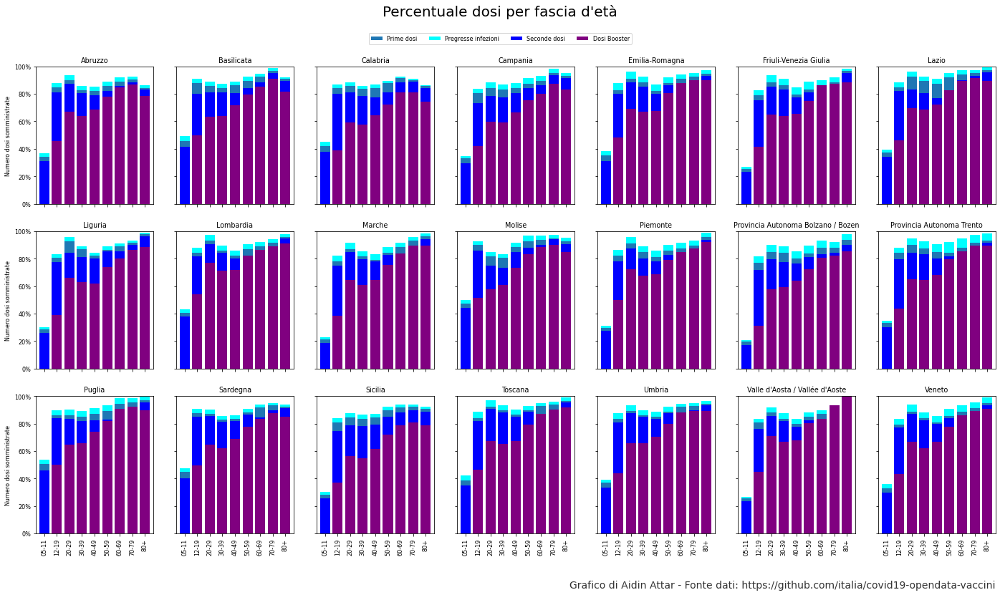

In [60]:
fig, ax = plt.subplots(nrows=3,ncols=7,figsize=(24,12), sharex=True,sharey=True)

colors=['red','violet','blue','orange','C0','violet','brown','yellow','green','black','purple']
x=0
y=0
for key1 in new_somministrazioni_fornitori.keys():
    PercentualiRegioni[key1][['d1','dpi']].plot.bar(ax=ax[y,x], stacked=True, color = ['C0', 'cyan'],width=.8, legend=False)
    PercentualiRegioni[key1]['d2'].plot.bar(ax=ax[y,x], stacked=True, color='blue',width=0.8)
    PercentualiRegioni[key1]['db1'].plot.bar(ax=ax[y,x], stacked=True, color='purple',width=.8)
    ax[y,x].set_title(str(key1))
    x+=1
    if x==7:
        x=0
        y+=1
ax[0,0].set_ylim(top=100)
fig.suptitle("Percentuale dosi per fascia d'età", fontsize=20)
plt.rcParams['font.size'] = '8'
ax[0,0].tick_params(axis='both', labelsize=8)
#ax.grid(alpha = 0.2,linestyle='dotted')
ax[0,0].set_ylabel('Numero dosi somministrate')
ax[1,0].set_ylabel('Numero dosi somministrate')
ax[2,0].set_ylabel('Numero dosi somministrate')

ax[0,0].yaxis.set_major_formatter(mtick.PercentFormatter())
labels=['Prime dosi', 'Pregresse infezioni', 'Seconde dosi', 'Dosi Booster']
fig.legend(labels, loc='center',bbox_to_anchor=(.5,.925), ncol=len(labels), bbox_transform=fig.transFigure)

plt.text(0.9, 0.05, 'Grafico di Aidin Attar - Fonte dati: https://github.com/italia/covid19-opendata-vaccini',
         transform=plt.gcf().transFigure,
         fontsize=14, color='black', alpha=0.8,
         ha='right', va='top', rotation='0')

plt.show()

In [61]:
idx = pd.date_range('27/12/2020', yesterday)
NomiFornitori=cons.forn.unique()
consegne_fornitori={elem1:{elem2:pd.DataFrame for elem2 in NomiFornitori} for elem1 in NomiRegioni}

for key1 in consegne_fornitori.keys():
    for key2 in consegne_fornitori[key1].keys():
        consegne_fornitori[key1][key2]                          = cons[:][cons.reg==key1][cons.forn==key2]
        consegne_fornitori[key1][key2]['data_consegna']         = pd.to_datetime(consegne_fornitori[key1][key2]['data_consegna'], format='%Y-%m-%d', yearfirst=True)
        consegne_fornitori[key1][key2]                          = consegne_fornitori[key1][key2].set_index('data_consegna')
        consegne_fornitori[key1][key2].index                    = pd.DatetimeIndex(consegne_fornitori[key1][key2].index)
        consegne_fornitori[key1][key2].sort_index(inplace=True)
        consegne_fornitori[key1][key2]                          = consegne_fornitori[key1][key2].reindex(idx)
        consegne_fornitori[key1][key2].index                    = consegne_fornitori[key1][key2].index.strftime('%d/%m/%Y')
        consegne_fornitori[key1][key2].area.fillna(method='bfill',inplace=True)
        consegne_fornitori[key1][key2].N1.fillna(method='bfill',inplace=True)
        consegne_fornitori[key1][key2].N2.fillna(method='bfill',inplace=True)
        consegne_fornitori[key1][key2].ISTAT.fillna(method='bfill',inplace=True)
        consegne_fornitori[key1][key2].reg.fillna(key1,inplace=True)
        consegne_fornitori[key1][key2].forn.fillna(key2,inplace=True)
        consegne_fornitori[key1][key2].fillna(0,inplace=True)
        consegne_fornitori[key1][key2]['numero_dosi_per100']     = consegne_fornitori[key1][key2]['numero_dosi'] / DictRegioni[key1] * 100
        consegne_fornitori[key1][key2]['cumulativa_numero_dosi'] = consegne_fornitori[key1][key2]['numero_dosi'].cumsum()
        consegne_fornitori[key1][key2]['cumulativa_numero_dosi_per100']     = consegne_fornitori[key1][key2]['cumulativa_numero_dosi'] / DictRegioni[key1] * 100

consegne_italia_fornitori = copy.deepcopy(consegne_fornitori['Emilia-Romagna'])

for key1 in consegne_italia_fornitori.keys():
    consegne_italia_fornitori[key1][           'numero_dosi'] = sum(consegne_fornitori[key][key1]['numero_dosi'].fillna(0) for key in consegne_fornitori.keys())
    consegne_italia_fornitori[key1][     'media_numero_dosi'] = consegne_italia_fornitori[key1]['numero_dosi'].rolling(window=7, min_periods=1).mean()
    consegne_italia_fornitori[key1]['cumulativa_numero_dosi'] = consegne_italia_fornitori[key1]['numero_dosi'].cumsum()

for key1 in consegne_italia_fornitori.keys():
    consegne_italia_fornitori[key1].drop(columns=['N1','N2','ISTAT'], axis=1, inplace = True)
    consegne_italia_fornitori[key1][     'area'] =    'ITA'
    consegne_italia_fornitori[key1]['reg'] = 'italia'

/home/aidin/anaconda3/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3397: UserWarning: Parsing '27/12/2020' in DD/MM/YYYY format. Provide format or specify infer_datetime_format=True for consistent parsing.
  exec(code_obj, self.user_global_ns, self.user_ns)
/tmp/ipykernel_64321/3758777977.py:7: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  consegne_fornitori[key1][key2]                          = cons[:][cons.reg==key1][cons.forn==key2]
/tmp/ipykernel_64321/3758777977.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  consegne_fornitori[key1][key2]['data_consegna']         = pd.to_datetime(consegne_fornitori[key1][key2]['data_consegna'], format='%Y-%m-%d', yearfirst=True)
/tmp/ipykernel_64321/37587

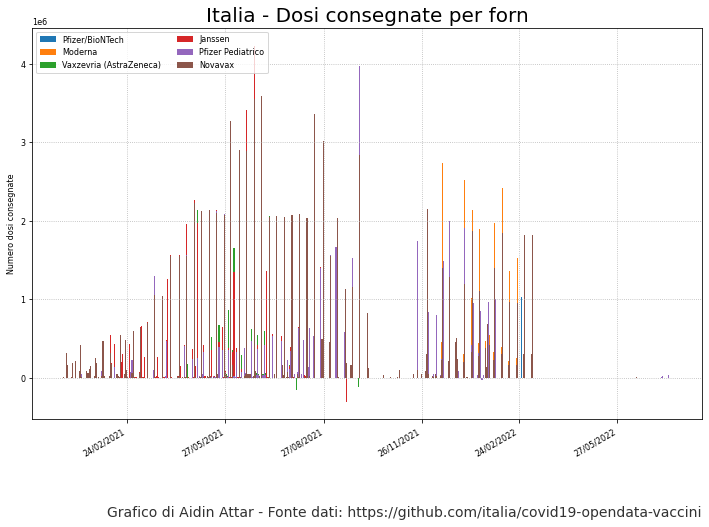

In [62]:
fig, ax = plt.subplots(figsize=(12,8))
colors=['red','violet','blue','orange','C0','violet','brown','yellow','green','black','purple']
i = len(consegne_italia_fornitori.keys())
for key in consegne_italia_fornitori.keys():
    ax.bar(consegne_italia_fornitori[key].index,sum(consegne_italia_fornitori[key1]['numero_dosi'] for key1 in list(consegne_italia_fornitori.keys())[:i]), width=1)
    i-=1

ax.xaxis.set_major_locator(mdates.MonthLocator(interval=3))
labels = [key for key in consegne_italia_fornitori.keys()]
ax.legend(labels, loc='upper left', ncol=2)
ax.set_title("Italia - Dosi consegnate per forn", fontsize=20)
plt.rcParams['font.size'] = '8'
ax.tick_params(axis='both', labelsize=8)
ax.grid(alpha = 1,linestyle='dotted')
ax.set_ylabel('Numero dosi consegnate')
ax.set_xlabel("")
fig.autofmt_xdate()

plt.text(0.9, 0.05, 'Grafico di Aidin Attar - Fonte dati: https://github.com/italia/covid19-opendata-vaccini',
         transform=plt.gcf().transFigure,
         fontsize=14, color='black', alpha=0.8,
         ha='right', va='top', rotation='0')

plt.show()

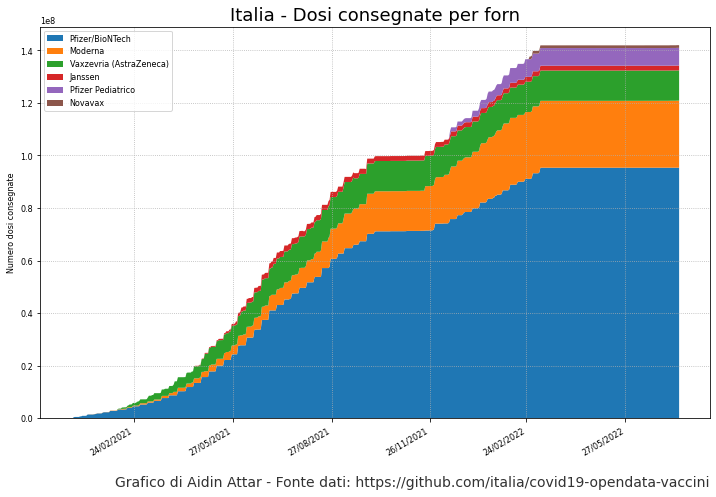

In [63]:
fig, ax = plt.subplots(figsize=(12,8))

colors=['red','violet','blue','orange','C0','violet','brown','yellow','green','black','purple']
ax.stackplot(consegne_italia_fornitori['Pfizer/BioNTech'].index,[consegne_italia_fornitori[key]['cumulativa_numero_dosi'] for key in consegne_italia_fornitori.keys()])

ax.xaxis.set_major_locator(mdates.MonthLocator(interval=3))
labels = [key for key in consegne_italia_fornitori.keys()]
ax.legend(labels, loc='upper left', ncol=1)
ax.set_title("Italia - Dosi consegnate per forn", fontsize=18)
plt.rcParams['font.size'] = '8'
ax.tick_params(axis='both', labelsize=8)
ax.grid(alpha = 1,linestyle='dotted')
ax.set_ylabel('Numero dosi consegnate')
ax.set_xlabel("")
fig.autofmt_xdate()

plt.text(0.9, 0.1, 'Grafico di Aidin Attar - Fonte dati: https://github.com/italia/covid19-opendata-vaccini',
         transform=plt.gcf().transFigure,
         fontsize=14, color='black', alpha=0.8,
         ha='right', va='top', rotation='0')

plt.show()

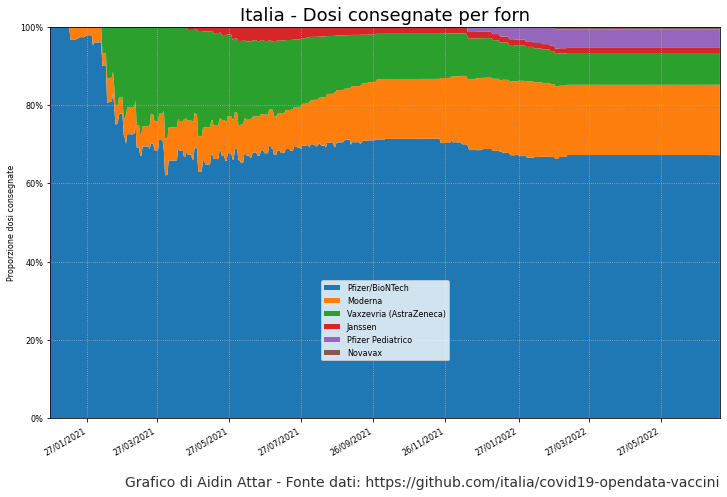

In [64]:
fig, ax = plt.subplots(figsize=(12,8))

colors=['red','violet','blue','orange','C0','violet','brown','yellow','green','black','purple']
ax.stackplot(consegne_italia_fornitori['Pfizer/BioNTech'].index,[consegne_italia_fornitori[key]['cumulativa_numero_dosi']*100/sum(consegne_italia_fornitori[key1]['cumulativa_numero_dosi'] for key1 in consegne_italia_fornitori.keys()) for key in consegne_italia_fornitori.keys()])

ax.xaxis.set_major_locator(mdates.MonthLocator(interval=2))
ax.set_title("Italia - Dosi consegnate per forn", fontsize=18)
plt.rcParams['font.size'] = '8'
ax.tick_params(axis='both', labelsize=8)
ax.grid(alpha = 1,linestyle='dotted')
ax.set_ylabel('Proporzione dosi consegnate')
ax.set_xlabel("")
fig.autofmt_xdate()
ax.set_ylim(top=100)
ax.set_xlim([date(2020, 12, 27).strftime('%d/%m/%Y'), yesterday.strftime('%d/%m/%Y')])
label = [key for key in consegne_italia_fornitori.keys()]
ax.legend(label, loc = 'center', bbox_to_anchor=(.5, .25))
ax.yaxis.set_major_formatter(mtick.PercentFormatter())

plt.text(0.9, 0.1, 'Grafico di Aidin Attar - Fonte dati: https://github.com/italia/covid19-opendata-vaccini',
         transform=plt.gcf().transFigure,
         fontsize=14, color='black', alpha=0.8,
         ha='right', va='top', rotation='0')

plt.show()

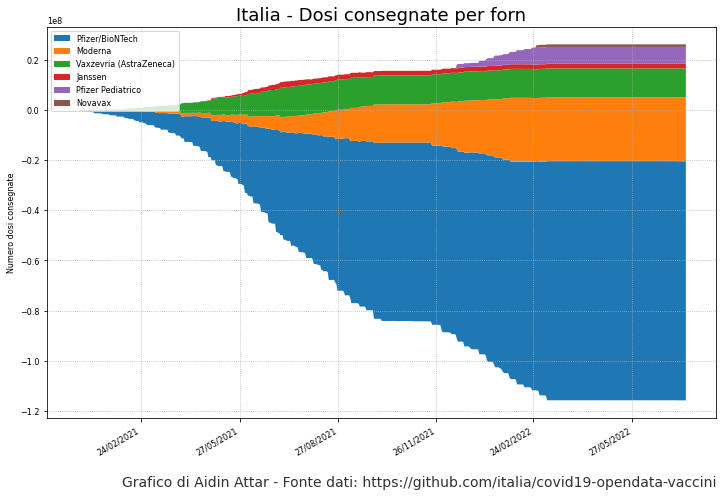

In [65]:
fig, ax = plt.subplots(figsize=(12,8))

colors=['red','violet','blue','orange','C0','violet','brown','yellow','green','black','purple']
ax.stackplot(consegne_italia_fornitori['Pfizer/BioNTech'].index,[consegne_italia_fornitori[key]['cumulativa_numero_dosi'] for key in consegne_italia_fornitori.keys()],
             baseline ='wiggle')

ax.xaxis.set_major_locator(mdates.MonthLocator(interval=3))
labels = [key for key in consegne_italia_fornitori.keys()]
ax.legend(labels, loc='upper left', ncol=1)
ax.set_title("Italia - Dosi consegnate per forn", fontsize=18)
plt.rcParams['font.size'] = '8'
ax.tick_params(axis='both', labelsize=8)
ax.grid(alpha = 1,linestyle='dotted')
ax.set_ylabel('Numero dosi consegnate')
ax.set_xlabel("")
fig.autofmt_xdate()

plt.text(0.9, 0.1, 'Grafico di Aidin Attar - Fonte dati: https://github.com/italia/covid19-opendata-vaccini',
         transform=plt.gcf().transFigure,
         fontsize=14, color='black', alpha=0.8,
         ha='right', va='top', rotation='0')

plt.show()

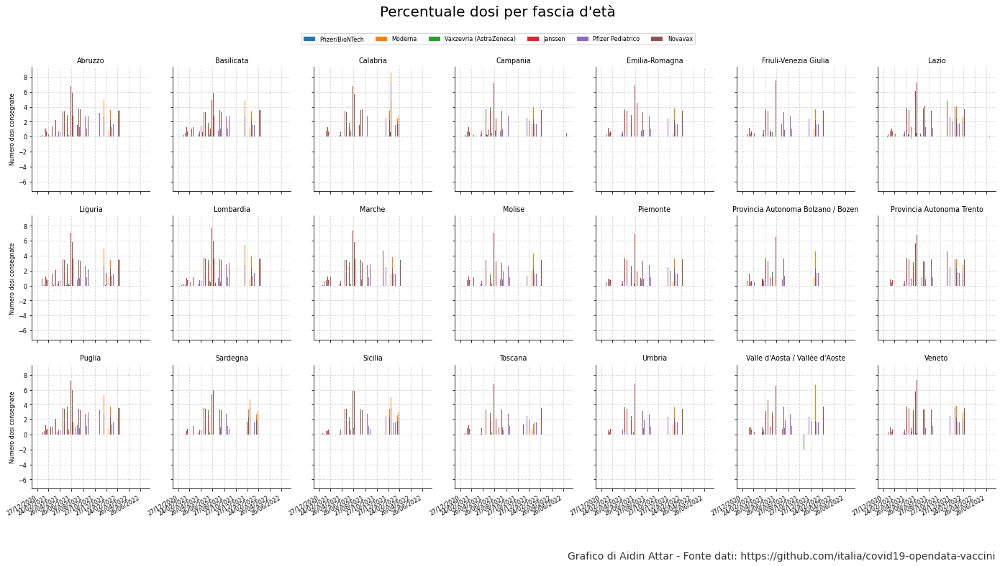

In [66]:
fig, ax = plt.subplots(nrows=3,ncols=7,figsize=(24,12), sharex=True, sharey=True)

colors=['red','violet','blue','orange','C0','violet','brown','yellow','green','black','purple']
x=0
y=0
for key1 in consegne_fornitori.keys():
    i = len(consegne_fornitori[key1].keys())
    for key2 in consegne_fornitori[key1].keys():
        ax[y,x].bar(consegne_fornitori[key1][key2].index,sum(consegne_fornitori[key1][key3]['numero_dosi_per100'] for key3 in list(consegne_fornitori[key1].keys())[:i]), width=1)
        i-=1
    ax[y,x].set_title(str(key1))
    ax[y,x].grid(linestyle='dotted')
    ax[y,x].spines['right'].set_visible(False)
    ax[y,x].spines['top'].set_visible(False)
    x+=1
    if x==7:
        x=0
        y+=1
ax[0,0].xaxis.set_major_locator(mdates.MonthLocator(interval=2))
#ax[0,0].yaxis.set_major_locator(MultipleLocator(10))
#ax[0,0].set_ylim(top=100)
fig.suptitle("Percentuale dosi per fascia d'età", fontsize=20)
plt.rcParams['font.size'] = '8'
ax[0,0].tick_params(axis='both', labelsize=8)
#ax.grid(alpha = 0.2,linestyle='dotted')
ax[0,0].set_ylabel('Numero dosi consegnate')
ax[1,0].set_ylabel('Numero dosi consegnate')
ax[2,0].set_ylabel('Numero dosi consegnate')
ax[0,0].set_xlabel("")
fig.autofmt_xdate()

labels = [key for key in consegne_fornitori['Emilia-Romagna'].keys()]
fig.legend(labels, loc='center',bbox_to_anchor=(.5,.925), ncol=len(labels), bbox_transform=fig.transFigure)

plt.text(0.9, 0.1, 'Grafico di Aidin Attar - Fonte dati: https://github.com/italia/covid19-opendata-vaccini',
         transform=plt.gcf().transFigure,
         fontsize=14, color='black', alpha=0.8,
         ha='right', va='top', rotation='0')

plt.show()

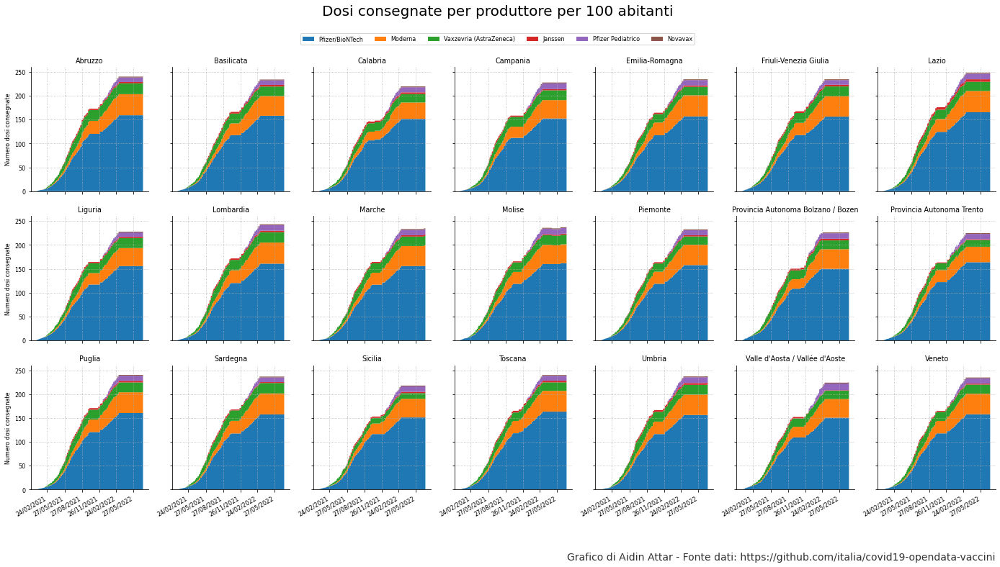

In [67]:
fig, ax = plt.subplots(nrows=3,ncols=7,figsize=(24,12), sharey=True, sharex=True)

colors=['red','violet','blue','orange','C0','violet','brown','black','plasma']
x=0
y=0
for key1 in consegne_fornitori.keys():
    ax[y,x].stackplot(consegne_fornitori[key1]['Pfizer/BioNTech'].index,[consegne_fornitori[key1][key]['cumulativa_numero_dosi_per100'] for key in consegne_fornitori[key1].keys()])
    ax[y,x].set_title(str(key1))
    ax[y,x].grid(linestyle='dotted')
    ax[y,x].spines['right'].set_visible(False)
    ax[y,x].spines['top'].set_visible(False)
    x+=1
    if x==7:
        x=0
        y+=1
ax[0,0].xaxis.set_major_locator(mdates.MonthLocator(interval=3))

fig.suptitle("Dosi consegnate per produttore per 100 abitanti", fontsize=20)
plt.rcParams['font.size'] = '8'
ax[0,0].tick_params(axis='both', labelsize=8)
#ax.grid(alpha = 0.2,linestyle='dotted')
ax[0,0].set_ylabel('Numero dosi consegnate')
ax[1,0].set_ylabel('Numero dosi consegnate')
ax[2,0].set_ylabel('Numero dosi consegnate')
ax[0,0].set_xlabel("")

labels = [key for key in consegne_fornitori['Emilia-Romagna'].keys()]
fig.legend(labels, loc='center',bbox_to_anchor=(.5,.925), ncol=len(labels), bbox_transform=fig.transFigure)

fig.autofmt_xdate()

plt.text(0.9, 0.1, 'Grafico di Aidin Attar - Fonte dati: https://github.com/italia/covid19-opendata-vaccini',
         transform=plt.gcf().transFigure,
         fontsize=14, color='black', alpha=0.8,
         ha='right', va='top', rotation='0')

plt.show()

In [68]:
for key in italia_età.keys():
    if key!='ND':
        if key=='Moderna':
            italia_età[key][           'dosi_consegnate'] = consegne_italia_fornitori[key]['numero_dosi']
            italia_età[key]['cumulativa_dosi_consegnate'] = consegne_italia_fornitori[key]['cumulativa_numero_dosi']
            italia_età[key][              'dosi_rimaste'] = italia_età[key]['cumulativa_dosi_consegnate'] - italia_età[key]['cumulativa_d1'] - italia_età[key]['cumulativa_d2'] - italia_età[key]['cumulativa_db1'] * .5
        else:
            italia_età[key][           'dosi_consegnate'] = consegne_italia_fornitori[key]['numero_dosi']
            italia_età[key]['cumulativa_dosi_consegnate'] = consegne_italia_fornitori[key]['cumulativa_numero_dosi']
            italia_età[key][              'dosi_rimaste'] = italia_età[key]['cumulativa_dosi_consegnate'] - italia_età[key]['cumulativa_totale']
    else:
        italia_età[key][           'dosi_consegnate'] = np.nan
        italia_età[key]['cumulativa_dosi_consegnate'] = np.nan
        italia_età[key][              'dosi_rimaste'] = np.nan

for key1 in somministrazioni_età.keys():
    for key2 in somministrazioni_età[key1].keys():
        if key2!='ND':
            if key2=='Moderna':
                somministrazioni_età[key1][key2][           'dosi_consegnate'] = consegne_fornitori[key1][key2]['numero_dosi']
                somministrazioni_età[key1][key2]['cumulativa_dosi_consegnate'] = consegne_fornitori[key1][key2]['cumulativa_numero_dosi']
                somministrazioni_età[key1][key2][              'dosi_rimaste'] = somministrazioni_età[key1][key2]['cumulativa_dosi_consegnate'] - somministrazioni_età[key1][key2]['cumulativa_d1'] - somministrazioni_età[key1][key2]['cumulativa_d2'] - somministrazioni_età[key1][key2]['cumulativa_db1'] * .5
                somministrazioni_età[key1][key2][       'dosi_rimaste_per100'] = somministrazioni_età[key1][key2]['dosi_rimaste'] / DictRegioni[key1] * 100

            else:
                somministrazioni_età[key1][key2][           'dosi_consegnate'] = consegne_fornitori[key1][key2]['numero_dosi']
                somministrazioni_età[key1][key2]['cumulativa_dosi_consegnate'] = consegne_fornitori[key1][key2]['cumulativa_numero_dosi']
                somministrazioni_età[key1][key2][              'dosi_rimaste'] = somministrazioni_età[key1][key2]['cumulativa_dosi_consegnate'] - somministrazioni_età[key1][key2]['cumulativa_totale']
                somministrazioni_età[key1][key2][       'dosi_rimaste_per100'] = somministrazioni_età[key1][key2]['dosi_rimaste'] / DictRegioni[key1] * 100
        else:
            somministrazioni_età[key1][key2][           'dosi_consegnate'] = np.nan
            somministrazioni_età[key1][key2]['cumulativa_dosi_consegnate'] = np.nan
            somministrazioni_età[key1][key2][              'dosi_rimaste'] = 0
            somministrazioni_età[key1][key2][       'dosi_rimaste_per100'] = 0


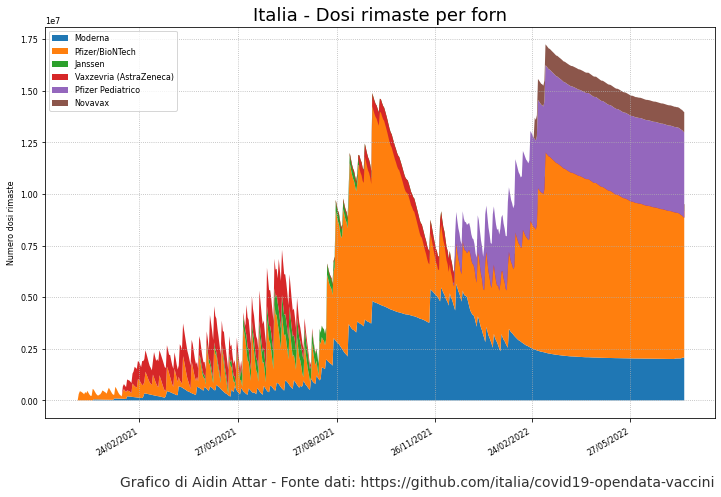

In [69]:
fig, ax = plt.subplots(figsize=(12,8))

colors=['red','violet','blue','orange','C0','violet','brown','yellow','green','black','purple']
ax.stackplot(italia_età['Pfizer/BioNTech'].index,[italia_età[key]['dosi_rimaste'] for key in italia_età.keys()])

ax.xaxis.set_major_locator(mdates.MonthLocator(interval=3))
labels = [key for key in italia_età.keys()]
ax.legend(labels, loc='upper left', ncol=1)
ax.set_title("Italia - Dosi rimaste per forn", fontsize=18)
plt.rcParams['font.size'] = '8'
ax.tick_params(axis='both', labelsize=8)
ax.grid(alpha = 1,linestyle='dotted')
ax.set_ylabel('Numero dosi rimaste')
ax.set_xlabel("")
fig.autofmt_xdate()

plt.text(0.9, 0.1, 'Grafico di Aidin Attar - Fonte dati: https://github.com/italia/covid19-opendata-vaccini',
         transform=plt.gcf().transFigure,
         fontsize=14, color='black', alpha=0.8,
         ha='right', va='top', rotation='0')

plt.show()

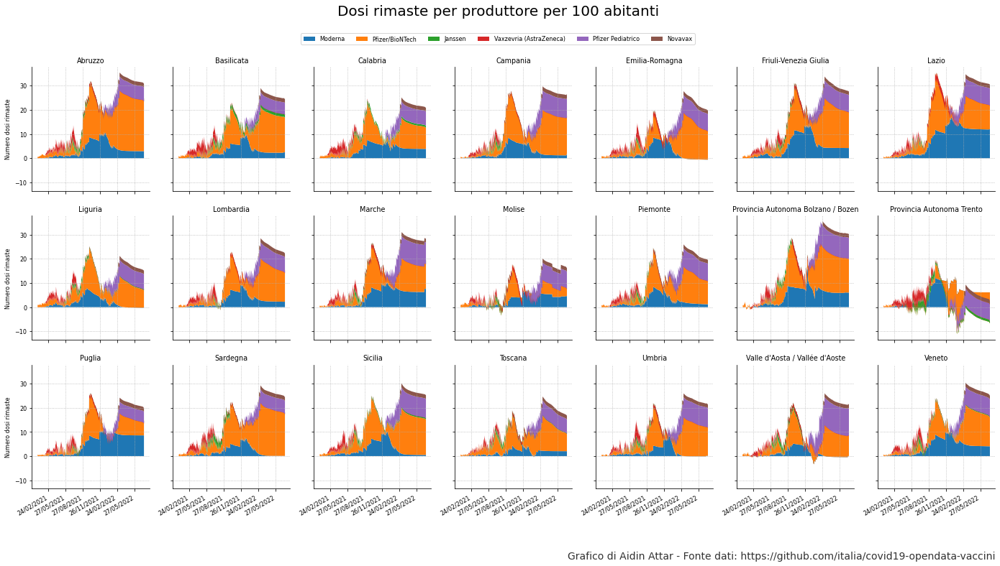

In [70]:
fig, ax = plt.subplots(nrows=3,ncols=7,figsize=(24,12), sharey=True, sharex=True)

colors=['red','violet','blue','orange','C0','violet','brown','black','plasma']
x=0
y=0
for key1 in somministrazioni_età.keys():
    ax[y,x].stackplot(somministrazioni_età[key1]['Pfizer/BioNTech'].index,[somministrazioni_età[key1][key]['dosi_rimaste_per100'] for key in somministrazioni_età[key1].keys()])
    ax[y,x].set_title(str(key1))
    ax[y,x].grid(linestyle='dotted')
    ax[y,x].spines['right'].set_visible(False)
    ax[y,x].spines['top'].set_visible(False)
    x+=1
    if x==7:
        x=0
        y+=1
ax[0,0].xaxis.set_major_locator(mdates.MonthLocator(interval=3))

fig.suptitle("Dosi rimaste per produttore per 100 abitanti", fontsize=20)
plt.rcParams['font.size'] = '8'
ax[0,0].tick_params(axis='both', labelsize=8)
#ax.grid(alpha = 0.2,linestyle='dotted')
ax[0,0].set_ylabel('Numero dosi rimaste')
ax[1,0].set_ylabel('Numero dosi rimaste')
ax[2,0].set_ylabel('Numero dosi rimaste')
ax[0,0].set_xlabel("")

labels = [key for key in somministrazioni_età['Emilia-Romagna'].keys()]
fig.legend(labels, loc='center',bbox_to_anchor=(.5,.925), ncol=len(labels), bbox_transform=fig.transFigure)

fig.autofmt_xdate()

plt.text(0.9, 0.1, 'Grafico di Aidin Attar - Fonte dati: https://github.com/italia/covid19-opendata-vaccini',
         transform=plt.gcf().transFigure,
         fontsize=14, color='black', alpha=0.8,
         ha='right', va='top', rotation='0')

plt.show()

Text(0.9, 0.05, 'Grafico di Aidin Attar - Fonte dati: https://github.com/italia/covid19-opendata-vaccini')

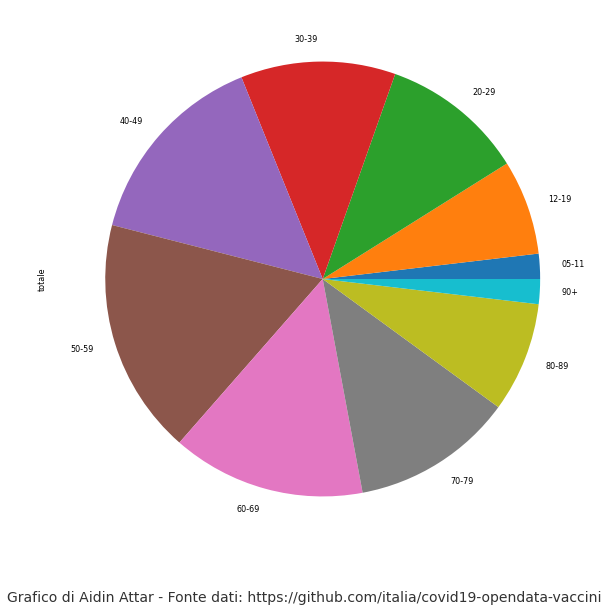

In [71]:
fig, ax = plt.subplots(figsize=(10,10))

anag.groupby(['eta']).sum().plot(ax = ax, kind='pie', y='totale', legend = False)

plt.rcParams['font.size'] = '10'
plt.rcParams['xtick.labelsize'] = '8'
plt.rcParams['ytick.labelsize'] = '8'

plt.xticks(rotation=30)
plt.text(0.9, 0.05, 'Grafico di Aidin Attar - Fonte dati: https://github.com/italia/covid19-opendata-vaccini', transform=plt.gcf().transFigure,
        fontsize=14, color='black', alpha=0.8,
        ha='right', va='bottom', rotation='0')

/tmp/ipykernel_64321/3561563833.py:5: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  sum_ = total.reindex(['PAT', 'PAB', 'EMR', 'VEN',


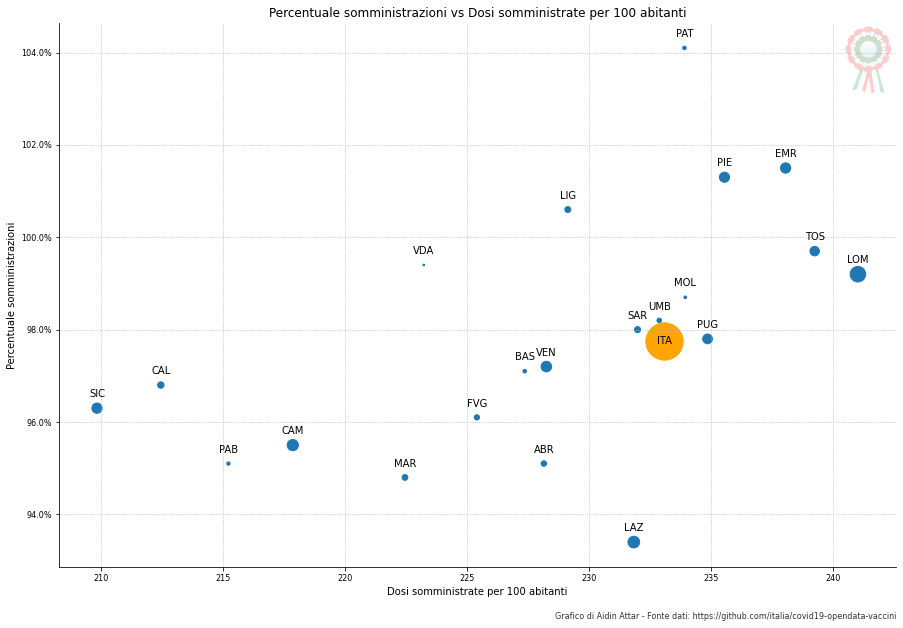

In [72]:
cum1     = cum.set_index('area')
vaccini1 = vaccini.set_index('area')
total = cum1.merge(vaccini1 , left_index=True, right_index=True, how='right')

sum_ = total.reindex(['PAT', 'PAB', 'EMR', 'VEN',
                      'VDA', 'UMB', 'ABR', 'BAS',
                      'SIC', 'SAR', 'CAL', 'CAM',
                      'PUG', 'PIE', 'LOM', 'MOL',
                      'LAZ', 'LIG', 'TOS', 'FVG', 'MAR']).sum().to_frame().transpose()
sum_ = sum_.rename(index={0: 'ITA'})
sum_['totale_per100']        = sum_['totale']     / PopoItalia * 100
sum_['cumulativa_totale_per100'] = sum_['cumulativa_totale'] / PopoItalia * 100
sum_['percentuale_somministrazione'] = sum_['dosi_somministrate'] / sum_['dosi_consegnate'] * 100

fig, ax=plt.subplots(figsize=(15,10))
total.plot.scatter(ax=ax,x='cumulativa_totale_per100', y='percentuale_somministrazione',
                        alpha=1, title='Percentuale somministrazioni vs Dosi somministrate per 100 abitanti',
                        color = 'C0', s=total['cumulativa_totale']/100000)
sum_.plot.scatter( ax=ax, x='cumulativa_totale_per100', y='percentuale_somministrazione',
                        alpha=1, color = 'orange', s=sum_.loc['ITA', 'cumulativa_totale']/100000)

for i, txt in enumerate(total.index):
    ax.annotate(txt, (total.cumulativa_totale_per100.iat[i], total.percentuale_somministrazione.iat[i]+0.3),ha='center', va='center')
txt = 'ITA'
ax.annotate(txt, (sum_.cumulativa_totale_per100.ITA, sum_.percentuale_somministrazione.ITA),ha='center', va='center')
ax.set(xlabel='Dosi somministrate per 100 abitanti', ylabel='Percentuale somministrazioni')
watermark2()
ax.yaxis.set_major_formatter(mtick.PercentFormatter())

ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
plt.text(0.9, .05, 'Grafico di Aidin Attar - Fonte dati: https://github.com/italia/covid19-opendata-vaccini', transform=plt.gcf().transFigure,
        fontsize=8, color='black', alpha=0.8,
        ha='right', va='bottom', rotation='0')


plt.grid(alpha = 1, linestyle='dotted')

plt.show()

Text(0.9, 0.0, 'Grafico di Aidin Attar - Fonte dati: https://github.com/italia/covid19-opendata-vaccini')

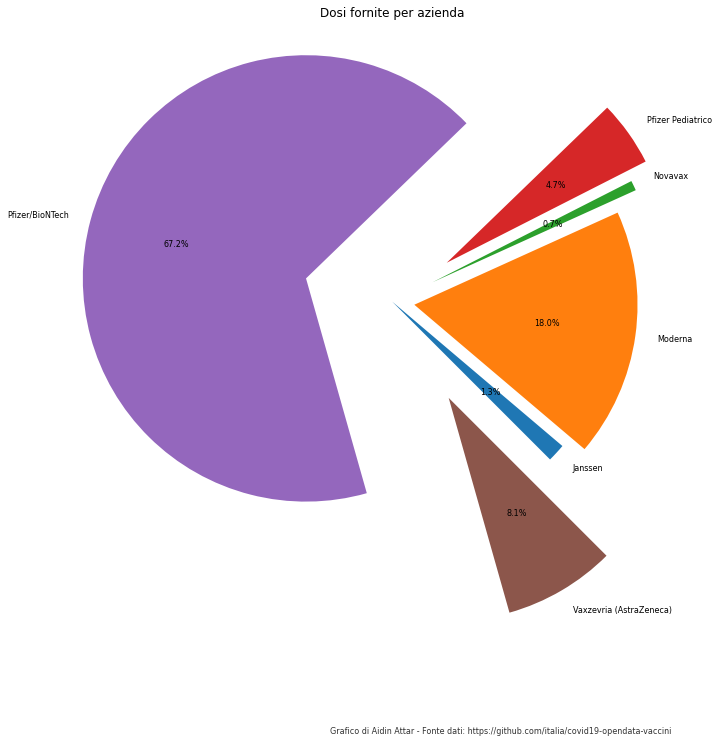

In [73]:
fig, ax = plt.subplots(figsize=(10,12))
cons.groupby('forn').sum().plot(ax=ax, kind = 'pie',
                                     y = 'numero_dosi', legend = False,
                                     ylabel = '', xlabel = '',
                                     fontsize = 8, title = 'Dosi fornite per azienda',
                                     autopct='%1.1f%%',startangle=-45,
                                     explode=[i/10 for i in range(len(consegne_italia_fornitori.keys()))] )
plt.text(0.9, 0., 'Grafico di Aidin Attar - Fonte dati: https://github.com/italia/covid19-opendata-vaccini', transform=plt.gcf().transFigure,
        fontsize=8, color='black', alpha=0.8,
        ha='right', va='bottom', rotation='0')

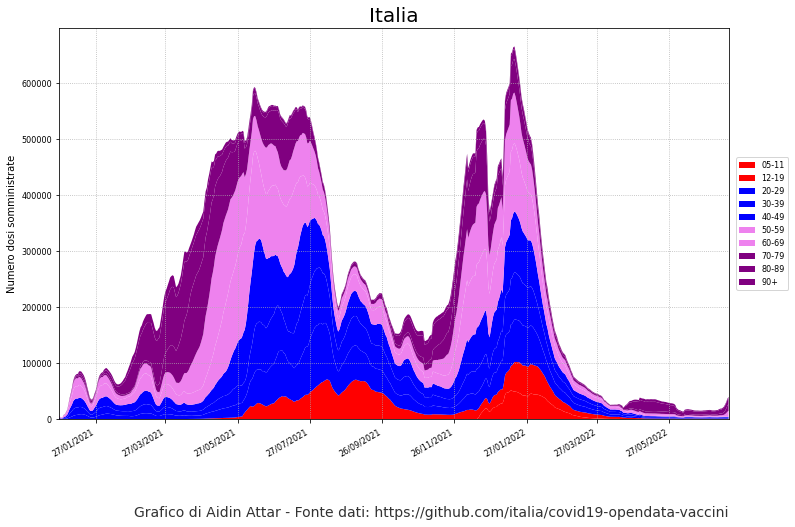

In [74]:
fig, ax = plt.subplots(figsize=(12,8))

colors=['red','red','blue','blue','blue','violet','violet','purple','purple','purple']
ax.stackplot(italia_fornitori['50-59'].index,[italia_fornitori[key]['media_totale'] for key in sorted(italia_fornitori.keys())], colors = colors)

label=[key for key in sorted(italia_fornitori.keys())]
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=2))
ax.set_title("Italia", fontsize=20)
plt.rcParams['font.size'] = '8'
ax.tick_params(axis='both', labelsize=8)
ax.grid(alpha = 1,linestyle='dotted')
ax.set_ylabel('Numero dosi somministrate')
ax.set_xlabel("")
fig.autofmt_xdate()
#ax.set_ylim(top=1)
ax.set_xlim([date(2020, 12, 27).strftime('%d/%m/%Y'), yesterday.strftime('%d/%m/%Y')])
ax.legend(label, loc = 'center', bbox_to_anchor=(1.05, 0.5))

plt.text(0.9, 0.05, 'Grafico di Aidin Attar - Fonte dati: https://github.com/italia/covid19-opendata-vaccini',
         transform=plt.gcf().transFigure,
         fontsize=14, color='black', alpha=0.8,
         ha='right', va='top', rotation='0')

plt.show()

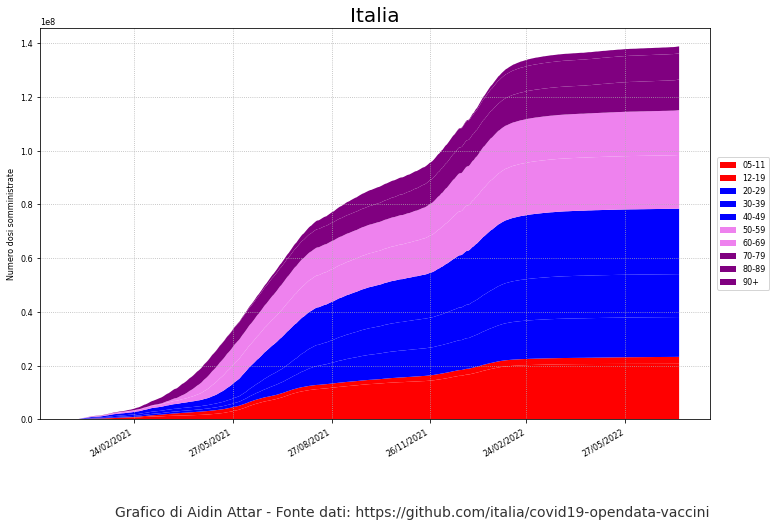

In [75]:
fig, ax = plt.subplots(figsize=(12,8))

colors=['red','red','blue','blue','blue','violet','violet','purple','purple','purple']
ax.stackplot(italia_fornitori['50-59'].index,[italia_fornitori[key]['cumulativa_totale'] for key in italia_fornitori.keys()], colors=colors)

label=[key for key in sorted(italia_fornitori.keys())]
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=3))
ax.set_title("Italia", fontsize=20)
plt.rcParams['font.size'] = '8'
ax.tick_params(axis='both', labelsize=8)
ax.grid(alpha = 1,linestyle='dotted')
ax.set_ylabel('Numero dosi somministrate')
ax.set_xlabel("")
fig.autofmt_xdate()
ax.legend(label, loc = 'center', bbox_to_anchor=(1.05, 0.5))

plt.text(0.9, 0.05, 'Grafico di Aidin Attar - Fonte dati: https://github.com/italia/covid19-opendata-vaccini',
         transform=plt.gcf().transFigure,
         fontsize=14, color='black', alpha=0.8,
         ha='right', va='top', rotation='0')

plt.show()

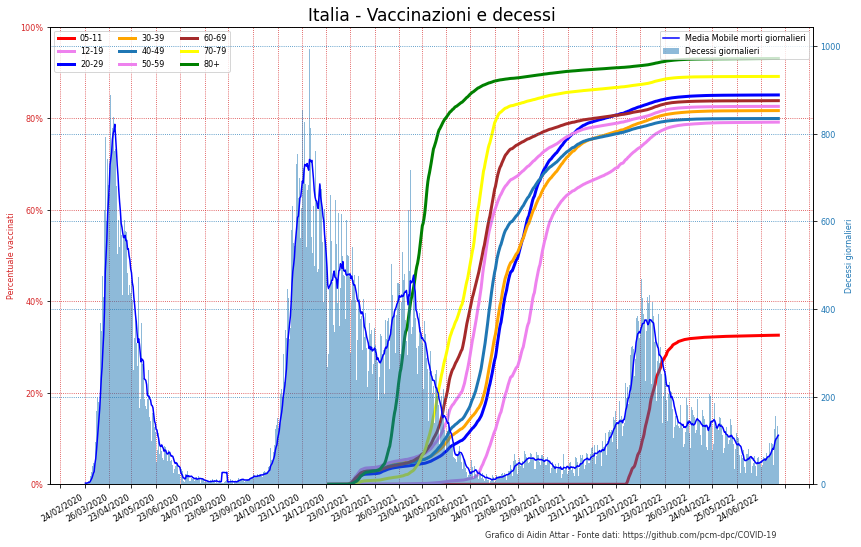

In [76]:
fig, ax1 = plt.subplots(figsize=(12, 8))

color = 'tab:red'
ax1.set_xlabel('')
ax1.set_ylabel('Percentuale vaccinati', color=color)
colors=['red','violet','blue','orange','C0','violet','brown','yellow','green','black','purple']
i=0
for key in sorted(new_italia_fornitori.keys()):
    ax1.plot(new_italia_fornitori[key].index,new_italia_fornitori[key]['perc_cumulativa_d2'], color=colors[i],label=str(key), lw=3)
    i+=1
ax1.set_ylim(bottom=0, top=100)
ax1.legend(loc='upper left', ncol=3)
fig.autofmt_xdate()

ax1.tick_params(axis='y', labelcolor=color)
ax1.grid(linestyle='dotted',color=color)
ax1.xaxis.set_major_locator(mdates.MonthLocator(interval=1))

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
color = 'tab:blue'
ax2.set_ylabel('Decessi giornalieri', color=color)

ax2.bar(italia_contagio.index, italia_contagio.morti_giornalieri, color=color, width=1, alpha=0.5,label='Decessi giornalieri', zorder=1)
ax2.plot(italia_contagio.index, italia_contagio['media_morti_giorn'],
        color = 'blue', label = 'Media Mobile morti giornalieri',zorder=2)
ax1.set_title('Italia - Vaccinazioni e decessi', fontsize=17)
plt.rcParams['font.size'] = '8'
ax2.set_ylim(bottom=0)
ax2.set_xlabel('')
ax2.tick_params(axis='y', labelcolor=color)
ax2.legend(loc='upper right')

ax2.grid(linestyle='dotted', color=color)
ax1.yaxis.set_major_formatter(mtick.PercentFormatter())

plt.text(0.9, 0.075, 'Grafico di Aidin Attar - Fonte dati: https://github.com/pcm-dpc/COVID-19',
         transform=plt.gcf().transFigure,
         fontsize=8, color='black', alpha=0.8,
         ha='right', va='top', rotation='0')

fig.tight_layout()  # otherwise the right y-label is slightly clipped
plt.show()


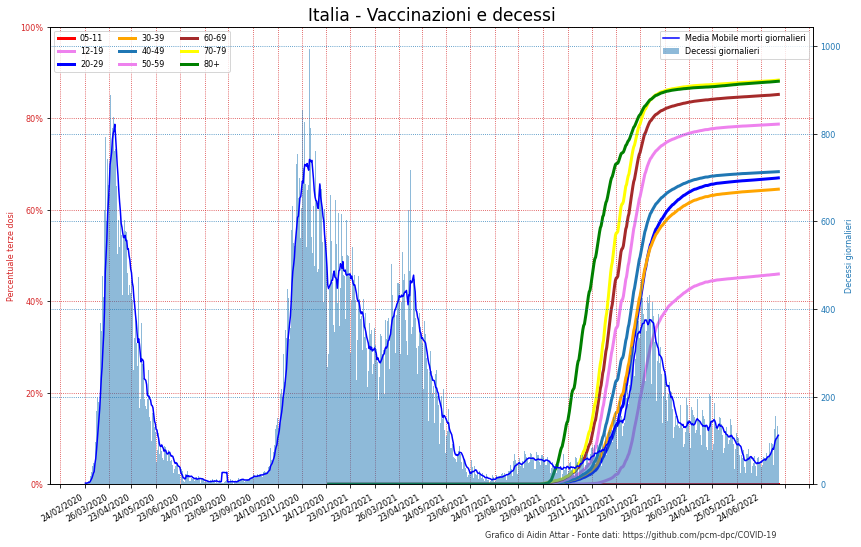

In [77]:
fig, ax1 = plt.subplots(figsize=(12, 8))

color = 'tab:red'
ax1.set_xlabel('')
ax1.set_ylabel('Percentuale terze dosi', color=color)
colors=['red','violet','blue','orange','C0','violet','brown','yellow','green','black','purple']
i=0
for key in sorted(new_italia_fornitori.keys()):
    ax1.plot(new_italia_fornitori[key].index,new_italia_fornitori[key]['perc_cumulativa_db1'], color=colors[i],label=str(key), lw=3)
    i+=1
ax1.set_ylim(bottom=0, top=100)
ax1.legend(loc='upper left', ncol=3)
fig.autofmt_xdate()

ax1.tick_params(axis='y', labelcolor=color)
ax1.grid(linestyle='dotted',color=color)
ax1.xaxis.set_major_locator(mdates.MonthLocator(interval=1))

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
color = 'tab:blue'
ax2.set_ylabel('Decessi giornalieri', color=color)

ax2.bar(italia_contagio.index, italia_contagio.morti_giornalieri, color=color, width=1, alpha=0.5,label='Decessi giornalieri', zorder=1)
ax2.plot(italia_contagio.index, italia_contagio['media_morti_giorn'],
        color = 'blue', label = 'Media Mobile morti giornalieri',zorder=2)
ax1.set_title('Italia - Vaccinazioni e decessi', fontsize=17)
plt.rcParams['font.size'] = '8'
ax2.set_ylim(bottom=0)
ax2.set_xlabel('')
ax2.tick_params(axis='y', labelcolor=color)
ax2.legend(loc='upper right')

ax2.grid(linestyle='dotted', color=color)
ax1.yaxis.set_major_formatter(mtick.PercentFormatter())

plt.text(0.9, 0.075, 'Grafico di Aidin Attar - Fonte dati: https://github.com/pcm-dpc/COVID-19',
         transform=plt.gcf().transFigure,
         fontsize=8, color='black', alpha=0.8,
         ha='right', va='top', rotation='0')

fig.tight_layout()  # otherwise the right y-label is slightly clipped
plt.show()


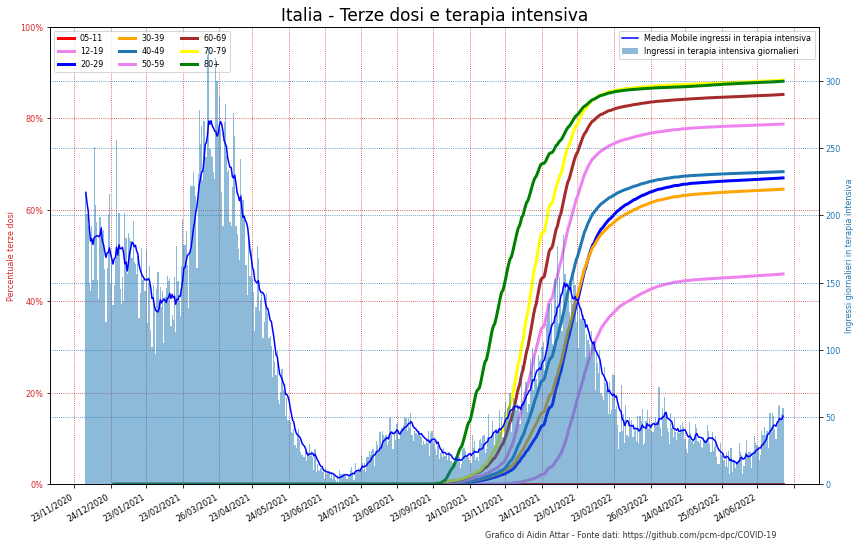

In [78]:
fig, ax1 = plt.subplots(figsize=(12, 8))

color = 'tab:red'
ax1.set_xlabel('')
ax1.set_ylabel('Percentuale terze dosi', color=color)
colors=['red','violet','blue','orange','C0','violet','brown','yellow','green','black','purple']
i=0
for key in sorted(new_italia_fornitori.keys()):
    ax1.plot(new_italia_fornitori[key].index,new_italia_fornitori[key]['perc_cumulativa_db1'], color=colors[i],label=str(key), lw=3)
    i+=1
ax1.set_ylim(bottom=0, top=100)
ax1.legend(loc='upper left', ncol=3)
fig.autofmt_xdate()

ax1.tick_params(axis='y', labelcolor=color)
ax1.grid(linestyle='dotted',color=color)
ax1.xaxis.set_major_locator(mdates.MonthLocator(interval=1))

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
color = 'tab:blue'
ax2.set_ylabel('Ingressi giornalieri in terapia intensiva', color=color)

ax2.bar(italia_contagio.index, italia_contagio.ingressi_terapia_intensiva, color=color, width=1, alpha=0.5,label='Ingressi in terapia intensiva giornalieri', zorder=1)
ax2.plot(italia_contagio.index, italia_contagio['media_ingressi_terapia_intensiva'],
        color = 'blue', label = 'Media Mobile ingressi in terapia intensiva',zorder=2)
ax1.set_title('Italia - Terze dosi e terapia intensiva', fontsize=17)
plt.rcParams['font.size'] = '8'
ax2.set_ylim(bottom=0)
ax2.set_xlabel('')
ax2.tick_params(axis='y', labelcolor=color)
ax2.legend(loc='upper right')

ax2.grid(linestyle='dotted', color=color)
ax1.yaxis.set_major_formatter(mtick.PercentFormatter())

plt.text(0.9, 0.075, 'Grafico di Aidin Attar - Fonte dati: https://github.com/pcm-dpc/COVID-19',
         transform=plt.gcf().transFigure,
         fontsize=8, color='black', alpha=0.8,
         ha='right', va='top', rotation='0')

fig.tight_layout()  # otherwise the right y-label is slightly clipped
plt.show()

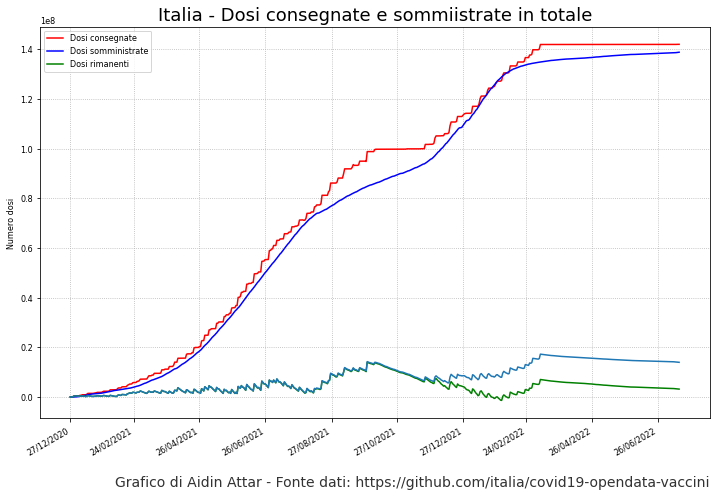

In [79]:
fig, ax = plt.subplots(figsize=(12,8))

#colors=['red','violet','blue','orange','C0','violet','brown','yellow','green','black','purple']
ax.plot(consegne_italia_fornitori['Pfizer/BioNTech'].index,sum(consegne_italia_fornitori[key]['cumulativa_numero_dosi'] for key in consegne_italia_fornitori.keys()), color='red')
ax.plot(italia.index,italia.cumulativa_totale, color='blue')
ax.plot(consegne_italia_fornitori['Pfizer/BioNTech'].index,sum(consegne_italia_fornitori[key]['cumulativa_numero_dosi'] for key in consegne_italia_fornitori.keys())-italia.cumulativa_totale, color='green')
ax.plot(italia_età['Pfizer/BioNTech'].index,sum(italia_età[key]['dosi_rimaste'] for key in italia_età.keys()))

ax.xaxis.set_major_locator(mdates.MonthLocator(interval=2))
labels = ['Dosi consegnate', 'Dosi somministrate', 'Dosi rimanenti']
ax.legend(labels, loc='upper left', ncol=1)
ax.set_title("Italia - Dosi consegnate e sommiistrate in totale", fontsize=18)
plt.rcParams['font.size'] = '8'
ax.tick_params(axis='both', labelsize=8)
ax.grid(alpha = 1,linestyle='dotted')
ax.set_ylabel('Numero dosi')
ax.set_xlabel("")
fig.autofmt_xdate()

plt.text(0.9, 0.1, 'Grafico di Aidin Attar - Fonte dati: https://github.com/italia/covid19-opendata-vaccini',
         transform=plt.gcf().transFigure,
         fontsize=14, color='black', alpha=0.8,
         ha='right', va='top', rotation='0')

plt.show()

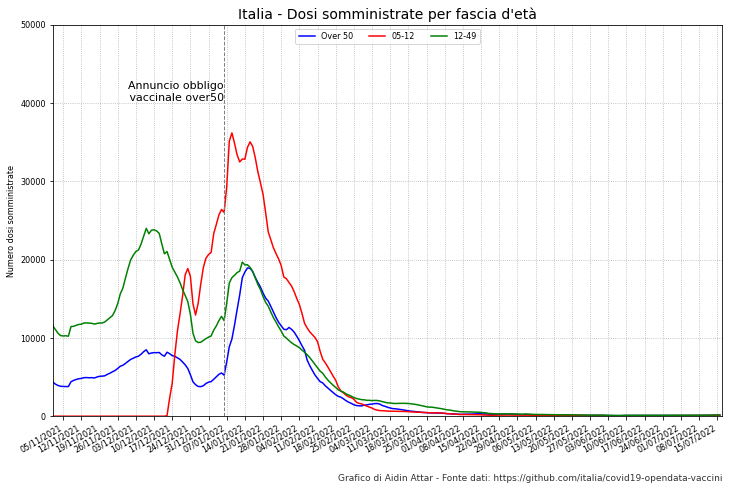

In [80]:
fig, ax = plt.subplots(figsize=(12,8))

ax.plot(italia_fornitori['50-59'].index,italia_fornitori['50-59']['media_d1']+
                                        italia_fornitori['60-69']['media_d1']+
                                        italia_fornitori['70-79']['media_d1']+
                                        italia_fornitori['80-89']['media_d1']+
                                        italia_fornitori[  '90+']['media_d1'], color='blue')
ax.plot(italia_fornitori['50-59'].index,italia_fornitori['05-11']['media_d1'], color='red')
ax.plot(italia_fornitori['50-59'].index,italia_fornitori['12-19']['media_d1']+
                                        italia_fornitori['20-29']['media_d1']+
                                        italia_fornitori['30-39']['media_d1']+
                                        italia_fornitori['40-49']['media_d1'], color='green')
ax.vlines(date(2022, 1, 6).strftime('%d/%m/%Y'),0,200000, linestyle='dashed', lw=1, color='grey')

label=['Over 50', '05-12', '12-49']
ax.xaxis.set_major_locator(mdates.WeekdayLocator(interval=1))
ax.set_title("Italia - Dosi somministrate per fascia d'età", fontsize=14)
plt.rcParams['font.size'] = '8'
ax.tick_params(axis='both', labelsize=8)
ax.grid(alpha = 1,linestyle='dotted')
ax.set_ylabel('Numero dosi somministrate')
ax.set_xlabel("")
fig.autofmt_xdate()
#ax.set_ylim(top=1)
ax.set_xlim([date(2021, 11, 1).strftime('%d/%m/%Y'), today.strftime('%d/%m/%Y')])
ax.set_ylim(bottom=0, top=5e4)
ax.legend(label, loc = 'upper center',ncol=3)
ax.annotate('Annuncio obbligo\n vaccinale over50', (date(2022, 1, 6).strftime('%d/%m/%Y'), 40000),fontsize=11,ha='right', va='bottom')

plt.text(0.9, 0.1, 'Grafico di Aidin Attar - Fonte dati: https://github.com/italia/covid19-opendata-vaccini',
         transform=plt.gcf().transFigure,
         fontsize=9, color='black', alpha=0.8,
         ha='right', va='top', rotation='0')

plt.show()

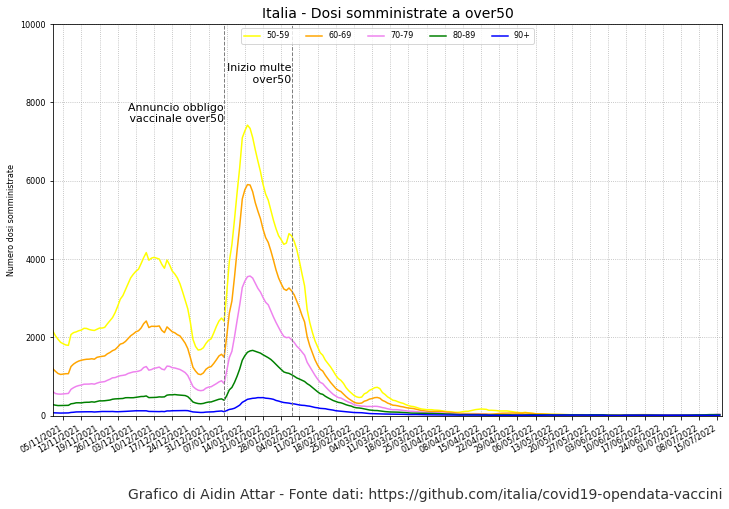

In [81]:
fig, ax = plt.subplots(figsize=(12,8))

ax.plot(italia_fornitori['50-59'].index,italia_fornitori['50-59']['media_d1'], color='yellow')
ax.plot(italia_fornitori['50-59'].index,italia_fornitori['60-69']['media_d1'], color='orange')
ax.plot(italia_fornitori['50-59'].index,italia_fornitori['70-79']['media_d1'], color='violet')
ax.plot(italia_fornitori['50-59'].index,italia_fornitori['80-89']['media_d1'], color='green')
ax.plot(italia_fornitori['50-59'].index,italia_fornitori[  '90+']['media_d1'], color='blue')
ax.vlines(date(2022, 1, 6).strftime('%d/%m/%Y'),0,20000, linestyle='dashed', lw=1, color='grey')
ax.vlines(date(2022, 2, 1).strftime('%d/%m/%Y'),0,20000, linestyle='dashed', lw=1, color='grey')

label=['50-59', '60-69', '70-79', '80-89', '90+']
ax.xaxis.set_major_locator(mdates.WeekdayLocator(interval=1))
ax.set_title("Italia - Dosi somministrate a over50", fontsize=14)
plt.rcParams['font.size'] = '8'
ax.tick_params(axis='both', labelsize=8)
ax.grid(alpha = 1,linestyle='dotted')
ax.set_ylabel('Numero dosi somministrate')
ax.set_xlabel("")
fig.autofmt_xdate()
#ax.set_ylim(top=1)
ax.set_xlim([date(2021, 11, 1).strftime('%d/%m/%Y'), today.strftime('%d/%m/%Y')])
ax.set_ylim(bottom=0, top=1e4)
ax.legend(label, loc = 'upper center',ncol=5)

ax.annotate('Annuncio obbligo\n vaccinale over50', (date(2022, 1, 6).strftime('%d/%m/%Y'), 8000),fontsize=11,ha='right', va='top')
ax.annotate('Inizio multe\n over50', (date(2022, 2, 1).strftime('%d/%m/%Y'), 9000),fontsize=11,ha='right', va='top')

plt.text(0.9, 0.075, 'Grafico di Aidin Attar - Fonte dati: https://github.com/italia/covid19-opendata-vaccini',
         transform=plt.gcf().transFigure,
         fontsize=14, color='black', alpha=0.8,
         ha='right', va='top', rotation='0')

plt.show()

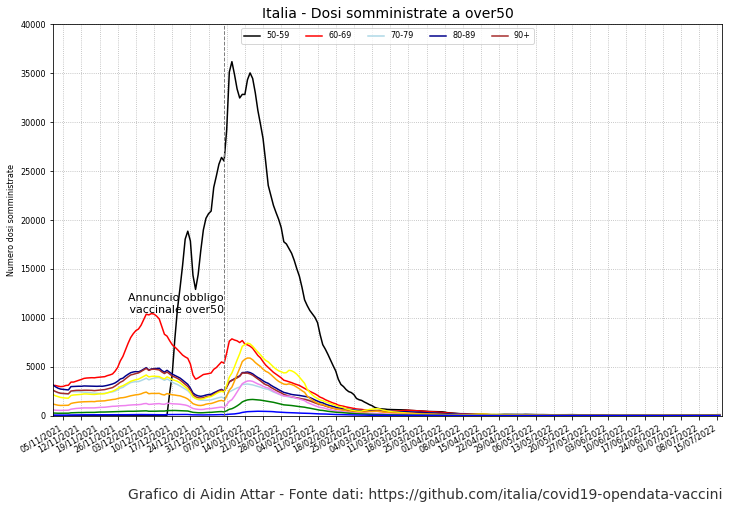

In [82]:
fig, ax = plt.subplots(figsize=(12,8))

ax.plot(italia_fornitori['50-59'].index,italia_fornitori['05-11']['media_d1'], color='black')
ax.plot(italia_fornitori['50-59'].index,italia_fornitori['12-19']['media_d1'], color='red')
ax.plot(italia_fornitori['50-59'].index,italia_fornitori['20-29']['media_d1'], color='lightblue')
ax.plot(italia_fornitori['50-59'].index,italia_fornitori['30-39']['media_d1'], color='darkblue')
ax.plot(italia_fornitori['50-59'].index,italia_fornitori['40-49']['media_d1'], color='brown')
ax.plot(italia_fornitori['50-59'].index,italia_fornitori['50-59']['media_d1'], color='yellow')
ax.plot(italia_fornitori['50-59'].index,italia_fornitori['60-69']['media_d1'], color='orange')
ax.plot(italia_fornitori['50-59'].index,italia_fornitori['70-79']['media_d1'], color='violet')
ax.plot(italia_fornitori['50-59'].index,italia_fornitori['80-89']['media_d1'], color='green')
ax.plot(italia_fornitori['50-59'].index,italia_fornitori[  '90+']['media_d1'], color='blue')
ax.vlines(date(2022, 1, 6).strftime('%d/%m/%Y'),0,4e4, linestyle='dashed', lw=1, color='grey')

label=['50-59', '60-69', '70-79', '80-89', '90+']
ax.xaxis.set_major_locator(mdates.WeekdayLocator(interval=1))
ax.set_title("Italia - Dosi somministrate a over50", fontsize=14)
plt.rcParams['font.size'] = '8'
ax.tick_params(axis='both', labelsize=8)
ax.grid(alpha = 1,linestyle='dotted')
ax.set_ylabel('Numero dosi somministrate')
ax.set_xlabel("")
fig.autofmt_xdate()
#ax.set_ylim(top=1)
ax.set_xlim([date(2021, 11, 1).strftime('%d/%m/%Y'), today.strftime('%d/%m/%Y')])
ax.set_ylim(bottom=0, top=4e4)
ax.legend(label, loc = 'upper center',ncol=5)

ax.annotate('Annuncio obbligo\n vaccinale over50', (date(2022, 1, 6).strftime('%d/%m/%Y'), 12500),fontsize=11,ha='right', va='top')

plt.text(0.9, 0.075, 'Grafico di Aidin Attar - Fonte dati: https://github.com/italia/covid19-opendata-vaccini',
         transform=plt.gcf().transFigure,
         fontsize=14, color='black', alpha=0.8,
         ha='right', va='top', rotation='0')

plt.show()

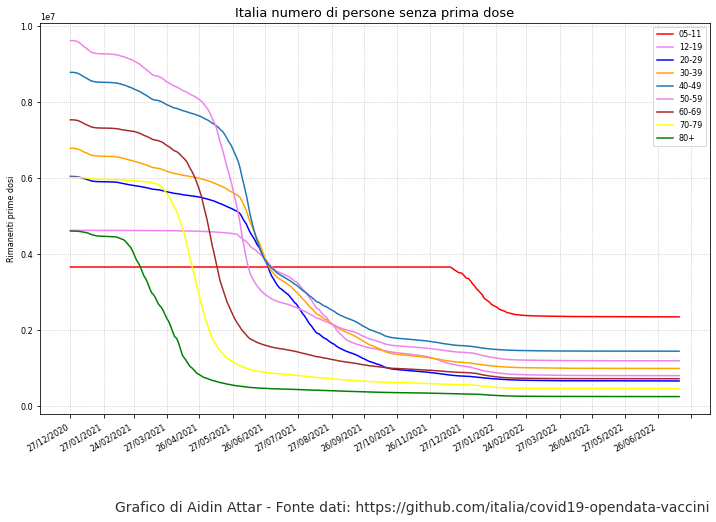

In [83]:
fig, ax = plt.subplots(figsize=(12,8))

colors=['red','violet','blue','orange','C0','violet','brown','yellow','green','black','purple']
i=0
for key in sorted(new_italia_fornitori.keys()):
    ax.plot(new_italia_fornitori[key].index,new_italia_fornitori[key]['rimasti_cumulativa_d1'], color=colors[i],label=str(key))
    i+=1

ax.xaxis.set_major_locator(mdates.MonthLocator(interval=1))
ax.legend(loc='best')
ax.set_title("Italia numero di persone senza prima dose", fontsize=13)
plt.rcParams['font.size'] = '8'
ax.tick_params(axis='both', labelsize=8)
ax.grid(alpha = 0.8,linestyle='dotted')
ax.set_ylabel('Rimanenti prime dosi')
ax.set_xlabel("")
fig.autofmt_xdate()
#ax.yaxis.set_major_formatter(mtick.PercentFormatter())

plt.text(0.9, 0.05, 'Grafico di Aidin Attar - Fonte dati: https://github.com/italia/covid19-opendata-vaccini',
         transform=plt.gcf().transFigure,
         fontsize=14, color='black', alpha=0.8,
         ha='right', va='top', rotation='0')

plt.show()

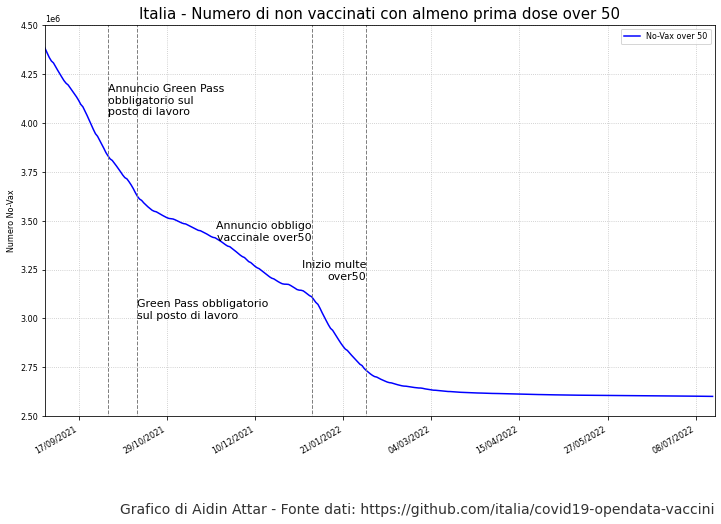

In [84]:
fig, ax = plt.subplots(figsize=(12,8))

colors=['red','violet','blue','orange','C0','violet','brown','yellow','green','black','purple']
ax.plot(new_italia_fornitori['50-59'].index,new_italia_fornitori['50-59']['rimasti_cumulativa_d1']+
                                            new_italia_fornitori['60-69']['rimasti_cumulativa_d1']+
                                            new_italia_fornitori['70-79']['rimasti_cumulativa_d1']+
                                            new_italia_fornitori[  '80+']['rimasti_cumulativa_d1'], color='blue',label='No-Vax over 50')
ax.vlines(date(2022,  1,  6).strftime('%d/%m/%Y'),0,8e6, linestyle='dashed', lw=1, color='grey')
ax.vlines(date(2022,  2,  1).strftime('%d/%m/%Y'),0,8e6, linestyle='dashed', lw=1, color='grey')
ax.vlines(date(2021, 10, 15).strftime('%d/%m/%Y'),0,8e6, linestyle='dashed', lw=1, color='grey')
ax.vlines(date(2021, 10,  1).strftime('%d/%m/%Y'),0,8e6, linestyle='dashed', lw=1, color='grey')

ax.xaxis.set_major_locator(mdates.WeekdayLocator(interval=6))
ax.set_xlim([date(2021, 9, 1).strftime('%d/%m/%Y'), today.strftime('%d/%m/%Y')])
ax.legend(loc='best')
ax.set_title("Italia - Numero di non vaccinati con almeno prima dose over 50", fontsize=15)
plt.rcParams['font.size'] = '8'
ax.tick_params(axis='both', labelsize=8)
ax.grid(alpha = 0.8,linestyle='dotted')
ax.set_ylabel('Numero No-Vax')
ax.set_xlabel("")
fig.autofmt_xdate()
ax.set_ylim(bottom=2.5e6, top=4.5e6)

ax.annotate('Annuncio obbligo\nvaccinale over50',                     (date(2022,  1,  6).strftime('%d/%m/%Y'), 3.5e6),fontsize=11,ha='right', va='top')
ax.annotate('Inizio multe\nover50',                                   (date(2022,  2,  1).strftime('%d/%m/%Y'), 3.3e6),fontsize=11,ha='right', va='top')
ax.annotate('Green Pass obbligatorio\nsul posto di lavoro',           (date(2021, 10, 15).strftime('%d/%m/%Y'), 3.1e6),fontsize=11,ha='left',  va='top')
ax.annotate('Annuncio Green Pass\nobbligatorio sul\nposto di lavoro', (date(2021, 10,  1).strftime('%d/%m/%Y'), 4.2e6),fontsize=11,ha='left',  va='top')

plt.text(0.9, 0.05, 'Grafico di Aidin Attar - Fonte dati: https://github.com/italia/covid19-opendata-vaccini',
         transform=plt.gcf().transFigure,
         fontsize=14, color='black', alpha=0.8,
         ha='right', va='top', rotation='0')

plt.show()

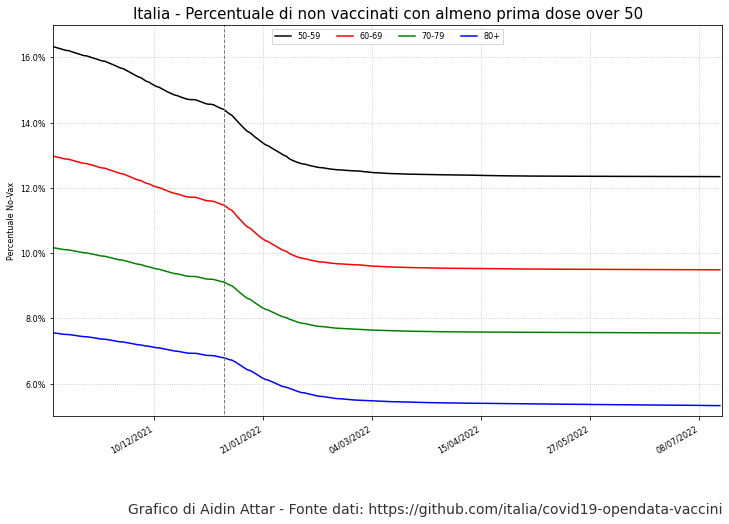

In [85]:
fig, ax = plt.subplots(figsize=(12,8))

colors=['red','violet','blue','orange','C0','violet','brown','yellow','green','black','purple']
ax.plot(new_italia_fornitori['50-59'].index,(new_italia_fornitori['50-59']['rimasti_cumulativa_d1']-new_italia_fornitori['50-59']['dpi'])/Platea_Italia['50-59']*100, color='black',label='50-59')
ax.plot(new_italia_fornitori['60-69'].index,(new_italia_fornitori['60-69']['rimasti_cumulativa_d1']-new_italia_fornitori['60-69']['dpi'])/Platea_Italia['60-69']*100, color='red',label='60-69')
ax.plot(new_italia_fornitori['70-79'].index,(new_italia_fornitori['70-79']['rimasti_cumulativa_d1']-new_italia_fornitori['70-79']['dpi'])/Platea_Italia['70-79']*100, color='green',label='70-79')
ax.plot(new_italia_fornitori[  '80+'].index,(new_italia_fornitori[  '80+']['rimasti_cumulativa_d1']-new_italia_fornitori[  '80+']['dpi'])/Platea_Italia[  '80+']*100, color='blue',label='80+')
ax.vlines(date(2022, 1, 6).strftime('%d/%m/%Y'),0,20, linestyle='dashed', lw=1, color='grey')

ax.xaxis.set_major_locator(mdates.WeekdayLocator(interval=6))
ax.set_xlim([date(2021, 11, 1).strftime('%d/%m/%Y'), today.strftime('%d/%m/%Y')])
ax.legend(loc='upper center', ncol=4)
ax.set_title("Italia - Percentuale di non vaccinati con almeno prima dose over 50", fontsize=15)
plt.rcParams['font.size'] = '8'
ax.tick_params(axis='both', labelsize=8)
ax.grid(alpha = 0.8,linestyle='dotted')
ax.set_ylabel('Percentuale No-Vax')
ax.set_xlabel("")
fig.autofmt_xdate()
ax.set_ylim(bottom=5., top=17)
ax.yaxis.set_major_formatter(mtick.PercentFormatter())

plt.text(0.9, 0.05, 'Grafico di Aidin Attar - Fonte dati: https://github.com/italia/covid19-opendata-vaccini',
         transform=plt.gcf().transFigure,
         fontsize=14, color='black', alpha=0.8,
         ha='right', va='top', rotation='0')

plt.show()

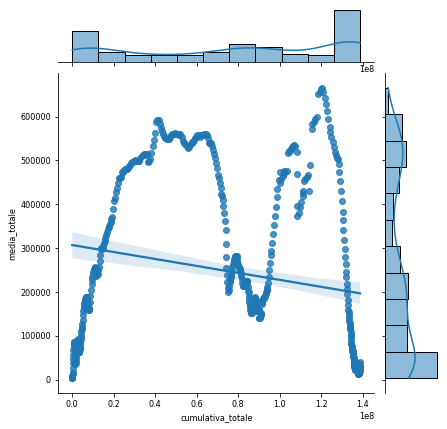

In [86]:
g = sns.jointplot(x='cumulativa_totale',
                  y='media_totale',
                  data=italia,
                  kind="reg")

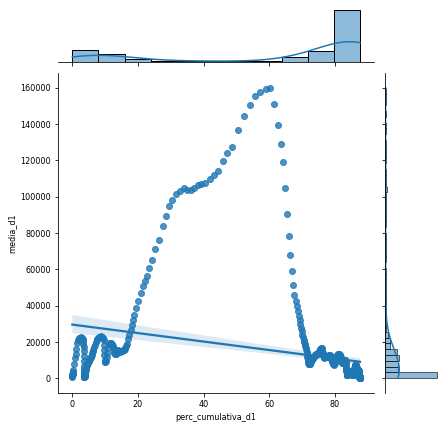

In [87]:
g = sns.jointplot(x='perc_cumulativa_d1',
                  y='media_d1',
                  data=new_italia_fornitori['50-59'],
                  kind="reg")

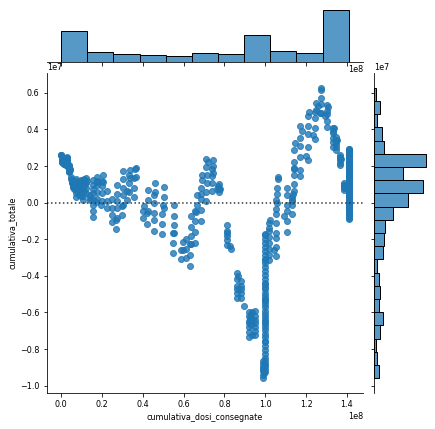

In [88]:
g = sns.jointplot(x='cumulativa_dosi_consegnate',
                  y='cumulativa_totale',
                  data=italia_età['Pfizer/BioNTech']+italia_età['Moderna']+italia_età['Janssen']+italia_età['Pfizer Pediatrico']+italia_età['Vaxzevria (AstraZeneca)'],
                  kind="resid")

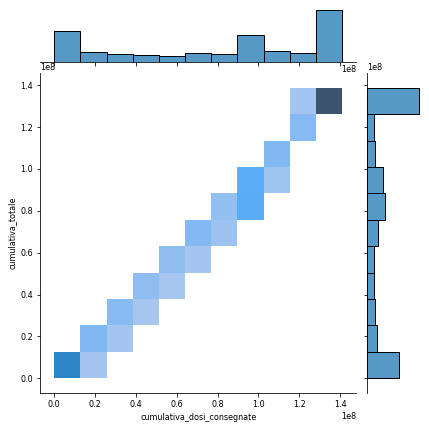

In [89]:
g = sns.jointplot(x='cumulativa_dosi_consegnate',
                  y='cumulativa_totale',
                  data=italia_età['Pfizer/BioNTech']+italia_età['Moderna']+italia_età['Janssen']+italia_età['Pfizer Pediatrico']+italia_età['Vaxzevria (AstraZeneca)'],
                  kind="hist")

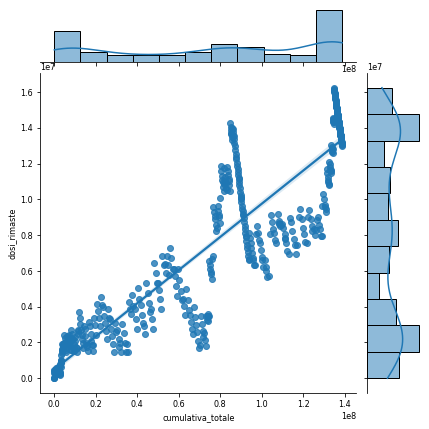

In [90]:
g = sns.jointplot(x='cumulativa_totale',
                  y='dosi_rimaste',
                  data=italia_età['Pfizer/BioNTech']+italia_età['Moderna']+italia_età['Janssen']+italia_età['Pfizer Pediatrico']+italia_età['Vaxzevria (AstraZeneca)'],
                  kind="reg")

In [91]:
overX_primadose   = [sum(new_italia_fornitori[key][ 'cumulativa_d1'].iloc[-1] for key in list(sorted(new_italia_fornitori.keys()))[i:]) / sum(Platea_Italia[key] for key in list(sorted(Platea_Italia.keys()))[i:]) * 100 for i in range(9)]
overX_secondadose = [sum(new_italia_fornitori[key][ 'cumulativa_d2'].iloc[-1] for key in list(sorted(new_italia_fornitori.keys()))[i:]) / sum(Platea_Italia[key] for key in list(sorted(Platea_Italia.keys()))[i:]) * 100 for i in range(9)]
overX_terzadose   = [sum(new_italia_fornitori[key]['cumulativa_db1'].iloc[-1] for key in list(sorted(new_italia_fornitori.keys()))[i:]) / sum(Platea_Italia[key] for key in list(sorted(Platea_Italia.keys()))[i:]) * 100 for i in range(9)]
overX_quartadose  = [sum(new_italia_fornitori[key]['cumulativa_db2'].iloc[-1] for key in list(sorted(new_italia_fornitori.keys()))[i:]) / sum(Platea_Italia[key] for key in list(sorted(Platea_Italia.keys()))[i:]) * 100 for i in range(9)]
label = ['over05','over12','over20','over30','over40','over50','over60','over70','over80',]

for i in range(9):
    print('Percentuale vaccinati con prima dose', label[i], ':\t\t\t', overX_primadose[i])
print('')
for i in range(9):
    print('Percentuale vaccinati con seconda dose', label[i], ':\t\t\t', overX_secondadose[i])
print('')
for i in range(9):
    print('Percentuale vaccinati con terza dose', label[i], ':\t\t\t', overX_terzadose[i])

Percentuale vaccinati con prima dose over05 :			 84.69328406873652
Percentuale vaccinati con prima dose over12 :			 87.99670555896179
Percentuale vaccinati con prima dose over20 :			 88.48555440734873
Percentuale vaccinati con prima dose over30 :			 88.39651267594934
Percentuale vaccinati con prima dose over40 :			 88.9394627732026
Percentuale vaccinati con prima dose over50 :			 90.62919867245697
Percentuale vaccinati con prima dose over60 :			 92.20617287324424
Percentuale vaccinati con prima dose over70 :			 93.40996128891298
Percentuale vaccinati con prima dose over80 :			 94.6701637121413

Percentuale vaccinati con seconda dose over05 :			 80.56626625189284
Percentuale vaccinati con seconda dose over12 :			 83.81471195356298
Percentuale vaccinati con seconda dose over20 :			 84.25235134739803
Percentuale vaccinati con seconda dose over30 :			 84.13728080561079
Percentuale vaccinati con seconda dose over40 :			 84.59684734689567
Percentuale vaccinati con seconda dose over50 :			 86

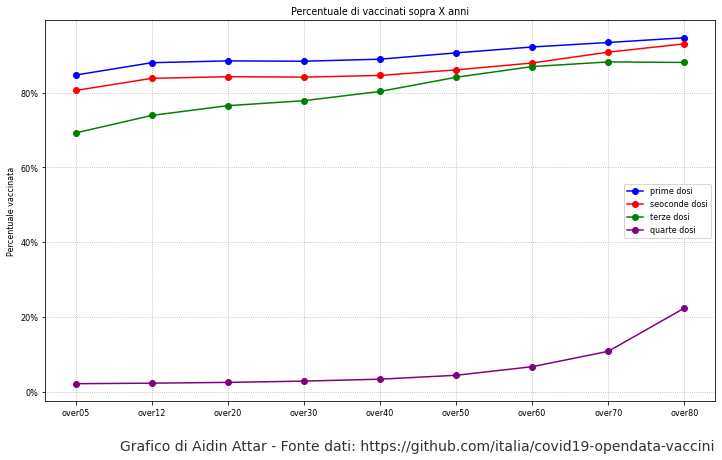

In [92]:
fig, ax = plt.subplots(figsize=(12,7))
ax.plot(label,overX_primadose,   marker='o', color= 'blue',  label=   'prime dosi')
ax.plot(label,overX_secondadose, marker='o', color=  'red',  label='seoconde dosi')
ax.plot(label,overX_terzadose,   marker='o', color='green',  label=   'terze dosi')
ax.plot(label,overX_quartadose,  marker='o', color='purple', label=  'quarte dosi')
ax.grid(linestyle='dotted')
ax.set_ylabel('Percentuale vaccinata')
ax.set_title('Percentuale di vaccinati sopra X anni')
ax.legend(loc='center right')
ax.yaxis.set_major_formatter(mtick.PercentFormatter())

plt.text(0.9, 0.05, 'Grafico di Aidin Attar - Fonte dati: https://github.com/italia/covid19-opendata-vaccini',
         transform=plt.gcf().transFigure,
         fontsize=14, color='black', alpha=0.8,
         ha='right', va='top', rotation='0')
plt.show()

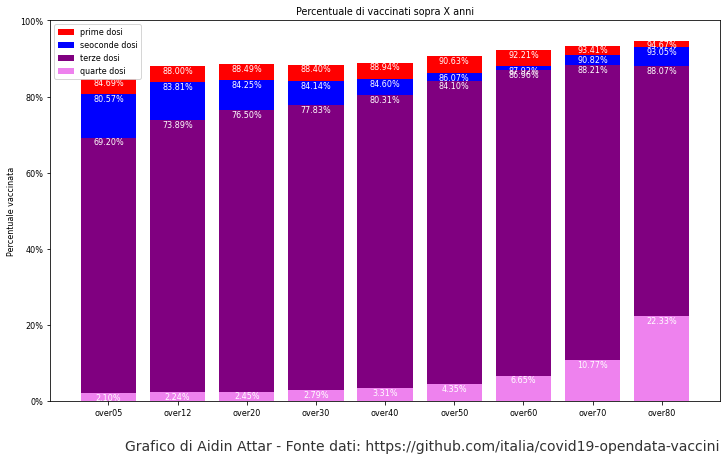

In [93]:
fig, ax = plt.subplots(figsize=(12,7))
#ax.plot(label,overX_primadose,   marker='o', color= 'blue', label=   'prime dosi')
#ax.plot(label,overX_secondadose, marker='o', color=  'red', label='seoconde dosi')
#ax.plot(label,overX_terzadose,   marker='o', color='green', label=   'terze dosi')

ax.bar(label,overX_primadose,   color=   'red', label=   'prime dosi')
ax.bar(label,overX_secondadose, color=  'blue', label='seoconde dosi')
ax.bar(label,overX_terzadose,   color='purple', label=   'terze dosi')
ax.bar(label,overX_quartadose,  color='violet', label=  'quarte dosi')

for index,data in zip(label,overX_primadose):
    if data != 0:
        plt.text(x=index , y =data , s=str("{:.2%}".format(data/100)), color = 'w',fontdict=dict(fontsize=8),ha='center', va='top')
for index,data in zip(label,overX_secondadose):
    if data != 0:
        plt.text(x=index , y =data , s=str("{:.2%}".format(data/100)), color = 'w',fontdict=dict(fontsize=8),ha='center', va='top')
for index,data in zip(label,overX_terzadose):
    if data != 0:
        plt.text(x=index , y =data , s=str("{:.2%}".format(data/100)), color = 'w',fontdict=dict(fontsize=8),ha='center', va='top')
for index,data in zip(label,overX_quartadose):
    if data != 0:
        plt.text(x=index , y =data , s=str("{:.2%}".format(data/100)), color = 'w',fontdict=dict(fontsize=8),ha='center', va='top')
ax.set_ylim([0,100])
#ax.grid(linestyle='dotted')
ax.set_ylabel('Percentuale vaccinata')
ax.set_title('Percentuale di vaccinati sopra X anni')
ax.legend(loc='upper left')

ax.yaxis.set_major_formatter(mtick.PercentFormatter())


plt.text(0.9, 0.05, 'Grafico di Aidin Attar - Fonte dati: https://github.com/italia/covid19-opendata-vaccini',
         transform=plt.gcf().transFigure,
         fontsize=14, color='black', alpha=0.8,
         ha='right', va='top', rotation='0')
plt.show()

In [94]:
index      = list(PercentualiRegioni.keys())
oggi_perc  = {elem : pd.DataFrame                  for elem in range(len(italia_fornitori.keys()))}
italy_perc = {elem : gpd.geodataframe.GeoDataFrame for elem in range(len(italia_fornitori.keys()))}

for i in range(len(oggi_perc)-1):
    perc          = [PercentualiRegioni[key].iloc[i] for key in PercentualiRegioni.keys()]
    oggi_perc[i]  = pd.DataFrame(perc, index=index)
    italy_perc[i] = gpd.read_file('italy-with-regions/reg2011_g.shp')

for i in range(len(oggi_perc)-1):
    oggi_perc[i].loc['Provincia Autonoma Trento'         ] *= list(PopolazioneRegioni['Provincia Autonoma Trento'         ].values())[i]/100
    oggi_perc[i].loc['Provincia Autonoma Bolzano / Bozen'] *= list(PopolazioneRegioni['Provincia Autonoma Bolzano / Bozen'].values())[i]/100

    sum_ = oggi_perc[i].reindex(['Provincia Autonoma Trento', 'Provincia Autonoma Bolzano / Bozen']).sum().to_frame().transpose()
    sum_ = sum_.rename(index={0: 'Trentino-Alto Adige'})
    oggi_perc[i].drop(['Provincia Autonoma Trento', 'Provincia Autonoma Bolzano / Bozen'],inplace=True)
    oggi_perc[i] = oggi_perc[i].append(sum_)
    oggi_perc[i] = oggi_perc[i].sort_index()
    oggi_perc[i].loc['Trentino-Alto Adige'] *= 100 / (list(PopolazioneRegioni['Provincia Autonoma Trento'].values())[i]+list(PopolazioneRegioni['Provincia Autonoma Bolzano / Bozen'].values())[i])

    italy_perc[i].sort_values(by = 'NOME_REG', inplace = True)
    italy_perc[i].reset_index(drop=True,       inplace = True)
    italy_perc[i].index = oggi_perc[i].index
    italy_perc[i] = italy_perc[i].merge(oggi_perc[i],left_index=True, right_index=True, how='right')

/tmp/ipykernel_64321/2166789633.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  oggi_perc[i] = oggi_perc[i].append(sum_)
/tmp/ipykernel_64321/2166789633.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  oggi_perc[i] = oggi_perc[i].append(sum_)
/tmp/ipykernel_64321/2166789633.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  oggi_perc[i] = oggi_perc[i].append(sum_)
/tmp/ipykernel_64321/2166789633.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  oggi_perc[i] = oggi_perc[i].append(sum_)
/tmp/ipykernel_64321/2166789633.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future vers

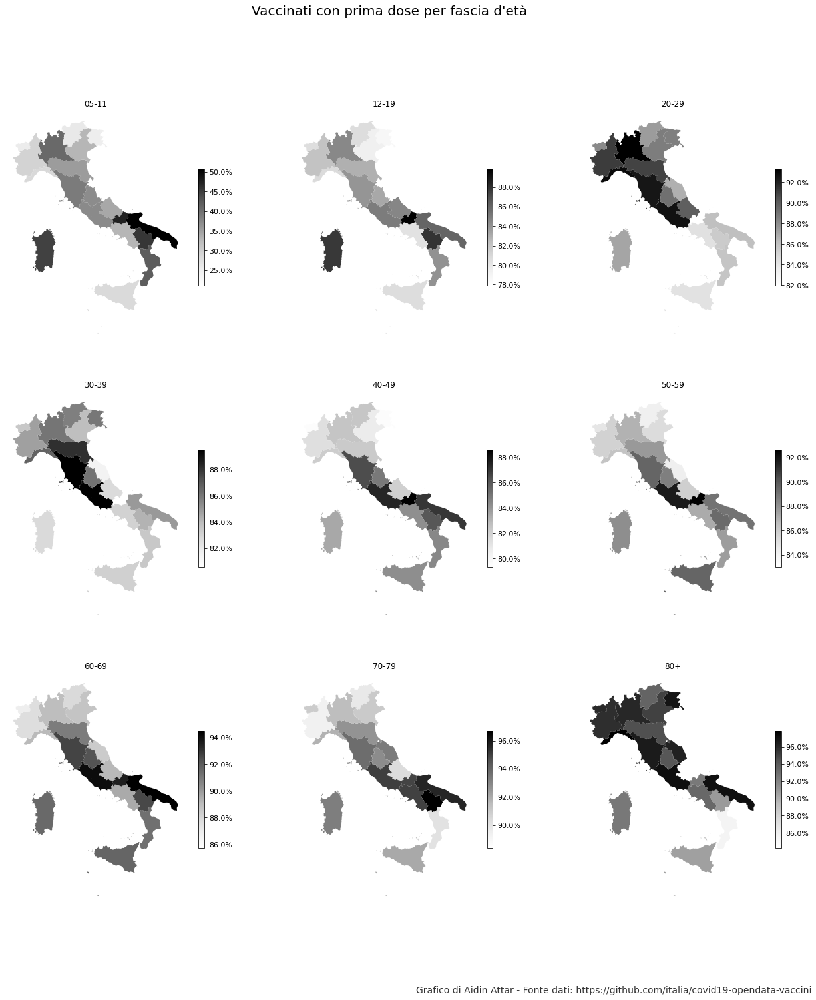

In [95]:
fig, ax = plt.subplots(nrows=3, ncols=3, figsize=(22, 22))

x=0
y=0
for i in range(len(oggi_perc)-1):
    ax[x,y].axis('off')
    col='d1'
    normalize = mcolors.Normalize(vmin=italy_perc[i][col].min(), vmax=italy_perc[i][col].max())
    scalarmappaple = cm.ScalarMappable(norm=normalize, cmap="Greys")

    italy_perc[i].plot(ax=ax[x,y],
                       column=col,
                       cmap="Greys")
    cbar = plt.colorbar(scalarmappaple, ax=ax[x,y],shrink=0.5)
    cbar.ax.tick_params(labelsize=11)
    cbar.ax.yaxis.set_major_formatter(mtick.PercentFormatter())

    y+=1
    if y==3:
        y=0
        x+=1


ax[0,0].set_title('05-11', fontsize=12)
ax[0,1].set_title('12-19', fontsize=12)
ax[0,2].set_title('20-29', fontsize=12)
ax[1,0].set_title('30-39', fontsize=12)
ax[1,1].set_title('40-49', fontsize=12)
ax[1,2].set_title('50-59', fontsize=12)
ax[2,0].set_title('60-69', fontsize=12)
ax[2,1].set_title('70-79', fontsize=12)
ax[2,2].set_title(  '80+', fontsize=12)

fig.suptitle("Vaccinati con prima dose per fascia d'età", fontsize=20)

plt.text(0.9, 0.05, 'Grafico di Aidin Attar - Fonte dati: https://github.com/italia/covid19-opendata-vaccini',
         transform=plt.gcf().transFigure,
         fontsize=14, color='black', alpha=0.8,
         ha='right', va='top', rotation='0')

plt.show()

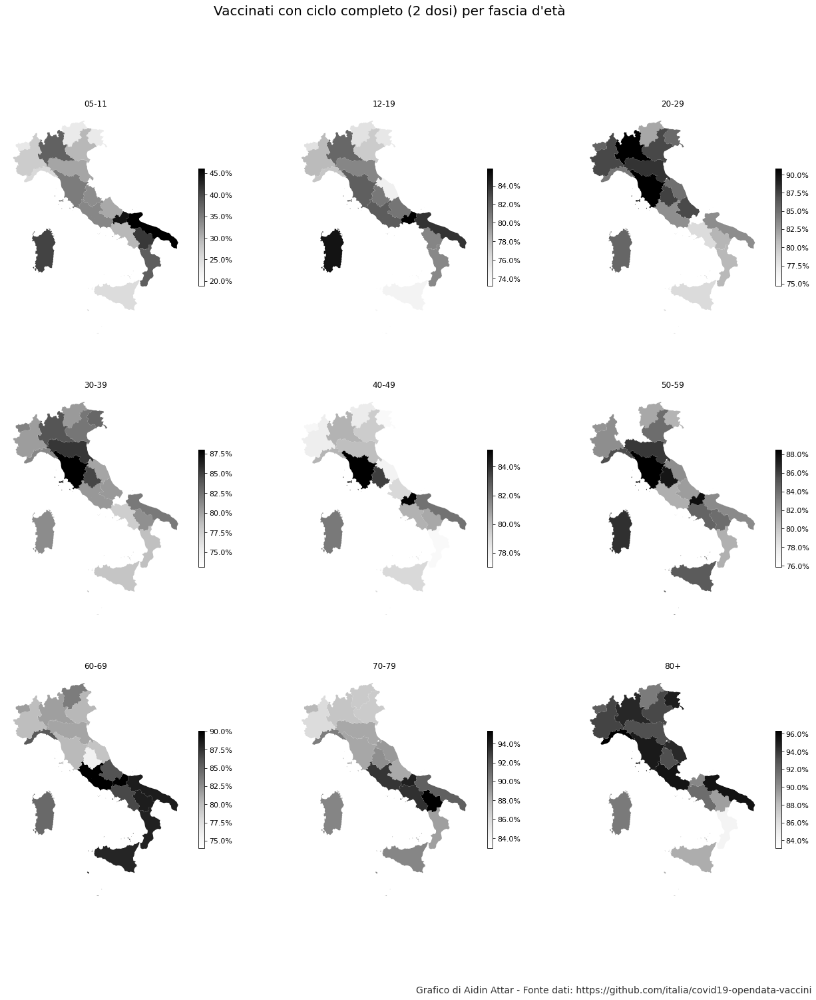

In [96]:
fig, ax = plt.subplots(nrows=3, ncols=3, figsize=(22, 22))

x=0
y=0
for i in range(len(oggi_perc)-1):
    ax[x,y].axis('off')
    col='d2'
    normalize = mcolors.Normalize(vmin=italy_perc[i][col].min(), vmax=italy_perc[i][col].max())
    scalarmappaple = cm.ScalarMappable(norm=normalize, cmap="Greys")

    italy_perc[i].plot(ax=ax[x,y],
                       column=col,
                       cmap="Greys")
    cbar = plt.colorbar(scalarmappaple, ax=ax[x,y],shrink=0.5)
    cbar.ax.tick_params(labelsize=11)
    cbar.ax.yaxis.set_major_formatter(mtick.PercentFormatter())

    y+=1
    if y==3:
        y=0
        x+=1


ax[0,0].set_title('05-11', fontsize=12)
ax[0,1].set_title('12-19', fontsize=12)
ax[0,2].set_title('20-29', fontsize=12)
ax[1,0].set_title('30-39', fontsize=12)
ax[1,1].set_title('40-49', fontsize=12)
ax[1,2].set_title('50-59', fontsize=12)
ax[2,0].set_title('60-69', fontsize=12)
ax[2,1].set_title('70-79', fontsize=12)
ax[2,2].set_title(  '80+', fontsize=12)

fig.suptitle("Vaccinati con ciclo completo (2 dosi) per fascia d'età", fontsize=20)

plt.text(0.9, 0.05, 'Grafico di Aidin Attar - Fonte dati: https://github.com/italia/covid19-opendata-vaccini',
         transform=plt.gcf().transFigure,
         fontsize=14, color='black', alpha=0.8,
         ha='right', va='top', rotation='0')

plt.show()

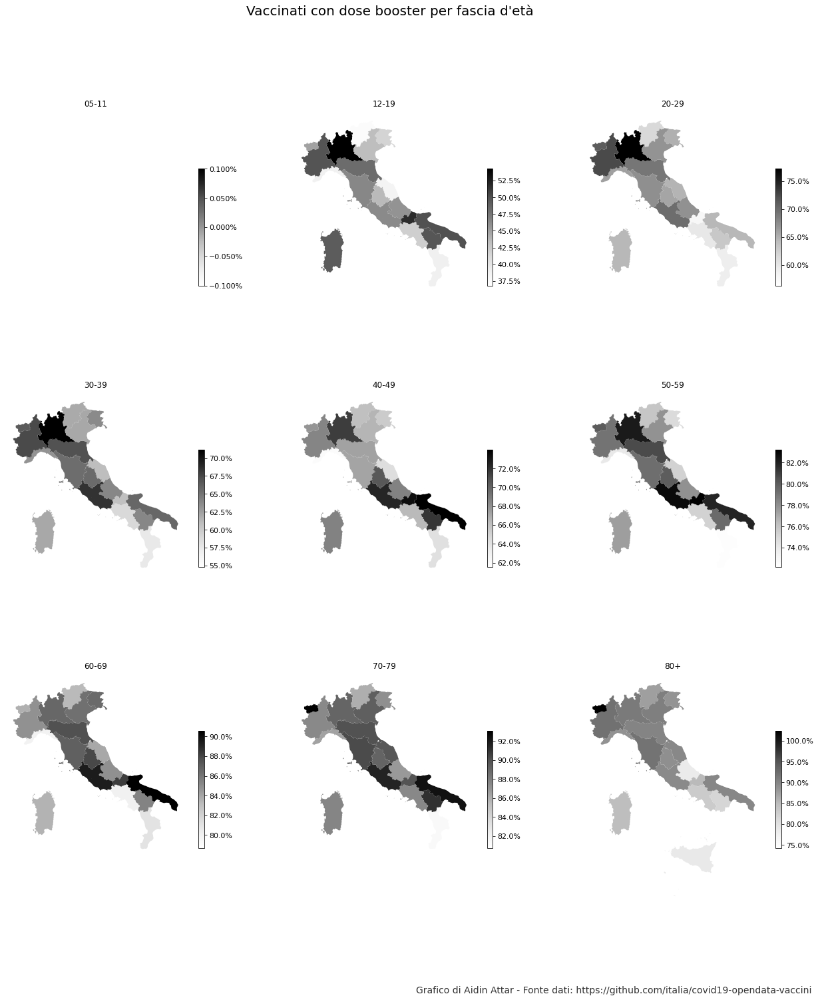

In [97]:
fig, ax = plt.subplots(nrows=3, ncols=3, figsize=(22, 22))

x=0
y=0
for i in range(len(oggi_perc)-1):
    ax[x,y].axis('off')
    col='db1'
    normalize = mcolors.Normalize(vmin=italy_perc[i][col].min(), vmax=italy_perc[i][col].max())
    scalarmappaple = cm.ScalarMappable(norm=normalize, cmap="Greys")

    italy_perc[i].plot(ax=ax[x,y],
                       column=col,
                       cmap="Greys")
    cbar = plt.colorbar(scalarmappaple, ax=ax[x,y],shrink=0.5)
    cbar.ax.tick_params(labelsize=11)
    cbar.ax.yaxis.set_major_formatter(mtick.PercentFormatter())

    y+=1
    if y==3:
        y=0
        x+=1


ax[0,0].set_title('05-11', fontsize=12)
ax[0,1].set_title('12-19', fontsize=12)
ax[0,2].set_title('20-29', fontsize=12)
ax[1,0].set_title('30-39', fontsize=12)
ax[1,1].set_title('40-49', fontsize=12)
ax[1,2].set_title('50-59', fontsize=12)
ax[2,0].set_title('60-69', fontsize=12)
ax[2,1].set_title('70-79', fontsize=12)
ax[2,2].set_title(  '80+', fontsize=12)

fig.suptitle("Vaccinati con dose booster per fascia d'età", fontsize=20)

plt.text(0.9, 0.05, 'Grafico di Aidin Attar - Fonte dati: https://github.com/italia/covid19-opendata-vaccini',
         transform=plt.gcf().transFigure,
         fontsize=14, color='black', alpha=0.8,
         ha='right', va='top', rotation='0')

plt.show()